In [23]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sys import exit
import pandas as pd
import glob
import pickle
from textwrap import wrap
import time
import itertools
from scipy import integrate
from scipy.spatial import distance
from scipy import stats
from copy import deepcopy
import sys
import matplotlib as mpl

sys.path.append('/Users/ashish/Documents/GitHub/metabolic-CRmodel/')



import importlib
import metabolic_CR_model_functions 
import metabolic_CR_model_class
importlib.reload(metabolic_CR_model_functions)
importlib.reload(metabolic_CR_model_class)
from metabolic_CR_model_functions import *
from metabolic_CR_model_class import *


fontSize=12
fontSizeSmall=10
labelSize=8


machine_precision=1e-6





'''
figure size and font settings
'''   
## figure settings
SMALL_SIZE = 10
MEDIUM_SIZE = 12
BIGGER_SIZE = 14

# plt.rc('font', size=SMALL_SIZE, family='sans-serif', serif='Arial')          # controls default text sizes
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE, titleweight='bold')     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE, labelweight='bold')    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.rc('text')

def create_color_list(scheme_name='sns_tab10'): 
    #https://matplotlib.org/3.1.0/gallery/color/named_colors.html
    #https://seaborn.pydata.org/tutorial/color_palettes.html
    if scheme_name.lower()=='tableau':
        color_list=list(mcolors.TABLEAU_COLORS.values())## only had 10 colors
    elif scheme_name.lower()=='css':
        color_list=list(mcolors.CSS4_COLORS.values())
    elif scheme_name.lower()=='base':
        color_list=list(mcolors.BASE_COLORS.values())
    elif scheme_name.lower()=='sns_tab10':
        color_list=list(sns.color_palette(palette='tab10'))
    elif scheme_name.lower()=='sns_deep':
        color_list=list(sns.color_palette(palette='deep'))
    elif scheme_name.lower()=='sns_muted':
        color_list=list(sns.color_palette(palette='muted'))
    elif scheme_name.lower()=='sns_colorblind':
        color_list=list(sns.color_palette(palette='colorblind'))
    elif scheme_name.lower()=='sns_spectral':
        color_list=list(sns.color_palette(palette='Spectral'))
    else:
        print ('scheme not implemented')
    if 'sns' not in scheme_name.lower():
        color_list=[color for color in color_list if sum(mcolors.to_rgb(color))<2.5] ## remove white
        mcolors.to_rgb(color_list[0])
    return  color_list

def statistics_of_outcomes(flux_in_community_list,reactions_in_final_community_list,
                              number_of_pools):
    flx_cutoff=1e-3
    flux_in_community_arr=np.array(flux_in_community_list)
    flux_in_community_arr[flux_in_community_arr<flx_cutoff]=0.       
    functional_distance_arr=distance.pdist(flux_in_community_arr,metric='jensenshannon')   
    nonzero_flux_counter=np.sum(flux_in_community_arr>flx_cutoff,axis=0)    
    outcome_stats={'functional_distance_arr':functional_distance_arr,
                  'nonzero_flux_counter':nonzero_flux_counter}
    return outcome_stats

def create_analysis_df(data_folder,file_name):
    analysis_file_name = 'analysis_'+file_name
    with open(data_folder+file_name, 'rb') as f:
        data_df = pickle.load(f)

    exp_conditions_list = data_df['exp_conditions_list']
    analysis_df = {'exp_conditions_list': exp_conditions_list}
    number_of_pools = data_df['number_of_pools']
    for expt_id, exp_condition in enumerate(exp_conditions_list):
        n_survivors_list = []
        reactions_in_final_community_list = []  # list of reactions in final community
        # list of reactions split by survivors as well
        reactions_in_final_survivors_list = []
        abundance_of_survivors_list = []
        idx_of_survivors_list = []
        enzyme_and_abundance_weighted_reactions_in_survivors_list = []
        enzyme_budget_allocated_to_reactions_in_survivors_list=[]
        fluxes_by_survivors_list=[]
        flux_in_community_list=[]
        params_list=[]
        for pool_id in range(number_of_pools):
            #         print(exp_condition,pool_id)
            current_df = data_df['pool'+str(pool_id)]['expt'+str(expt_id)]
            params_df=current_df['params']  
            params_list.append(params_df)
            Nf, Rf, Tf = current_df['SS_values']
            Nf = np.ravel(Nf)
            idx_survivors = np.ravel(np.nonzero(Nf))
            n_survivors_list.append(len(idx_survivors))
            n_reactions = params_df['n_reactions']
            reactions_in_final_community = np.zeros(n_reactions).astype(int)
            reactions_in_final_survivors = []
            abundance_of_survivors = []
            enzyme_and_abundance_weighted_reactions_in_survivors = []
            enzyme_budget_allocated_to_reactions_in_survivors = []
            fluxes_by_survivors=[]
            if len(idx_survivors) > 0:
                abundance_of_survivors = Nf[idx_survivors]
                if 'thermodynamic' in params_df['assumptions']['growth_type']:
                    nu_matrix = params_df['Enzyme_alloc']
                elif 'anabolism' in params_df['assumptions']['growth_type']:
                    nu_matrix = params_df['Enzyme_alloc']
                elif 'Michaelis-Menten' in params_df['assumptions']['growth_type']:
                    nu_matrix = params_df['Enzyme_alloc']
                elif 'product' in params_df['assumptions']['growth_type']:
                    nu_matrix = params_df['nu_max']
                for survivor in idx_survivors:
                    reactions_in_final_community[np.nonzero(
                        nu_matrix[survivor])] += 1
                    temp = np.zeros(n_reactions)
                    temp[np.nonzero(nu_matrix[survivor])] = 1
                    reactions_in_final_survivors.append(list(temp))
                    enzyme_and_abundance_weighted_reactions_in_survivors.append(
                        nu_matrix[survivor]*Nf[survivor])
                    enzyme_budget_allocated_to_reactions_in_survivors.append(
                        nu_matrix[survivor]/np.sum(nu_matrix[survivor]))
                def calc_fluxes(N,R,params):
                    return Make_flux_calculator(params_df['assumptions'])(N,R,params)
                fluxes_SS=calc_fluxes(Nf, Rf, params_df)
    #             tot_flux=np.sum(fluxes_SS,axis=0)
                for survivor in idx_survivors:          
                    fluxes_by_survivors.append(fluxes_SS[survivor]) 
                flux_community=np.sum(np.array(fluxes_by_survivors),axis=0)
            else:
                print ('no survivors')
                sys.exit(1)
            fluxes_by_survivors_list.append(fluxes_by_survivors)
            flux_in_community_list.append(flux_community)
    #         print('community',reactions_in_final_community)
            idx_of_survivors_list.append(idx_of_survivors_list)
            abundance_of_survivors_list.append(abundance_of_survivors)
            enzyme_and_abundance_weighted_reactions_in_survivors_list.append(
                enzyme_and_abundance_weighted_reactions_in_survivors)
            enzyme_budget_allocated_to_reactions_in_survivors_list.append(enzyme_budget_allocated_to_reactions_in_survivors)
            # list of reactions in final community
            reactions_in_final_community_list.append(reactions_in_final_community)
            reactions_in_final_survivors_list.append(reactions_in_final_survivors)

    #         print (exp_condition, pool_id)
    #         print ('idx survivors', idx_survivors)
    #         print ('survivor abundance',len(abundance_of_survivors), abundance_of_survivors)
    #         print ('survivor fluxes',np.shape(fluxes_by_survivors), fluxes_by_survivors)
    #         print ('reactions in survivors', np.shape(reactions_in_final_survivors), reactions_in_final_survivors)

        reaction_substrates=params_df['substrates']
        reaction_products=params_df['products']
        outcome_stats=statistics_of_outcomes(flux_in_community_list,reactions_in_final_community_list,
                              number_of_pools)  
        temp_df={'reactions_in_final_community_list': reactions_in_final_community_list,
                   'reactions_in_final_survivors_list': reactions_in_final_survivors_list,
                   'exp_condition': exp_condition,
                   'n_survivors_list': n_survivors_list,
                   'reaction_substrates': reaction_substrates, 'reaction_products': reaction_products,
                   'idx_of_survivors': idx_of_survivors_list, 'abundance_of_survivors': abundance_of_survivors_list,
                   'enzyme_and_abundance_weighted_reactions_in_survivors': enzyme_and_abundance_weighted_reactions_in_survivors_list,
                'enzyme_budget_allocated_to_reactions_in_survivors_list': enzyme_budget_allocated_to_reactions_in_survivors_list,
                 'fluxes_by_survivors_list':fluxes_by_survivors_list,'flux_in_community_list':flux_in_community_list,
                 'sim_params':params_list
                }
        temp_df.update(outcome_stats)
        n_resources=len(Rf)
        n_reactions=len(reaction_substrates)
        analysis_df.update({'expt'+str(expt_id): temp_df})

    analysis_df.update({'reaction_substrates': reaction_substrates,
                        'reaction_products': reaction_products,
                        'n_resources': n_resources, 'n_reactions': n_reactions,
                       'number_of_pools':number_of_pools})
    with open(data_folder+analysis_file_name, 'wb') as f:
        pickle.dump(analysis_df, f, protocol=2)
        


## Some useful functions defined

In [10]:
## plot functions

##################### when parameters other than Rsupply are varied.####
def plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, plot_for_R_Expt=None,
                                          pool_ids=np.arange(10).astype(int),
                                          area_scale_factor=100.,rel_flux_cutoff=1e-4,
                                         param_varied=''):
    n_resources=analysis_df['n_resources']
    n_reactions=analysis_df['n_reactions']
    substrates=analysis_df['reaction_substrates']
    products=analysis_df['reaction_products']
    exp_conditions_list = analysis_df['exp_conditions_list']
    n_pools=len(pool_ids)
    color_list=create_color_list(scheme_name='sns_deep')
    n_exp_conditions=len(exp_conditions_list)
    fig= plt.figure(figsize=(5*n_pools,5*n_exp_conditions))
    for pool_ctr, pool_id in enumerate(pool_ids):
        for expt_id, exp_condition in enumerate(exp_conditions_list):
            expt_df = analysis_df['expt'+str(expt_id)]
            reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
            abundance_list=expt_df['abundance_of_survivors']
#             Enz_and_N_weighted_reactions_in_survivors_list=expt_df['enzyme_and_abundance_weighted_reactions_in_survivors']
            reactions_in_survivors=np.array(reactions_in_final_survivors_list[pool_id]  )
            abundance_survivors=abundance_list[pool_id]
#             Enz_and_N_weighted_reactions=np.array(Enz_and_N_weighted_reactions_in_survivors_list[pool_id])
            fluxes_by_survivors_list=expt_df['fluxes_by_survivors_list']
            fluxes_by_survivors_arr= np.array(fluxes_by_survivors_list[pool_id])
            params_df=expt_df['sim_params'][pool_id]
#             print(np.shape(fluxes_by_survivors_arr))
#             print(np.shape(Enz_and_N_weighted_reactions))
            
#             ax1 = fig.add_subplot(1,n_pools,pool_ctr+1)
            ax1 = fig.add_subplot(n_exp_conditions,n_pools,
                                  expt_id*n_pools+ pool_ctr+1)


            if n_resources==4:    
                resources_dict={0:[0.5, .95],1:[0.1, .7],
                               2:[0.95, .39],
                               3:[0.23, .05]}
            elif n_resources==6:
                resources_dict={0:[0.5, .97],1:[0.15, .75],
                               2:[0.3, .55],
                               3:[0.9, .42], 4:[0.6, .2],
                               5:[0.5, .02]}
            else:
                print('this nresources has not been positioned yet',n_resources)
                sys.exit(1)

            for ax in [ax1]:
                for key,val in resources_dict.items():    
                    ax.text(val[0],val[1],'R'+str(key), color='black',
                             bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')

#                     ax.text(val[0],val[1],'R'+str(key)+' ({:.1f})'.format(
#                         params_df['Energies'][key] ), color='black',
#                              bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
                    ##draw arrows
#                     for i in range(n_reactions):   
#                         ax.annotate('',xy=(resources_dict[products[i]]),
#                                      xytext=(resources_dict[substrates[i]]),
#                                      arrowprops=dict(facecolor='black', shrink=0.075,width=1))
                ax.set_xticks([])  
                ax.set_yticks([])  
        #### add inset axis and pie chart to each reaction.
            ax_subplot=ax1

            if len(abundance_survivors)>0: ## if there are any survivors at all
                for reaction in range(n_reactions):                 
                    h,w=0.15,0.15
                    x,y=(np.array(resources_dict[products[reaction]])+         
                         np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2    

                    if np.any(reactions_in_survivors[:,reaction]>0):
                        idx_sp=np.nonzero(fluxes_by_survivors_arr[:,reaction])## species that have the reaction    
                        weights=np.squeeze(fluxes_by_survivors_arr[idx_sp,reaction])
                        pie_radius=np.sqrt(np.sum(weights)/area_scale_factor)  

                        if np.sum(weights)>rel_flux_cutoff:#1e-4:## changed from 1e-2 on 1-17-22
                            ax_inset=ax_subplot.inset_axes([x,y, h,w])
                            weighted_fracs=np.squeeze(weights/np.sum(weights))
                            if len(idx_sp[0])==1:
                                weighted_fracs=np.array(weighted_fracs).reshape(1)
            #                 print(weighted_fracs)
            #                     sp_fracs=abundance_survivors[idx_sp]/np.sum(abundance_survivors[idx_sp])
                            ax_inset.pie(weighted_fracs, autopct='%1.0f%%',
                                         colors=np.array(color_list)[idx_sp],
                                    radius=pie_radius, startangle=90)

                            ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
                                                 xytext=(resources_dict[substrates[reaction]]),
                                                 arrowprops=dict(facecolor='black', shrink=0.075,width=1))
                w,h=0.25,0.1
                ax_inset=ax_subplot.inset_axes([0.725,0.05, w,h])
    #             ax_inset.yaxis.set_major_locator(mpl.ticker.LogLocator(numticks=3))
                rel_abundance=abundance_survivors/np.sum(abundance_survivors)
                for i in range(len(rel_abundance)):       
                    ax_inset.barh(i,rel_abundance[i],label='s',color=np.array(color_list)[i], log=False)
    #             ax_inset.set_xticks([1e-1, 5e-2, 1.]) 
                ax_inset.set_xticks([0.1,0.5, 1.]) 
                ax_inset.set_yticks([])   
                ax_inset.set_xlabel('relative abundance')
                n_survivors=len(reactions_in_survivors)
                ax_subplot.set_title(str(pool_id)+', '+ param_varied+'='+
                                     '{:.1e}'.format(exp_condition),
                                    weight='normal')
                ax_subplot.text(0.02,.98,str(n_survivors)+' survivors', ha='left',va='top')
#             if plot_for_R_Expt is None: 
#                 if exp_condition[1]== plot_pairs['val2']:
#                     fig.patch.set_facecolor('white')
#                     plt.tight_layout()
#                     plt.show()
#     if plot_for_R_Expt is not None:
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()
    
    

def plot_rxn_nwk_Enzyme_piechart_nspecies_otherparams(analysis_df, plot_for_R_Expt=None,
                                          pool_ids=np.arange(10).astype(int),
                                          area_scale_factor=100.,
                                         param_varied=''):
    n_resources=analysis_df['n_resources']
    n_reactions=analysis_df['n_reactions']
    substrates=analysis_df['reaction_substrates']
    products=analysis_df['reaction_products']
    exp_conditions_list = analysis_df['exp_conditions_list']

    n_pools=len(pool_ids)
    color_list=create_color_list(scheme_name='sns_deep')
    n_exp_conditions=len(exp_conditions_list)
    fig= plt.figure(figsize=(5*n_pools,5*n_exp_conditions))
    for pool_ctr, pool_id in enumerate(pool_ids):
        for expt_id, exp_condition in enumerate(exp_conditions_list):
            expt_df = analysis_df['expt'+str(expt_id)]
            reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
            abundance_list=expt_df['abundance_of_survivors']
            Enz_and_N_weighted_reactions_in_survivors_list=expt_df['enzyme_and_abundance_weighted_reactions_in_survivors']
            reactions_in_survivors=np.array(reactions_in_final_survivors_list[pool_id]  )
            abundance_survivors=abundance_list[pool_id]
            Enz_and_N_weighted_reactions=np.array(Enz_and_N_weighted_reactions_in_survivors_list[pool_id])
            
            R_exp=exp_condition
#             ax1 = fig.add_subplot(1,n_pools,pool_ctr+1)
            ax1 = fig.add_subplot(n_exp_conditions,n_pools,
                                  expt_id*n_pools+ pool_ctr+1)

            


            if n_resources==4:    
                resources_dict={0:[0.5, .95],1:[0.1, .7],
                               2:[0.95, .39],
                               3:[0.23, .05]}
            elif n_resources==6:
                resources_dict={0:[0.5, .97],1:[0.15, .75],
                               2:[0.3, .55],
                               3:[0.9, .42], 4:[0.6, .2],
                               5:[0.5, .02]}
            else:
                print('this nresources has not been positioned yet',n_resources)
                sys.exit(1)

            for ax in [ax1]:
                for key,val in resources_dict.items():    
                    ax.text(val[0],val[1],'R'+str(key), color='black',
                             bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
                    ##draw arrows
#                     for i in range(n_reactions):   
#                         ax.annotate('',xy=(resources_dict[products[i]]),
#                                      xytext=(resources_dict[substrates[i]]),
#                                      arrowprops=dict(facecolor='black', shrink=0.075,width=1))
                ax.set_xticks([])  
                ax.set_yticks([])  
        #### add inset axis and pie chart to each reaction.
            ax_subplot=ax1


            for reaction in range(n_reactions):                 
                h,w=0.15,0.15
                x,y=(np.array(resources_dict[products[reaction]])+         
                     np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2    
                ax_inset=ax_subplot.inset_axes([x,y, h,w])

                idx_sp=np.nonzero(reactions_in_survivors[:,reaction])## species that have the reaction
#                 if len(idx_sp)>0:
                weights=np.squeeze(Enz_and_N_weighted_reactions[idx_sp,reaction])
                pie_radius=np.sqrt(np.sum(weights)/area_scale_factor)            
                weighted_fracs=np.squeeze(weights/np.sum(weights))

                if len(idx_sp[0])==1:
                    weighted_fracs=np.array(weighted_fracs).reshape(1)
#                 print(weighted_fracs)
#                     sp_fracs=abundance_survivors[idx_sp]/np.sum(abundance_survivors[idx_sp])
                ax_inset.pie(weighted_fracs, autopct='%1.0f%%',
                             colors=np.array(color_list)[idx_sp],
                        radius=pie_radius, startangle=90)
                if pie_radius>0:
                    ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
                                         xytext=(resources_dict[substrates[reaction]]),
                                         arrowprops=dict(facecolor='black', shrink=0.075,width=1))
            w,h=0.25,0.1
            ax_inset=ax_subplot.inset_axes([0.725,0.05, w,h])
#             ax_inset.yaxis.set_major_locator(mpl.ticker.LogLocator(numticks=3))
            rel_abundance=abundance_survivors/np.sum(abundance_survivors)
            for i in range(len(rel_abundance)):       
                ax_inset.barh(i,rel_abundance[i],label='s',color=np.array(color_list)[i], log=False)
#             ax_inset.set_xticks([1e-1, 5e-2, 1.]) 
            ax_inset.set_xticks([0.1,0.5, 1.]) 
            ax_inset.set_yticks([])   
            ax_inset.set_xlabel('relative abundance')
            n_survivors=len(reactions_in_survivors)
            ax_subplot.set_title(str(pool_id)+', '+ param_varied+'='+
                                 '{:.1f}'.format(exp_condition),
                                weight='normal')
            ax_subplot.text(0.02,.98,str(n_survivors)+' survivors', ha='left',va='top')
#             if plot_for_R_Expt is None: 
#                 if exp_condition[1]== plot_pairs['val2']:
#                     fig.patch.set_facecolor('white')
#                     plt.tight_layout()
#                     plt.show()
#     if plot_for_R_Expt is not None:
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()

##################### for Rsupply-varying simulations where params were stored differently####
def plot_rxn_nwk_Enzyme_piechart_nspecies(analysis_df, plot_for_R_Expt=None,
                                          pool_ids=np.arange(10).astype(int),
                                          area_scale_factor=100.
                                         ):
    n_resources=analysis_df['n_resources']
    n_reactions=analysis_df['n_reactions']
    substrates=analysis_df['reaction_substrates']
    products=analysis_df['reaction_products']
    exp_conditions_list = analysis_df['exp_conditions_list']
#     plot_pairs={'key':'growth_type','val1':'thermodynamic_inhibition', 'val2':'Michaelis-Menten'}

    n_pools=len(pool_ids)
    color_list=create_color_list(scheme_name='sns_deep')
    n_exp_conditions=len(exp_conditions_list)
    fig= plt.figure(figsize=(5*n_pools,5*n_exp_conditions))
    for pool_ctr, pool_id in enumerate(pool_ids):
        for expt_id, expt_condition in enumerate(exp_conditions_list):
            expt_df = analysis_df['expt'+str(expt_id)]
            reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
            abundance_list=expt_df['abundance_of_survivors']
            Enz_and_N_weighted_reactions_in_survivors_list=expt_df['enzyme_and_abundance_weighted_reactions_in_survivors']
            reactions_in_survivors=np.array(reactions_in_final_survivors_list[pool_id]  )
            abundance_survivors=abundance_list[pool_id]
            Enz_and_N_weighted_reactions=np.array(Enz_and_N_weighted_reactions_in_survivors_list[pool_id])
            
            R_exp=expt_condition
#             ax1 = fig.add_subplot(1,n_pools,pool_ctr+1)
            ax1 = fig.add_subplot(n_exp_conditions,n_pools,
                                  expt_id*n_pools+ pool_ctr+1)

            
#             if plot_for_R_Expt is not None:        
#                 if not np.array_equal(plot_for_R_Expt,expt_condition[0]):
#                     continue         
#             if expt_condition[1]== plot_pairs['val1']:
                
#                 if plot_for_R_Expt is None:  
#                     fig= plt.figure(figsize=(12, 6))
#                     ax1 = fig.add_subplot(1,2,1)
#                     ax2 = fig.add_subplot(1,2,2)
#                 else:                
#                     ax1 = fig.add_subplot(n_pools,2,2*pool_ctr+1)
#                     ax2 = fig.add_subplot(n_pools,2,2*pool_ctr+2)

            if n_resources==4:    
                resources_dict={0:[0.5, .95],1:[0.1, .7],
                               2:[0.95, .39],
                               3:[0.23, .05]}
            elif n_resources==5:    
                resources_dict={0:[0.5, .95],1:[0.1, .75],
                               2:[0.75, .55],
                               3:[0.3, .35], 4:[.5,0.15]} 
            elif n_resources==6:
                resources_dict={0:[0.5, .97],1:[0.15, .75],
                               2:[0.3, .55],
                               3:[0.9, .42], 4:[0.6, .2],
                               5:[0.5, .02]}
            else:
                print('this nresources has not been positioned yet',n_resources)
                sys.exit(1)

            for ax in [ax1]:
                for key,val in resources_dict.items():    
                    ax.text(val[0],val[1],'R'+str(key), color='black',
                             bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
                    ##draw arrows
#                     for i in range(n_reactions):   
#                         ax.annotate('',xy=(resources_dict[products[i]]),
#                                      xytext=(resources_dict[substrates[i]]),
#                                      arrowprops=dict(facecolor='black', shrink=0.075,width=1))
                ax.set_xticks([])  
                ax.set_yticks([])  
        #### add inset axis and pie chart to each reaction.
            ax_subplot=ax1


            for reaction in range(n_reactions):                 
                h,w=0.15,0.15
                x,y=(np.array(resources_dict[products[reaction]])+         
                     np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2    
                ax_inset=ax_subplot.inset_axes([x,y, h,w])

                idx_sp=np.nonzero(reactions_in_survivors[:,reaction])## species that have the reaction
#                 if len(idx_sp)>0:
                weights=np.squeeze(Enz_and_N_weighted_reactions[idx_sp,reaction])
                pie_radius=np.sqrt(np.sum(weights)/area_scale_factor)            
                weighted_fracs=np.squeeze(weights/np.sum(weights))
                
            
#                 print( idx_sp, len(idx_sp), len(idx_sp[0]))
#                 print(weights)
#                 print (pie_radius)
#                 print(weighted_fracs)
                if len(idx_sp[0])==1:
                    weighted_fracs=np.array(weighted_fracs).reshape(1)
#                 print(weighted_fracs)
#                     sp_fracs=abundance_survivors[idx_sp]/np.sum(abundance_survivors[idx_sp])
                ax_inset.pie(weighted_fracs, autopct='%1.0f%%',
                             colors=np.array(color_list)[idx_sp],
                        radius=pie_radius, startangle=90)
                if pie_radius>0:
                    ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
                                         xytext=(resources_dict[substrates[reaction]]),
                                         arrowprops=dict(facecolor='black', shrink=0.075,width=1))
            w,h=0.25,0.1
            ax_inset=ax_subplot.inset_axes([0.725,0.05, w,h])
#             ax_inset.yaxis.set_major_locator(mpl.ticker.LogLocator(numticks=3))
            rel_abundance=abundance_survivors/np.sum(abundance_survivors)
            for i in range(len(rel_abundance)):       
                ax_inset.barh(i,rel_abundance[i],label='s',color=np.array(color_list)[i], log=False)
#             ax_inset.set_xticks([1e-1, 5e-2, 1.]) 
            ax_inset.set_xticks([0.1,0.5, 1.]) 
            ax_inset.set_yticks([])   
            ax_inset.set_xlabel('relative abundance')
            n_survivors=len(reactions_in_survivors)
            ax_subplot.set_title(str(pool_id)+',h0='+
                                 '{:.1f}'.format(expt_condition[0]),
                                weight='normal')
            ax_subplot.text(0.02,.98,str(n_survivors)+' survivors', ha='left',va='top')
#             if plot_for_R_Expt is None: 
#                 if expt_condition[1]== plot_pairs['val2']:
#                     fig.patch.set_facecolor('white')
#                     plt.tight_layout()
#                     plt.show()
#     if plot_for_R_Expt is not None:
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()
    
    
    
def plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, plot_for_R_Expt=None,
                                          pool_ids=np.arange(10).astype(int),
                                          area_scale_factor=100.,
                                          rel_flux_cutoff=1e-2
                                         ):
    n_resources=analysis_df['n_resources']
    n_reactions=analysis_df['n_reactions']
    substrates=analysis_df['reaction_substrates']
    products=analysis_df['reaction_products']
    exp_conditions_list = analysis_df['exp_conditions_list']
#     plot_pairs={'key':'growth_type','val1':'thermodynamic_inhibition', 'val2':'Michaelis-Menten'}
    
    n_pools=len(pool_ids)
    color_list=create_color_list(scheme_name='sns_deep')
    n_exp_conditions=len(exp_conditions_list)
    fig= plt.figure(figsize=(5*n_pools,5*n_exp_conditions))
    for pool_ctr, pool_id in enumerate(pool_ids):
        for expt_id, expt_condition in enumerate(exp_conditions_list):
            expt_df = analysis_df['expt'+str(expt_id)]
            reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
            abundance_list=expt_df['abundance_of_survivors']
#             Enz_and_N_weighted_reactions_in_survivors_list=expt_df['enzyme_and_abundance_weighted_reactions_in_survivors']
            reactions_in_survivors=np.array(reactions_in_final_survivors_list[pool_id]  )
            abundance_survivors=abundance_list[pool_id]
#             Enz_and_N_weighted_reactions=np.array(Enz_and_N_weighted_reactions_in_survivors_list[pool_id])
            fluxes_by_survivors_list=expt_df['fluxes_by_survivors_list']
            fluxes_by_survivors_arr= np.array(fluxes_by_survivors_list[pool_id])
#             params_df=expt_df['sim_params']
            R_exp=expt_condition
#             ax1 = fig.add_subplot(1,n_pools,pool_ctr+1)
            ax1 = fig.add_subplot(n_exp_conditions,n_pools,
                                  expt_id*n_pools+ pool_ctr+1)
            if n_resources==4:    
                resources_dict={0:[0.5, .95],1:[0.1, .7],
                               2:[0.95, .39],
                               3:[0.23, .05]}
            elif n_resources==5:    
                resources_dict={0:[0.5, .92],1:[0.15, .75],
                               2:[0.75, .55],
                               3:[0.32, .35], 4:[.55,0.15]}  
                
            elif n_resources==6:
                resources_dict={0:[0.5, .97],1:[0.15, .75],
                               2:[0.3, .55],
                               3:[0.9, .42], 4:[0.6, .2],
                               5:[0.5, .02]}
            else:
                print('this nresources has not been positioned yet',n_resources)
                sys.exit(1)

            for ax in [ax1]:
                for key,val in resources_dict.items(): 
                    
                    ax.text(val[0],val[1],'R'+str(key), color='black',
                             bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
    
#                     ax.text(val[0],val[1],'R'+str(key)+' ({:.1f})'.format(
#                         params_df['Energies'][key] ) , color='black',
#                              bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
#                     ##draw arrows
#                     for i in range(n_reactions):   
#                         ax.annotate('',xy=(resources_dict[products[i]]),
#                                      xytext=(resources_dict[substrates[i]]),
#                                      arrowprops=dict(facecolor='black', shrink=0.075,width=1))
                ax.set_xticks([])  
                ax.set_yticks([])  
        #### add inset axis and pie chart to each reaction.
            ax_subplot=ax1


            for reaction in range(n_reactions):                 
                h,w=0.15,0.15
                x,y=(np.array(resources_dict[products[reaction]])+         
                     np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2    
                

                idx_sp=np.nonzero(reactions_in_survivors[:,reaction])## species that have the reaction
#                 if len(idx_sp)>0:
#                 print (fluxes_by_survivors_arr[idx_sp,reaction])
                weights=np.squeeze(fluxes_by_survivors_arr[idx_sp,reaction])
                pie_radius=np.sqrt(np.sum(weights)/area_scale_factor)  
                
                if np.sum(weights)>rel_flux_cutoff:
                    ax_inset=ax_subplot.inset_axes([x,y, h,w])
                    weighted_fracs=np.squeeze(weights/np.sum(weights))
                    if len(idx_sp[0])==1:
                        weighted_fracs=np.array(weighted_fracs).reshape(1)
    #                 print(weighted_fracs)
    #                     sp_fracs=abundance_survivors[idx_sp]/np.sum(abundance_survivors[idx_sp])
                    ax_inset.pie(weighted_fracs, autopct='%1.0f%%',
                                 colors=np.array(color_list)[idx_sp],
                            radius=pie_radius, startangle=90)
                
                    ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
                                         xytext=(resources_dict[substrates[reaction]]),
                                         arrowprops=dict(facecolor='black', shrink=0.075,width=1))
            
            w,h=0.25,0.1
            ax_inset=ax_subplot.inset_axes([0.725,0.05, w,h])
#             ax_inset.yaxis.set_major_locator(mpl.ticker.LogLocator(numticks=3))
            rel_abundance=abundance_survivors/np.sum(abundance_survivors)
            for i in range(len(rel_abundance)):       
                ax_inset.barh(i,rel_abundance[i],label='s',color=np.array(color_list)[i], log=False)
#             ax_inset.set_xticks([1e-1, 5e-2, 1.]) 
            ax_inset.set_xticks([0.1,0.5, 1.]) 
            ax_inset.set_yticks([])   
            ax_inset.set_xlabel('relative abundance')
            
            
            if isinstance(expt_condition, (np.ndarray,list)):
                expt_text='{:.1f}'.format(expt_condition[0])
            else:
                expt_text='{:.1f}'.format(expt_condition)
            n_survivors=len(reactions_in_survivors)
            ax_subplot.set_title(str(pool_id)+',h0='+
                                 expt_text,
                                weight='normal')
            ax_subplot.text(0.02,.98,str(n_survivors)+' survivors', ha='left',va='top')
#             if plot_for_R_Expt is None: 
#                 if expt_condition[1]== plot_pairs['val2']:
#                     fig.patch.set_facecolor('white')
#                     plt.tight_layout()
#                     plt.show()
#     if plot_for_R_Expt is not None:
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()   
    
    
    
    
def get_max_dissipative_rxn_paths(df_master, exp_label='expt0', pool_label='pool0'):
    substrates_rxn=df_master[pool_label][exp_label]['params']['substrates']
    products_rxn=df_master[pool_label][exp_label]['params']['products']
    Energies=df_master[pool_label][exp_label]['params']['Energies']
    DG_list=df_master[pool_label][exp_label]['params']['DG']
    assert all(Energies[i] >= Energies[i+1] for i in range(len(Energies)-1)), 'energies are in decreasing order'
    n_reactions=len(substrates_rxn)
    product_arr=np.array(list(set(products_rxn)))
    n_res=np.max(product_arr)+1

    product_arr=(np.arange(n_res-1)+1).astype(int)
    def get_rxn_idx(sub, prod, substrates_rxn, products_rxn):
        a= np.where(substrates_rxn==sub)[0]
        b= np.where(products_rxn==prod)[0]
        return int(np.intersect1d(a,b))
    min_DG_list=[] ## with the min DG of the different paths
    min_DG_path_list=[] ## with the reaction ids of the min DG paths
    DGvals_on_paths=[]
    for i, final_product in enumerate(product_arr):
        rxn_idx=get_rxn_idx(0, final_product, substrates_rxn, products_rxn)
        min_DG=DG_list[rxn_idx]
        min_DG_path=[rxn_idx]
        DGvals_on_paths.append([min_DG])
        for j, intermediate in enumerate(product_arr[:i]):
            rxn_idx=get_rxn_idx(intermediate, final_product, substrates_rxn, products_rxn)

            DG=DG_list[rxn_idx]+min_DG_list[j]
            DGvals_on_paths[i].append(DG)
            if DG<min_DG:
#                 print (intermediate,final_product)
#                 print (DG,min_DG)
                min_DG_path=min_DG_path_list[j] +[rxn_idx]
                min_DG=DG
#                 print (min_DG_path)
        min_DG_list.append(min_DG) ## with the min DG of the different paths
        min_DG_path_list.append(min_DG_path)    
    return min_DG_path_list, min_DG_list, DGvals_on_paths

def calculate_Rss_and_fluxes_theory(min_DG_path_list, min_DG_list, df_master,
                                    n_resources=6,Prediction_Order=1,
                                   exp_label='expt0', pool_label='pool0'):
    if 'R_supply' in sim_data_df['pool0']['expt0']['params']:
        h0=df_master[pool_label][exp_label]['params']['R_supply'][0] ##supply of R0
    else:
        h0=df_master[pool_label][exp_label]['params']['Rsupply'][0]
    substrates_rxn=df_master[pool_label][exp_label]['params']['substrates']
    products_rxn=df_master[pool_label][exp_label]['params']['products']
    delta=df_master[pool_label][exp_label]['params']['m'] ## dilution rate
    n_reactions=len(substrates_rxn)
    
    ### we calculate theory based on pool 0 values...
    surv_idx=np.where(df_master[pool_label][exp_label]['SS_values'][0]>0)[0]
    ## when we tried to say overall E budget is assigned to each reaction.
#     mean_E_budget=np.mean(np.sum(df_master[pool_label][exp_label]['params']['Enzyme_alloc'][surv_idx],axis=1))
#     nu=np.mean(df_master[pool_label][exp_label]['params']['Kcat'])*mean_E_budget
    E_in_each_rxn=np.sum(sim_data_df[pool_label][exp_label]['params']['Enzyme_alloc'][surv_idx],axis=0)
    nu=np.mean(df_master[pool_label][exp_label]['params']['Kcat'])*E_in_each_rxn
    Y_rxn=df_master[pool_label][exp_label]['params']['Energy_yield']*df_master[pool_label][exp_label]['params']['yield']
    delta=df_master[pool_label][exp_label]['params']['m']    
#     print (pool_label, exp_label, delta)
    
    a_i_rxn=1.- delta/(nu*Y_rxn)
    ####testing without delta correction
#     a_i_rxn=np.ones_like(delta/(nu*Y_rxn))
    a_i_rxn[nu==0]=1e-4
    a_i_over_gamma_i=np.zeros(n_resources-1)
    
    for i in range(1,n_resources): ## path to resource i
        a_i=np.prod(a_i_rxn[min_DG_path_list[i-1]])
        a_i_over_gamma_i[i-1]=a_i* np.exp(-min_DG_list[i-1])
#     print ('relative difference=',1-a_i_over_gamma_i/One_over_gamma)
    R_ss=np.zeros(n_resources)
    R_ss_0thOrder=np.zeros(n_resources)
    R_ss[0]= h0/(1+np.sum(a_i_over_gamma_i))
    R_ss_0thOrder[0]=h0/(1+np.sum(np.exp(-np.asarray(min_DG_list))))
#     R_ss[0]= h0/(1+np.sum(np.exp(-np.asarray(min_DG_list))))
    for i in range(1,n_resources):
        R_ss[i]=R_ss[0]* a_i_over_gamma_i[i-1]
        R_ss_0thOrder[i]=R_ss_0thOrder[0]* np.exp(-min_DG_list[i-1])
    #     print('relative difference Rss=',1-R_ss/R_ss_0thOrder)
    if Prediction_Order==0: ## we want to use the 0th order prediction
        R_ss=R_ss_0thOrder

    all_rxns_in_min_DG_path= list(np.concatenate(min_DG_path_list).flat)## flatten all paths
    unq_rxns_in_min_DG_path=np.array(list(set(all_rxns_in_min_DG_path))).astype(int)   
    subs_on_paths=substrates_rxn[unq_rxns_in_min_DG_path]
    prods_on_paths=products_rxn[unq_rxns_in_min_DG_path]
    
    Flux_in_rxns=np.zeros(n_reactions)
    Flux_into_resource=np.zeros(n_resources)
    '''
    loop from bottom resource to top resoruce so that we can use 
    the flux calculated downstream for current flux calculation
    '''
    for i in range (n_resources-1,0,-1): 
        flux_into_i=delta*R_ss[i]       
        if np.any(subs_on_paths==i) : ##outflow must be added for flux balance
            rxn_pathIDs=np.where(subs_on_paths==i)[0]          
            prods=prods_on_paths[rxn_pathIDs]
#             print (prods, 'shared substrate', i )
            if np.any(prods<i):
                print (i,'error, prods have to be lesser', prods)
            flux_into_i=flux_into_i+np.sum(Flux_into_resource[prods])  

        if np.any(prods_on_paths==i) :
            rxn_pathID=np.where(prods_on_paths==i)[0]
            assert(len(rxn_pathID)==1),'only one inflow reaction allowed'
            Flux_in_rxns[unq_rxns_in_min_DG_path[rxn_pathID]]=flux_into_i          
        else:
            print (i, 'was not a product in any reaction???')           
        Flux_into_resource[i]=flux_into_i   

    return R_ss,  Flux_in_rxns, Flux_into_resource


def plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, df_master,
                        n_resources=6,exp_label='expt0', pool_label='pool0', title=None):

    flux_in_sim0=analysis_df[exp_label]['flux_in_community_list'][0]   
    print ('exp: ', exp_label, 'delta= ', df_master[pool_label][exp_label]['params']['m'] )
    
    R_ss_0th,  Flux_in_rxns_0th, Flux_into_resource_0th=calculate_Rss_and_fluxes_theory(min_DG_path_list, min_DG_list, df_master,
                                    n_resources=n_resources,Prediction_Order=0,
                                    exp_label=exp_label, pool_label=pool_label)
    error_0th=Flux_in_rxns_0th-flux_in_sim0
    print ('rms of pred - obs, 0th order = ', np.sqrt(np.mean(np.square(error_0th)))     )  
    R_ss,  Flux_in_rxns, Flux_into_resource=calculate_Rss_and_fluxes_theory(min_DG_path_list, min_DG_list, df_master,
                                n_resources=n_resources,Prediction_Order=1,
                                exp_label=exp_label, pool_label=pool_label)
    error=Flux_in_rxns-flux_in_sim0
    print ('rms of pred - obs, 1st order = ', np.sqrt(np.mean(np.square(error)))     )
#     print ('predicted: ', Flux_in_rxns)
#     print ('observed: ', flux_in_sim0)

    fig = plt.figure(figsize=(5, 5))
    ax1=fig.add_subplot()
    ax1.plot(flux_in_sim0,Flux_in_rxns_0th, 'bo', label= '0th order')
    ax1.plot(flux_in_sim0,Flux_in_rxns, 'go', label= '1st order')
    ax1.legend(loc='best')
    ax1.set_xlabel('observed fluxes')
    ax1.set_ylabel('predicted fluxes')
    ax1.plot( [ax1.get_xlim()[0], ax1.get_xlim()[1]], [ax1.get_xlim()[0],ax1.get_xlim()[1] ], 'k--'  )
    if title is not None:
        ax1.set_title(title)
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()  
    
def plot_func_distance_btw_pools(analysis_df, min_DG_path_list, min_DG_list, df_master,
                                n_resources=6, pool_label='pool0', title=None, xlabel='param'):   
    avg_pwise_dist=[]
    avg_dist_to_theory=[]
    for idx, val in enumerate(analysis_df['exp_conditions_list']):
        exp_label='expt'+ str(idx)        
        pwise_dists=distance.pdist(analysis_df[exp_label]['flux_in_community_list'], 
                                   metric='jensenshannon')
        avg_pwise_dist.append(np.mean(pwise_dists))
        
        R_ss,  Flux_in_rxns, Flux_into_resource=calculate_Rss_and_fluxes_theory(min_DG_path_list, min_DG_list, df_master,
                            n_resources=n_resources,Prediction_Order=1,
                            exp_label=exp_label, pool_label=pool_label)     
        dist_to_theory=[]
        for pool_id in range(analysis_df['number_of_pools']):
            dist_to_theory.append(distance.jensenshannon (
                Flux_in_rxns, analysis_df[exp_label]['flux_in_community_list'][pool_id])  )          
        avg_dist_to_theory.append(np.mean(dist_to_theory))


    fig = plt.figure(figsize=(5, 5))
    ax1=fig.add_subplot()
    ax1.plot(analysis_df['exp_conditions_list'], avg_pwise_dist, 'bo', label= 'dist b/w pools')
    ax1.plot(analysis_df['exp_conditions_list'],avg_dist_to_theory, 'go', label= 'dist from theory')
    ax1.legend(loc='best')
    ax1.set_yscale('log')
    ax1.set_xscale('log')
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel('distance (jensen-shannon divergence)')
    if title is not None:
        ax1.set_title(title)
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show() 



    
def plot_nwk_predicted_by_maxDissip(min_DG_path_list, min_DG_list, df_master,
                                    n_resources=6,
                                   exp_label='expt0', pool_label='pool0'):
    
    substrates=df_master[pool_label][exp_label]['params']['substrates']
    products=df_master[pool_label][exp_label]['params']['products']
    
    fig = plt.figure(figsize=(4, 4))
    ax1=fig.add_subplot()
    if n_resources==4:    
        resources_dict={0:[0.5, .95],1:[0.1, .7],
                       2:[0.95, .39],
                       3:[0.23, .05]}
    elif n_resources==5:    
        resources_dict={0:[0.5, .95],1:[0.1, .72],
                       2:[0.8, .5],
                       3:[0.3, .27], 4:[.7,0.05]} 
    elif n_resources==6:
        resources_dict={0:[0.5, .97],1:[0.15, .75],
                       2:[0.3, .55],
                       3:[0.9, .42], 4:[0.6, .2],
                       5:[0.5, .02]}
    else:
        print('this nresources has not been positioned yet',n_resources)
        sys.exit(1)

    for ax in [ax1]:
        for key,val in resources_dict.items(): 
            ax.text(val[0],val[1],'R'+str(key), color='black',
                     bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
        ax.set_xticks([])  
        ax.set_yticks([])  
    #### add inset axis and pie chart to each reaction.
    ax_subplot=ax1
    all_rxns_in_min_DG_path= list(np.concatenate(min_DG_path_list).flat)## flatten all paths
    unq_rxns_in_min_DG_path=list(set(all_rxns_in_min_DG_path))
    for reaction in np.ravel(unq_rxns_in_min_DG_path):
        ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
                             xytext=(resources_dict[substrates[reaction]]),
                             arrowprops=dict(facecolor='black', shrink=0.075,width=1))

    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()   

# single species results

We want to compare simulation results for a single species to the analytical expressions obtained in the small and large resources limits

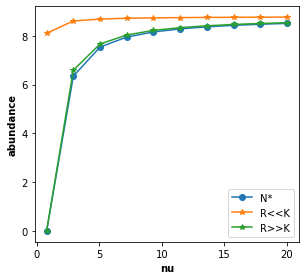

In [4]:
n_sp = 1
n_res = 2
n_react = n_res-1

h0 = np.array([20., 0])

pscan_array=np.linspace(0.8,20., 10)
param_scanned='nu'
Nstar_array=np.empty_like(pscan_array)
R0star_array=np.empty_like(pscan_array)
R1star_array=np.empty_like(pscan_array)

params = {}
for idx,pscanval in enumerate(pscan_array):
    if param_scanned=='nu':Enzyme_alloc = np.array([[pscanval]])
    else:Enzyme_alloc = np.array([[1.]])
    if param_scanned=='m':params['m']=pscanval
    else:params['m']=1
        
    params.update({'Enzyme_alloc': Enzyme_alloc})
    params.update( {'Energies': np.array([1.,0.])})
    assumptions = {'growth_type': 'thermodynamic_inhibition'}
#     assumptions = {'growth_type': 'Michaelis-Menten'}
    def define_some_reaction_nwk_values():
        assert n_react==1, 'written only for this case.'
        params['reaction_network_type'] = 'user_defined'
        params['E_ATP']= 1
        params['RT'] = 1
        params['N_ATP']= np.array([0.8])
        params['Energy_yield']= np.array([params['N_ATP'] *params['E_ATP']])
        params['substrates']= np.array([0])
        params['products']= np.array([1])
        params['Sub_to_res']= np.array([[1, 0]])
        params['Pro_to_res']= np.array([[0, 1]])
        params['K_P']=np.array([1])
        params['rho_rev']=np.array([0])
        params['K_S']=np.array([1])
        params['Enzyme_cost_factor']=0.1
        params['n_reactions']=n_react

        params['DG']= params['Energies'][1]-params['Energies'][0]+params['Energy_yield'] 
    define_some_reaction_nwk_values()

    N0_1=np.array([1.])
    # N0_1=np.array([10.,1.])
    N1, R1, params1, assumptions1=initialize_parameters ([N0_1,h0],params,assumptions)
    def dNdt(N,R,params):
        return MakeConsumerDynamics(assumptions)(N,R,params)
    def dRdt(N,R,params):
        return MakeResourceDynamics(assumptions)(N,R,params)

    ctr=0
    at_SS=False
    while at_SS==False:
        world1=Species_with_Reactions([N1, R1], [dNdt, dRdt], params1)
        t1,Ntraj1, Rtraj1=IntegrateDynamics(world1, params1,T0=0,T=200,ns=30,return_all=True)
        N1=Ntraj1[-1,:]
        R1=Rtraj1[-1,:]

        at_SS,_,_=check_steady_state(N1,R1,params1,dNdt, threshold=1e-2)   
#         print (ctr)
    #     if np.max(N1)<1e-2:
    #         break
        ctr+=1
    
    
    Nstar_array[idx]=Ntraj1[-1,0]
    R0star_array[idx]=Rtraj1[-1,0]
    R1star_array[idx]=Rtraj1[-1,1]
    
    
def SS_smallR_limit(prms):
    K=1
    nu=float(prms['Enzyme_alloc'])
    gamma=float(np.exp(prms['DG']/prms['RT']))
    if assumptions ['growth_type']== 'Michaelis-Menten':
        gamma=0.
    q=prms['Energy_yield']
    n_ss= (prms['R_supply'][0]* q* nu -prms['m']*K)/(
            nu*(1+gamma) )
    
    r0_ss= (prms['R_supply'][0]* q* nu *gamma + prms['m']*K)/(
            nu*q*(1+gamma) )
    
    r1_ss= (prms['R_supply'][0]* q* nu  - prms['m']*K)/(
            nu*q*(1+gamma) )
    if n_ss<0:
        n_ss=0
        r0_ss=prms['R_supply'][0]
        r1_ss=0
    
    return n_ss, r0_ss, r1_ss

def SS_largeR_limit(prms):
    K=1
    nu=float(prms['Enzyme_alloc'])
    gamma=float(np.exp(prms['DG']/prms['RT']))
    if assumptions ['growth_type']== 'Michaelis-Menten':
        gamma=0.

    q=prms['Energy_yield']
    
    n_ss= (prms['R_supply'][0]* q*(nu*q -prms['m'])  )/(
            q*nu*(1+gamma)- prms['m'] )
    
    r0_ss= (prms['R_supply'][0]* q* nu *gamma)/(
            q*nu*(1+gamma)- prms['m'] )
    
    r1_ss= (prms['R_supply'][0]*(q* nu -prms['m']) )/(
            q*nu*(1+gamma)- prms['m'] )
    
    if n_ss<0:
        n_ss=0
        r0_ss=prms['R_supply'][0]
        r1_ss=0
    
    return n_ss, r0_ss, r1_ss


Nstar_smallR_array=np.empty_like(pscan_array)
R0star_smallR_array=np.empty_like(pscan_array)
R1star_smallR_array=np.empty_like(pscan_array)
Nstar_largeR_array=np.empty_like(pscan_array)
R0star_largeR_array=np.empty_like(pscan_array)
R1star_largeR_array=np.empty_like(pscan_array)
for idx,nu in enumerate(pscan_array):
    prms=params1.copy()
    prms['Enzyme_alloc']  = np.array([[nu]])
    n_ss, r0_ss, r1_ss=SS_smallR_limit(prms)
    Nstar_smallR_array[idx]=n_ss
    R0star_smallR_array[idx]=r0_ss
    R1star_smallR_array[idx]=r1_ss
    
    n_ss, r0_ss, r1_ss=SS_largeR_limit(prms)
    Nstar_largeR_array[idx]=n_ss
    R0star_largeR_array[idx]=r0_ss
    R1star_largeR_array[idx]=r1_ss
    
color_list=create_color_list(scheme_name='sns_tab10')
fig2 = plt.figure(figsize=(12,4 ))
ax1 = fig2.add_subplot(1, 3, 1)
ax1.plot(pscan_array,Nstar_array,'-o', color=color_list[0],label=r'N*')
ax1.plot(pscan_array,Nstar_smallR_array,'-*', color=color_list[1],label=r'R<<K')
ax1.plot(pscan_array,Nstar_largeR_array,'-*', color=color_list[2],label=r'R>>K')

# for i in range(len(Rtraj1[0])):
#     ax1.plot(t1,Rtraj1[:,i],'-*', color=color_list[i+len(Ntraj1[0])],label='R'+str(i))
ax1.legend(loc='best')
ax1.set_xlabel(param_scanned, fontweight='bold')
ax1.set_ylabel(r'abundance', fontweight='bold')



fig2.patch.set_facecolor('white')
plt.tight_layout()
plt.show()



## At high supply, vs Dilution rate.

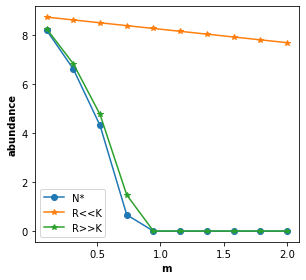

In [3]:
#
n_sp = 1
n_res = 2
n_react = n_res-1

h0 = np.array([20., 0])

pscan_array=np.linspace(0.1,2., 10)
param_scanned='m'
Nstar_array=np.empty_like(pscan_array)
R0star_array=np.empty_like(pscan_array)
R1star_array=np.empty_like(pscan_array)
params = {}
for idx,pscanval in enumerate(pscan_array):
    if param_scanned=='nu':Enzyme_alloc = np.array([[pscanval]])
    else:Enzyme_alloc = np.array([[1.]])
    if param_scanned=='m':params['m']=pscanval
    else:params['m']=1
        
    params.update({'Enzyme_alloc': Enzyme_alloc})
    params.update( {'Energies': np.array([1.,0.])})
    assumptions = {'growth_type': 'thermodynamic_inhibition'}
#     assumptions = {'growth_type': 'Michaelis-Menten'}
    def define_some_reaction_nwk_values():
        assert n_react==1, 'written only for this case.'
        params['reaction_network_type'] = 'user_defined'
        params['E_ATP']= 1
        params['RT'] = 1
        params['N_ATP']= np.array([0.8])
        params['Energy_yield']= np.array([params['N_ATP'] *params['E_ATP']])
        params['substrates']= np.array([0])
        params['products']= np.array([1])
        params['Sub_to_res']= np.array([[1, 0]])
        params['Pro_to_res']= np.array([[0, 1]])
        params['K_P']=np.array([1])
        params['rho_rev']=np.array([0])
        params['K_S']=np.array([1])
        params['Enzyme_cost_factor']=0.1
        params['n_reactions']=n_react

        params['DG']= params['Energies'][1]-params['Energies'][0]+params['Energy_yield'] 
    define_some_reaction_nwk_values()

    N0_1=np.array([1.])
    # N0_1=np.array([10.,1.])
    N1, R1, params1, assumptions1=initialize_parameters ([N0_1,h0],params,assumptions)
    def dNdt(N,R,params):
        return MakeConsumerDynamics(assumptions)(N,R,params)
    def dRdt(N,R,params):
        return MakeResourceDynamics(assumptions)(N,R,params)

    ctr=0
    at_SS=False
    while at_SS==False:
        world1=Species_with_Reactions([N1, R1], [dNdt, dRdt], params1)
        t1,Ntraj1, Rtraj1=IntegrateDynamics(world1, params1,T0=0,T=200,ns=30,return_all=True)
        N1=Ntraj1[-1,:]
        R1=Rtraj1[-1,:]

        at_SS,_,_=check_steady_state(N1,R1,params1,dNdt, threshold=1e-2)   
#         print (ctr)
    #     if np.max(N1)<1e-2:
    #         break
        ctr+=1
    
    
    Nstar_array[idx]=Ntraj1[-1,0]
    R0star_array[idx]=Rtraj1[-1,0]
    R1star_array[idx]=Rtraj1[-1,1]
    
    
def SS_smallR_limit(prms):
    K=1
    nu=float(prms['Enzyme_alloc'])
    gamma=float(np.exp(prms['DG']/prms['RT']))
    if assumptions ['growth_type']== 'Michaelis-Menten':
        gamma=0.
    q=prms['Energy_yield']
    n_ss= (prms['R_supply'][0]* q* nu -prms['m']*K)/(
            nu*(1+gamma) )
    
    r0_ss= (prms['R_supply'][0]* q* nu *gamma + prms['m']*K)/(
            nu*q*(1+gamma) )
    
    r1_ss= (prms['R_supply'][0]* q* nu  - prms['m']*K)/(
            nu*q*(1+gamma) )
    if n_ss<0 or r0_ss<0 or r1_ss<0:
        n_ss=0
        r0_ss=prms['R_supply'][0]
        r1_ss=0
    
    return n_ss, r0_ss, r1_ss

def SS_largeR_limit(prms):
    K=1
    nu=float(prms['Enzyme_alloc'])
    gamma=float(np.exp(prms['DG']/prms['RT']))
    if assumptions ['growth_type']== 'Michaelis-Menten':
        gamma=0.

    q=prms['Energy_yield']
    
    n_ss= (prms['R_supply'][0]* q*(nu*q -prms['m'])  )/(
            q*nu*(1+gamma)- prms['m'] )
    
    r0_ss= (prms['R_supply'][0]* q* nu *gamma)/(
            q*nu*(1+gamma)- prms['m'] )
    
    r1_ss= (prms['R_supply'][0]*(q* nu -prms['m']) )/(
            q*nu*(1+gamma)- prms['m'] )
    
    if n_ss<0 or r0_ss<0 or r1_ss<0:
        n_ss=0
        r0_ss=prms['R_supply'][0]
        r1_ss=0
    
    return n_ss, r0_ss, r1_ss


Nstar_smallR_array=np.empty_like(pscan_array)
R0star_smallR_array=np.empty_like(pscan_array)
R1star_smallR_array=np.empty_like(pscan_array)
Nstar_largeR_array=np.empty_like(pscan_array)
R0star_largeR_array=np.empty_like(pscan_array)
R1star_largeR_array=np.empty_like(pscan_array)
for idx,pscanval in enumerate(pscan_array):
    prms=params1.copy()
    if param_scanned=='nu': prms['Enzyme_alloc'] = np.array([[pscanval]])
    if param_scanned=='m':prms['m']=pscanval

    n_ss, r0_ss, r1_ss=SS_smallR_limit(prms)
    Nstar_smallR_array[idx]=n_ss
    R0star_smallR_array[idx]=r0_ss
    R1star_smallR_array[idx]=r1_ss
    
    n_ss, r0_ss, r1_ss=SS_largeR_limit(prms)
    Nstar_largeR_array[idx]=n_ss
    R0star_largeR_array[idx]=r0_ss
    R1star_largeR_array[idx]=r1_ss
    
color_list=create_color_list(scheme_name='sns_tab10')
fig2 = plt.figure(figsize=(12,4 ))
ax1 = fig2.add_subplot(1, 3, 1)
ax1.plot(pscan_array,Nstar_array,'-o', color=color_list[0],label=r'N*')
ax1.plot(pscan_array,Nstar_smallR_array,'-*', color=color_list[1],label=r'R<<K')
ax1.plot(pscan_array,Nstar_largeR_array,'-*', color=color_list[2],label=r'R>>K')

# for i in range(len(Rtraj1[0])):
#     ax1.plot(t1,Rtraj1[:,i],'-*', color=color_list[i+len(Ntraj1[0])],label='R'+str(i))
ax1.legend(loc='best')
ax1.set_xlabel(param_scanned, fontweight='bold')
ax1.set_ylabel(r'abundance', fontweight='bold')



fig2.patch.set_facecolor('white')
plt.tight_layout()
plt.show()



## At low supply, vs dilution raate

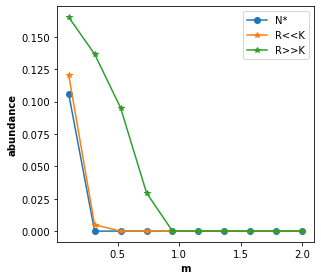

In [5]:
#
n_sp = 1
n_res = 2
n_react = n_res-1

h0 = np.array([0.4, 0])

pscan_array=np.linspace(0.1,2., 10)
param_scanned='m'
Nstar_array=np.empty_like(pscan_array)
R0star_array=np.empty_like(pscan_array)
R1star_array=np.empty_like(pscan_array)
params = {}
for idx,pscanval in enumerate(pscan_array):
    if param_scanned=='nu':Enzyme_alloc = np.array([[pscanval]])
    else:Enzyme_alloc = np.array([[1.]])
    if param_scanned=='m':params['m']=pscanval
    else:params['m']=1
        
    params.update({'Enzyme_alloc': Enzyme_alloc})
    params.update( {'Energies': np.array([1.,0.])})
    assumptions = {'growth_type': 'thermodynamic_inhibition'}
#     assumptions = {'growth_type': 'Michaelis-Menten'}
    def define_some_reaction_nwk_values():
        assert n_react==1, 'written only for this case.'
        params['reaction_network_type'] = 'user_defined'
        params['E_ATP']= 1
        params['RT'] = 1
        params['N_ATP']= np.array([0.8])
        params['Energy_yield']= np.array([params['N_ATP'] *params['E_ATP']])
        params['substrates']= np.array([0])
        params['products']= np.array([1])
        params['Sub_to_res']= np.array([[1, 0]])
        params['Pro_to_res']= np.array([[0, 1]])
        params['K_P']=np.array([1])
        params['rho_rev']=np.array([0])
        params['K_S']=np.array([1])
        params['Enzyme_cost_factor']=0.1
        params['n_reactions']=n_react

        params['DG']= params['Energies'][1]-params['Energies'][0]+params['Energy_yield'] 
    define_some_reaction_nwk_values()

    N0_1=np.array([1.])
    # N0_1=np.array([10.,1.])
    N1, R1, params1, assumptions1=initialize_parameters ([N0_1,h0],params,assumptions)
    def dNdt(N,R,params):
        return MakeConsumerDynamics(assumptions)(N,R,params)
    def dRdt(N,R,params):
        return MakeResourceDynamics(assumptions)(N,R,params)

    ctr=0
    at_SS=False
    while at_SS==False:
        world1=Species_with_Reactions([N1, R1], [dNdt, dRdt], params1)
        t1,Ntraj1, Rtraj1=IntegrateDynamics(world1, params1,T0=0,T=200,ns=30,return_all=True)
        N1=Ntraj1[-1,:]
        R1=Rtraj1[-1,:]

        at_SS,_,_=check_steady_state(N1,R1,params1,dNdt, threshold=1e-2)   
#         print (ctr)
    #     if np.max(N1)<1e-2:
    #         break
        ctr+=1
    
    
    Nstar_array[idx]=Ntraj1[-1,0]
    R0star_array[idx]=Rtraj1[-1,0]
    R1star_array[idx]=Rtraj1[-1,1]
    
    
def SS_smallR_limit(prms):
    K=1
    nu=float(prms['Enzyme_alloc'])
    gamma=float(np.exp(prms['DG']/prms['RT']))
    if assumptions ['growth_type']== 'Michaelis-Menten':
        gamma=0.
    q=prms['Energy_yield']
    n_ss= (prms['R_supply'][0]* q* nu -prms['m']*K)/(
            nu*(1+gamma) )
    
    r0_ss= (prms['R_supply'][0]* q* nu *gamma + prms['m']*K)/(
            nu*q*(1+gamma) )
    
    r1_ss= (prms['R_supply'][0]* q* nu  - prms['m']*K)/(
            nu*q*(1+gamma) )
    if n_ss<0 or r0_ss<0 or r1_ss<0:
        n_ss=0
        r0_ss=prms['R_supply'][0]
        r1_ss=0
    
    return n_ss, r0_ss, r1_ss

def SS_largeR_limit(prms):
    K=1
    nu=float(prms['Enzyme_alloc'])
    gamma=float(np.exp(prms['DG']/prms['RT']))
    if assumptions ['growth_type']== 'Michaelis-Menten':
        gamma=0.

    q=prms['Energy_yield']
    
    n_ss= (prms['R_supply'][0]* q*(nu*q -prms['m'])  )/(
            q*nu*(1+gamma)- prms['m'] )
    
    r0_ss= (prms['R_supply'][0]* q* nu *gamma)/(
            q*nu*(1+gamma)- prms['m'] )
    
    r1_ss= (prms['R_supply'][0]*(q* nu -prms['m']) )/(
            q*nu*(1+gamma)- prms['m'] )
    
    if n_ss<0 or r0_ss<0 or r1_ss<0:
        n_ss=0
        r0_ss=prms['R_supply'][0]
        r1_ss=0
    
    return n_ss, r0_ss, r1_ss


Nstar_smallR_array=np.empty_like(pscan_array)
R0star_smallR_array=np.empty_like(pscan_array)
R1star_smallR_array=np.empty_like(pscan_array)
Nstar_largeR_array=np.empty_like(pscan_array)
R0star_largeR_array=np.empty_like(pscan_array)
R1star_largeR_array=np.empty_like(pscan_array)
for idx,pscanval in enumerate(pscan_array):
    prms=params1.copy()
    if param_scanned=='nu': prms['Enzyme_alloc'] = np.array([[pscanval]])
    if param_scanned=='m':prms['m']=pscanval

    n_ss, r0_ss, r1_ss=SS_smallR_limit(prms)
    Nstar_smallR_array[idx]=n_ss
    R0star_smallR_array[idx]=r0_ss
    R1star_smallR_array[idx]=r1_ss
    
    n_ss, r0_ss, r1_ss=SS_largeR_limit(prms)
    Nstar_largeR_array[idx]=n_ss
    R0star_largeR_array[idx]=r0_ss
    R1star_largeR_array[idx]=r1_ss
    
color_list=create_color_list(scheme_name='sns_tab10')
fig2 = plt.figure(figsize=(12,4 ))
ax1 = fig2.add_subplot(1, 3, 1)
ax1.plot(pscan_array,Nstar_array,'-o', color=color_list[0],label=r'N*')
ax1.plot(pscan_array,Nstar_smallR_array,'-*', color=color_list[1],label=r'R<<K')
ax1.plot(pscan_array,Nstar_largeR_array,'-*', color=color_list[2],label=r'R>>K')

# for i in range(len(Rtraj1[0])):
#     ax1.plot(t1,Rtraj1[:,i],'-*', color=color_list[i+len(Ntraj1[0])],label='R'+str(i))
ax1.legend(loc='best')
ax1.set_xlabel(param_scanned, fontweight='bold')
ax1.set_ylabel(r'abundance', fontweight='bold')



fig2.patch.set_facecolor('white')
plt.tight_layout()
plt.show()



In [41]:
params1['Enzyme_alloc']


array([[2.]])

# L specialists, L reactions, star network-Test theory

only rho_rev used, Kp is not used 


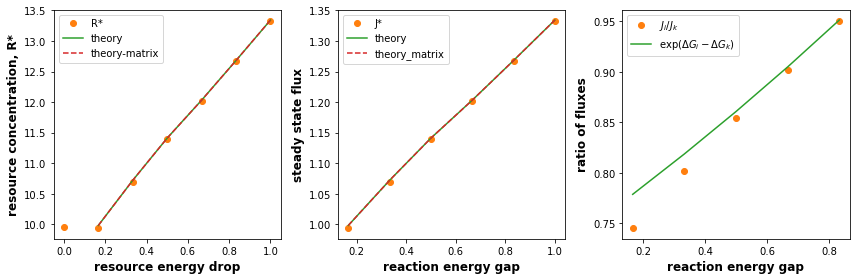

In [11]:
#
L=6
n_sp = L
n_res=n_resources = L+1
n_react =n_reactions= L

h0 = np.zeros(L+1)
h0[0]=80

Enzyme_alloc = np.eye(L)*5.

Enzyme_alloc = np.eye(L)*np.random.normal(20,4, L)

Energy_array= np.linspace(1.,0, n_res)

params_init = {'m':.1}
params_init.update({'Enzyme_alloc': Enzyme_alloc})
params_init.update( {'Energies': Energy_array})
assumptions = {'growth_type': 'thermodynamic_inhibition'}
def star_reaction_nwk_values(params_in, n_res, f_atp=0.7):
    n_react=n_res-1
    
    params=deepcopy(params_in)
    params['reaction_network_type'] = 'user_defined'
    params['E_ATP']= 1
    params['RT'] = 1
    params['substrates']= np.zeros(n_react).astype(int)
    params['products']= np.array(np.arange(n_react)+1).astype(int)

    single_row=np.zeros(n_res).astype(int)
    single_row[0]=1
    params['Sub_to_res']= np.tile(single_row, (n_react, 1)).astype(int)#np.array([[1, 0, 0],[1, 0, 0]])
    params['Pro_to_res']=np.eye(n_react, M=n_res, k=1 ).astype(int)# np.array([[0, 1, 0],[0, 0, 1]])
    params['K_P']=np.ones(n_react)
    params['rho_rev']=np.zeros(n_react)
    params['K_S']=np.ones(n_react)
    params['Enzyme_cost_factor']=np.ones(n_react)## deprecated.
    params['n_reactions']=n_react
    
    N_ATPs=[]
    DGs=[]
    DEnergies=[]
    for i in range(n_react):
        ### calculate energetics of the reaction
        Denergyi=params['Energies'][
            params['products'][i]]-params['Energies'][params['substrates'][i]]
        assert Denergyi<0,'energy needs to be less than 0'
        DEnergies.append(Denergyi)   
        N_ATPi=-f_atp*Denergyi/params['E_ATP']
        N_ATPs.append(N_ATPi)
        DG_i=Denergyi+N_ATPi*params['E_ATP']## driving force left
        assert DG_i<0, 'too much atp produced?'
        DGs.append(DG_i)
    params.update({'DEnergy': np.array(DEnergies), 'DG':np.array(DGs),
                   'N_ATP':np.array(N_ATPs), 
                   'Energy_yield': np.array(N_ATPs)*params['E_ATP']})

    return params

params_init=star_reaction_nwk_values(params_init, n_res, f_atp=0.7)
N0_init=np.ones(n_sp)

N1, R1, params1, assumptions1=initialize_parameters ([N0_init,h0],params_init,assumptions)
def dNdt(N,R,params):
    return MakeConsumerDynamics(assumptions)(N,R,params)
def dRdt(N,R,params):
    return MakeResourceDynamics(assumptions)(N,R,params)

ctr=0
at_SS=False
while at_SS==False:
    world1=Species_with_Reactions([N1, R1], [dNdt, dRdt], params1)
    t1,Ntraj1, Rtraj1=IntegrateDynamics(world1, params1,T0=0,T=200,ns=30,return_all=True)
    N1=Ntraj1[-1,:]
    R1=Rtraj1[-1,:]
    at_SS,_,_=check_steady_state(N1,R1,params1,dNdt, threshold=1e-2)   
    ctr+=1

Nf=Ntraj1[-1,:]
Rf=Rtraj1[-1,:]

def calc_fluxes(N,R,params):
    return Make_flux_calculator(assumptions1)(N,R,params)

def calc_Ri_by_R0_star(params,n_react):
    Ri_by_R0_star=[]
    ## assuming yield factors are all one.
    for i in range(n_react):
        temp= (1-params['m']/(params['N_ATP'][i] * params['Enzyme_alloc'][i][i]) )/ (
            np.exp(params['DG'][i]/params['RT']))
        Ri_by_R0_star.append(temp)        
    return np.array(Ri_by_R0_star)

def calc_Ri_by_R0_star_matrix(params,n_react):
    Ri_by_R0_star=[]
    E_mat=params1['Enzyme_alloc']
    E_inv=np.linalg.inv(E_mat)
    ## assuming yield factors are all one.
    for i in range(n_react):
        temp= (1-params['m']*np.sum(E_inv,axis=0)[i]/(params['N_ATP'][i] ) )/ (
            np.exp(params['DG'][i]/params['RT']))
        Ri_by_R0_star.append(temp)        
    return np.array(Ri_by_R0_star)


def calc_flux_theory(params,n_react, R0star):   
    return calc_Ri_by_R0_star(params,n_react) *R0star* params['m']

def calc_flux_theory_matrix(params,n_react, R0star):   
    return calc_Ri_by_R0_star_matrix(params,n_react) *R0star* params['m']

fluxes_byspecies_SS=calc_fluxes(Nf, Rf, params1)
fluxes_SS=np.sum(fluxes_byspecies_SS, axis=0)
# #             tot_flux=np.sum(fluxes_SS,axis=0)
# for survivor in idx_survivors:          
#     fluxes_by_survivors.append(fluxes_SS[survivor])  

color_list=create_color_list(scheme_name='sns_tab10')
fig2 = plt.figure(figsize=(12,4 ))
ax1 = fig2.add_subplot(1, 3, 1)

ax1.plot(params1['Energies'][0]-params1['Energies'],Rf,'o', color=color_list[1],label=r'R*')

ax1.plot( (params1['Energies'][0]-params1['Energies'])[1:]
         ,Rf[0]*calc_Ri_by_R0_star(params1,n_react) ,'-', color=color_list[2],label=r'theory')
ax1.plot( (params1['Energies'][0]-params1['Energies'])[1:]
         ,Rf[0]*calc_Ri_by_R0_star_matrix(params1,n_react) ,'--', color=color_list[3],label=r'theory-matrix')
ax1.legend(loc='best')
ax1.set_xlabel('resource energy drop', fontweight='bold')
ax1.set_ylabel(r'resource concentration, R*', fontweight='bold')



ax2 = fig2.add_subplot(1, 3, 2)
ax2.plot(-1*params1['DEnergy'],fluxes_SS,'o', color=color_list[1],label=r'J*')
ax2.plot(-1*params1['DEnergy'], calc_flux_theory(params1,n_react,Rf[0]),
         '-', color=color_list[2], label='theory')
ax2.plot(-1*params1['DEnergy'], calc_flux_theory_matrix(params1,n_react,Rf[0]),
         '--', color=color_list[3], label='theory_matrix')

ax2.legend(loc='best')
ax2.set_xlabel('reaction energy gap', fontweight='bold')
ax2.set_ylabel(r'steady state flux', fontweight='bold')


ax3 = fig2.add_subplot(1, 3, 3)

ratio_fluxes=fluxes_SS[:-1]/fluxes_SS[-1]
ratio_energies=np.exp(-params1['DG'][:-1] +params1['DG'][-1])
# ax3.plot(ratio_energies,ratio_fluxes,'-o', color=color_list[1],label=r'J*')
ax3.plot(-1*params1['DEnergy'][:-1],ratio_fluxes,'o', color=color_list[1],label=r'$J_i/J_k$')
ax3.plot(-1*params1['DEnergy'][:-1],ratio_energies,'-', color=color_list[2],
         label=r'exp$(\Delta G_i-\Delta G_k)$')
ax3.legend(loc='best')
ax3.set_xlabel('reaction energy gap', fontweight='bold')
ax3.set_ylabel(r'ratio of fluxes', fontweight='bold')


fig2.patch.set_facecolor('white')
plt.tight_layout()
plt.show()    
    



what is the ratio of free energies here?  

D/(Y * nu) is small.

### matrix inverse works for generalist species

only rho_rev used, Kp is not used 


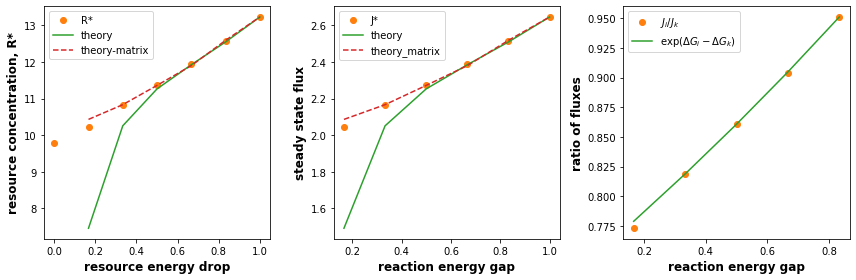

In [30]:
#
L=6
n_sp = L
n_res=n_resources = L+1
n_react =n_reactions= L

h0 = np.zeros(L+1)
h0[0]=80

# Enzyme_alloc = np.eye(L)*.1

Enzyme_alloc = np.eye(L)*np.random.normal(20,8, L) *.1

Enzyme_alloc = Enzyme_alloc+np.random.lognormal(4,3, L*L).reshape(L,L)

Energy_array= np.linspace(1.,0, n_res)

params_init = {'m':.2}
params_init.update({'Enzyme_alloc': Enzyme_alloc})
params_init.update( {'Energies': Energy_array})
assumptions = {'growth_type': 'thermodynamic_inhibition'}
def star_reaction_nwk_values(params_in, n_res, f_atp=0.7):
    n_react=n_res-1
    
    params=deepcopy(params_in)
    params['reaction_network_type'] = 'user_defined'
    params['E_ATP']= 1
    params['RT'] = 1
    params['substrates']= np.zeros(n_react).astype(int)
    params['products']= np.array(np.arange(n_react)+1).astype(int)

    single_row=np.zeros(n_res).astype(int)
    single_row[0]=1
    params['Sub_to_res']= np.tile(single_row, (n_react, 1)).astype(int)#np.array([[1, 0, 0],[1, 0, 0]])
    params['Pro_to_res']=np.eye(n_react, M=n_res, k=1 ).astype(int)# np.array([[0, 1, 0],[0, 0, 1]])
    params['K_P']=np.ones(n_react)
    params['rho_rev']=np.zeros(n_react)
    params['K_S']=np.ones(n_react)
    params['Enzyme_cost_factor']=np.ones(n_react)## deprecated.
    params['n_reactions']=n_react
    
    N_ATPs=[]
    DGs=[]
    DEnergies=[]
    for i in range(n_react):
        ### calculate energetics of the reaction
        Denergyi=params['Energies'][
            params['products'][i]]-params['Energies'][params['substrates'][i]]
        assert Denergyi<0,'energy needs to be less than 0'
        DEnergies.append(Denergyi)   
        N_ATPi=-f_atp*Denergyi/params['E_ATP']
        N_ATPs.append(N_ATPi)
        DG_i=Denergyi+N_ATPi*params['E_ATP']## driving force left
        assert DG_i<0, 'too much atp produced?'
        DGs.append(DG_i)
    params.update({'DEnergy': np.array(DEnergies), 'DG':np.array(DGs),
                   'N_ATP':np.array(N_ATPs), 
                   'Energy_yield': np.array(N_ATPs)*params['E_ATP']})

    return params

params_init=star_reaction_nwk_values(params_init, n_res, f_atp=0.7)
N0_init=np.ones(n_sp)

N1, R1, params1, assumptions1=initialize_parameters ([N0_init,h0],params_init,assumptions)
def dNdt(N,R,params):
    return MakeConsumerDynamics(assumptions)(N,R,params)
def dRdt(N,R,params):
    return MakeResourceDynamics(assumptions)(N,R,params)

ctr=0
at_SS=False
while at_SS==False:
    world1=Species_with_Reactions([N1, R1], [dNdt, dRdt], params1)
    t1,Ntraj1, Rtraj1=IntegrateDynamics(world1, params1,T0=0,T=200,ns=30,return_all=True)
    N1=Ntraj1[-1,:]
    R1=Rtraj1[-1,:]
    at_SS,_,_=check_steady_state(N1,R1,params1,dNdt, threshold=1e-2)   
    ctr+=1

Nf=Ntraj1[-1,:]
Rf=Rtraj1[-1,:]

def calc_fluxes(N,R,params):
    return Make_flux_calculator(assumptions1)(N,R,params)

def calc_Ri_by_R0_star(params,n_react):
    Ri_by_R0_star=[]
    ## assuming yield factors are all one.
    for i in range(n_react):
        temp= (1-params['m']/(params['N_ATP'][i] * params['Enzyme_alloc'][i][i]) )/ (
            np.exp(params['DG'][i]/params['RT']))
        Ri_by_R0_star.append(temp)        
    return np.array(Ri_by_R0_star)

def calc_Ri_by_R0_star_matrix(params,n_react):
    Ri_by_R0_star=[]
    E_mat=params1['Enzyme_alloc']
    E_inv=np.linalg.inv(E_mat)
    ## assuming yield factors are all one.
    for i in range(n_react):
        temp= (1-params['m']*np.sum(E_inv,axis=1)[i]/(params['N_ATP'][i] ) )/ (
            np.exp(params['DG'][i]/params['RT']))
        Ri_by_R0_star.append(temp)        
    return np.array(Ri_by_R0_star)


def calc_flux_theory(params,n_react, R0star):   
    return calc_Ri_by_R0_star(params,n_react) *R0star* params['m']

def calc_flux_theory_matrix(params,n_react, R0star):   
    return calc_Ri_by_R0_star_matrix(params,n_react) *R0star* params['m']

fluxes_byspecies_SS=calc_fluxes(Nf, Rf, params1)
fluxes_SS=np.sum(fluxes_byspecies_SS, axis=0)
# #             tot_flux=np.sum(fluxes_SS,axis=0)
# for survivor in idx_survivors:          
#     fluxes_by_survivors.append(fluxes_SS[survivor])  

color_list=create_color_list(scheme_name='sns_tab10')
fig2 = plt.figure(figsize=(12,4 ))
ax1 = fig2.add_subplot(1, 3, 1)

ax1.plot(params1['Energies'][0]-params1['Energies'],Rf,'o', color=color_list[1],label=r'R*')

ax1.plot( (params1['Energies'][0]-params1['Energies'])[1:]
         ,Rf[0]*calc_Ri_by_R0_star(params1,n_react) ,'-', color=color_list[2],label=r'theory')
ax1.plot( (params1['Energies'][0]-params1['Energies'])[1:]
         ,Rf[0]*calc_Ri_by_R0_star_matrix(params1,n_react) ,'--', color=color_list[3],label=r'theory-matrix')
ax1.legend(loc='best')
ax1.set_xlabel('resource energy drop', fontweight='bold')
ax1.set_ylabel(r'resource concentration, R*', fontweight='bold')



ax2 = fig2.add_subplot(1, 3, 2)
ax2.plot(-1*params1['DEnergy'],fluxes_SS,'o', color=color_list[1],label=r'J*')
ax2.plot(-1*params1['DEnergy'], calc_flux_theory(params1,n_react,Rf[0]),
         '-', color=color_list[2], label='theory')
ax2.plot(-1*params1['DEnergy'], calc_flux_theory_matrix(params1,n_react,Rf[0]),
         '--', color=color_list[3], label='theory_matrix')

ax2.legend(loc='best')
ax2.set_xlabel('reaction energy gap', fontweight='bold')
ax2.set_ylabel(r'steady state flux', fontweight='bold')


ax3 = fig2.add_subplot(1, 3, 3)

ratio_fluxes=fluxes_SS[:-1]/fluxes_SS[-1]
ratio_energies=np.exp(-params1['DG'][:-1] +params1['DG'][-1])
# ax3.plot(ratio_energies,ratio_fluxes,'-o', color=color_list[1],label=r'J*')
ax3.plot(-1*params1['DEnergy'][:-1],ratio_fluxes,'o', color=color_list[1],label=r'$J_i/J_k$')
ax3.plot(-1*params1['DEnergy'][:-1],ratio_energies,'-', color=color_list[2],
         label=r'exp$(\Delta G_i-\Delta G_k)$')
ax3.legend(loc='best')
ax3.set_xlabel('reaction energy gap', fontweight='bold')
ax3.set_ylabel(r'ratio of fluxes', fontweight='bold')


fig2.patch.set_facecolor('white')
plt.tight_layout()
plt.show()    
    



In [6]:
E_mat=params1['Enzyme_alloc']
E_inv=np.linalg.inv(E_mat)

In [5]:
np.shape(params1['Enzyme_alloc'])

(6, 6)

In [8]:
E_mat

array([[11.14280936,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ],
       [ 0.        , 23.86014716,  0.        ,  0.        ,  0.        ,
         0.        ],
       [ 0.        ,  0.        , 29.09592786,  0.        ,  0.        ,
         0.        ],
       [ 0.        ,  0.        ,  0.        , 29.58332631,  0.        ,
         0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        , 24.95613117,
         0.        ],
       [ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        21.72585199]])

In [10]:
np.sum(E_inv,axis=0)

array([0.08974397, 0.04191089, 0.03436907, 0.03380282, 0.04007031,
       0.04602811])

# When multispecies sims in low and high flux regimes?

## simulate

### simulate varying Rsupply

In [2]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_dummy.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 1
# Create and initialize pool
n_sp = 100
N_pool = np.ones(n_sp)
# R_expts_list=[np.array([40.,0.,0 ,0.]),np.array([20.,0.,0 ,0.]),
#              np.array([10.,0.,0 ,0.]),np.array([5.,0.,0 ,0.])]
R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.]),np.array([40.,0.,0., 0., 0. ,0.]),
             np.array([20.,0.,0., 0., 0. ,0.]),np.array([10.,0.,0., 0., 0. ,0.])]

R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.])]
exp_conditions_list=R_expts_list



params_pool = {'m': 1.,'rho_rev':0.,
               'reaction_network_type': 'all'}
# params_pool.update({'Energies':np.array([9,6,3,0.])})
params_pool.update({'Energies':np.array([15,12,9,6,3,0.])})



assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'f_0.7'})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    N_init, R_init, params_init, assumptions_pool = initialize_parameters(
                [N_pool, np.ones(len(R_expts_list[0]))], params_pool, assumptions_init)

       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
        
        R_exp = np.array(exp_condition)
        
        N_init, R_init=[N_pool,R_exp]
        params_init.update({'R_supply': R_exp})

        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
            pool_df.update({'params': params_init})
            pool_df.update({'N_init': N_init})
        df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool,
                            'params':params_init}
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0
        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-4:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 100:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
#         pool_df.update({'expt'+str(expt_id): SS_df})     
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

# with open(data_folder+file_name, 'wb') as f:
#     pickle.dump(df_master, f, protocol=2)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0


In [11]:
np.nonzero(a)

(array([23, 26, 35, 35, 35, 35, 35, 45, 45, 45]),
 array([ 2,  3,  0,  1,  3,  4, 11,  2,  4, 11]))

In [13]:
a[np.nonzero(a)]

array([ 4.26955565, 17.19652939,  1.24413599,  3.92633558,  2.81402662,
       21.4920984 ,  0.09812591,  3.60380447, 24.84726525,  0.64818656])

In [21]:
np.shape(Ncurrent[:,None]*a)

(100, 15)

###  plot varying R supply

Plots of Reaction energy yield and reaction driving force assume that only the reactions from R0 exists (no chains)

6sp_1 has 'rho_rev'=0 and 6sp_2 has 'rho_rev'=1

In [56]:
params_common_df.keys()

dict_keys(['m', 'rho_rev', 'reaction_network_type', 'Energies', 'assumptions', 'stoichiometry_provided', 'E_ATP', 'Enzyme_cost_factor', 'energy_dist', 'DEnergy', 'DG', 'N_ATP', 'Energy_yield', 'Enzyme_costs', 'n_reactions', 'substrates', 'products', 'Sub_to_res', 'Pro_to_res', 'g', 'tau', 'rho', 'yield', 'popn_cutoff', 'R_supply', 'RT', 'Enzyme_alloc', 'K_S', 'K_P', 'Kcat'])

In [22]:
data_df['pool1']['expt0'].keys()

dict_keys(['SS_values'])

## create analysis df

#### for Rsupply
Rsupply was varied in a slightly different way above than everything else. hence a different analysis function..

In [ ]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
file_name='6sp_1.dat'
create_analysis_df_for_Rsupply(data_folder,file_name)

In [16]:
a=np.arange(4)
b=np.arange(4)*2+.0001
print (distance.jensenshannon(a,b))

0.0016994243216728276


## plot reaction network

In [5]:
# ## plot functions

# ##################### when parameters other than Rsupply are varied.####
# def plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, plot_for_R_Expt=None,
#                                           pool_ids=np.arange(10).astype(int),
#                                           area_scale_factor=100.,
#                                          param_varied=''):
#     n_resources=analysis_df['n_resources']
#     n_reactions=analysis_df['n_reactions']
#     substrates=analysis_df['reaction_substrates']
#     products=analysis_df['reaction_products']
#     exp_conditions_list = analysis_df['exp_conditions_list']
#     n_pools=len(pool_ids)
#     color_list=create_color_list(scheme_name='sns_deep')
#     n_exp_conditions=len(exp_conditions_list)
#     fig= plt.figure(figsize=(5*n_pools,5*n_exp_conditions))
#     for pool_ctr, pool_id in enumerate(pool_ids):
#         for expt_id, exp_condition in enumerate(exp_conditions_list):
#             expt_df = analysis_df['expt'+str(expt_id)]
#             reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
#             abundance_list=expt_df['abundance_of_survivors']
# #             Enz_and_N_weighted_reactions_in_survivors_list=expt_df['enzyme_and_abundance_weighted_reactions_in_survivors']
#             reactions_in_survivors=np.array(reactions_in_final_survivors_list[pool_id]  )
#             abundance_survivors=abundance_list[pool_id]
# #             Enz_and_N_weighted_reactions=np.array(Enz_and_N_weighted_reactions_in_survivors_list[pool_id])
#             fluxes_by_survivors_list=expt_df['fluxes_by_survivors_list']
#             fluxes_by_survivors_arr= np.array(fluxes_by_survivors_list[pool_id])
#             params_df=expt_df['sim_params'][pool_id]
# #             print(np.shape(fluxes_by_survivors_arr))
# #             print(np.shape(Enz_and_N_weighted_reactions))
            
# #             ax1 = fig.add_subplot(1,n_pools,pool_ctr+1)
#             ax1 = fig.add_subplot(n_exp_conditions,n_pools,
#                                   expt_id*n_pools+ pool_ctr+1)


#             if n_resources==4:    
#                 resources_dict={0:[0.5, .95],1:[0.1, .7],
#                                2:[0.95, .39],
#                                3:[0.23, .05]}
#             elif n_resources==6:
#                 resources_dict={0:[0.5, .97],1:[0.15, .75],
#                                2:[0.3, .55],
#                                3:[0.9, .42], 4:[0.6, .2],
#                                5:[0.5, .02]}
#             else:
#                 print('this nresources has not been positioned yet',n_resources)
#                 sys.exit(1)

#             for ax in [ax1]:
#                 for key,val in resources_dict.items():    
#                     ax.text(val[0],val[1],'R'+str(key), color='black',
#                              bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')

# #                     ax.text(val[0],val[1],'R'+str(key)+' ({:.1f})'.format(
# #                         params_df['Energies'][key] ), color='black',
# #                              bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
#                     ##draw arrows
# #                     for i in range(n_reactions):   
# #                         ax.annotate('',xy=(resources_dict[products[i]]),
# #                                      xytext=(resources_dict[substrates[i]]),
# #                                      arrowprops=dict(facecolor='black', shrink=0.075,width=1))
#                 ax.set_xticks([])  
#                 ax.set_yticks([])  
#         #### add inset axis and pie chart to each reaction.
#             ax_subplot=ax1

#             if len(abundance_survivors)>0: ## if there are any survivors at all
#                 for reaction in range(n_reactions):                 
#                     h,w=0.15,0.15
#                     x,y=(np.array(resources_dict[products[reaction]])+         
#                          np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2    

#                     if np.any(reactions_in_survivors[:,reaction]>0):
#                         idx_sp=np.nonzero(fluxes_by_survivors_arr[:,reaction])## species that have the reaction    
#                         weights=np.squeeze(fluxes_by_survivors_arr[idx_sp,reaction])
#                         pie_radius=np.sqrt(np.sum(weights)/area_scale_factor)  

#                         if np.sum(weights)>1e-4:## changed from 1e-2 on 1-17-22
#                             ax_inset=ax_subplot.inset_axes([x,y, h,w])
#                             weighted_fracs=np.squeeze(weights/np.sum(weights))
#                             if len(idx_sp[0])==1:
#                                 weighted_fracs=np.array(weighted_fracs).reshape(1)
#             #                 print(weighted_fracs)
#             #                     sp_fracs=abundance_survivors[idx_sp]/np.sum(abundance_survivors[idx_sp])
#                             ax_inset.pie(weighted_fracs, autopct='%1.0f%%',
#                                          colors=np.array(color_list)[idx_sp],
#                                     radius=pie_radius, startangle=90)

#                             ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
#                                                  xytext=(resources_dict[substrates[reaction]]),
#                                                  arrowprops=dict(facecolor='black', shrink=0.075,width=1))
#                 w,h=0.25,0.1
#                 ax_inset=ax_subplot.inset_axes([0.725,0.05, w,h])
#     #             ax_inset.yaxis.set_major_locator(mpl.ticker.LogLocator(numticks=3))
#                 rel_abundance=abundance_survivors/np.sum(abundance_survivors)
#                 for i in range(len(rel_abundance)):       
#                     ax_inset.barh(i,rel_abundance[i],label='s',color=np.array(color_list)[i], log=False)
#     #             ax_inset.set_xticks([1e-1, 5e-2, 1.]) 
#                 ax_inset.set_xticks([0.1,0.5, 1.]) 
#                 ax_inset.set_yticks([])   
#                 ax_inset.set_xlabel('relative abundance')
#                 n_survivors=len(reactions_in_survivors)
#                 ax_subplot.set_title(str(pool_id)+', '+ param_varied+'='+
#                                      '{:.1e}'.format(exp_condition),
#                                     weight='normal')
#                 ax_subplot.text(0.02,.98,str(n_survivors)+' survivors', ha='left',va='top')
# #             if plot_for_R_Expt is None: 
# #                 if exp_condition[1]== plot_pairs['val2']:
# #                     fig.patch.set_facecolor('white')
# #                     plt.tight_layout()
# #                     plt.show()
# #     if plot_for_R_Expt is not None:
#     fig.patch.set_facecolor('white')
#     plt.tight_layout()
#     plt.show()
    
    

# def plot_rxn_nwk_Enzyme_piechart_nspecies_otherparams(analysis_df, plot_for_R_Expt=None,
#                                           pool_ids=np.arange(10).astype(int),
#                                           area_scale_factor=100.,
#                                          param_varied=''):
#     n_resources=analysis_df['n_resources']
#     n_reactions=analysis_df['n_reactions']
#     substrates=analysis_df['reaction_substrates']
#     products=analysis_df['reaction_products']
#     exp_conditions_list = analysis_df['exp_conditions_list']

#     n_pools=len(pool_ids)
#     color_list=create_color_list(scheme_name='sns_deep')
#     n_exp_conditions=len(exp_conditions_list)
#     fig= plt.figure(figsize=(5*n_pools,5*n_exp_conditions))
#     for pool_ctr, pool_id in enumerate(pool_ids):
#         for expt_id, exp_condition in enumerate(exp_conditions_list):
#             expt_df = analysis_df['expt'+str(expt_id)]
#             reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
#             abundance_list=expt_df['abundance_of_survivors']
#             Enz_and_N_weighted_reactions_in_survivors_list=expt_df['enzyme_and_abundance_weighted_reactions_in_survivors']
#             reactions_in_survivors=np.array(reactions_in_final_survivors_list[pool_id]  )
#             abundance_survivors=abundance_list[pool_id]
#             Enz_and_N_weighted_reactions=np.array(Enz_and_N_weighted_reactions_in_survivors_list[pool_id])
            
#             R_exp=exp_condition
# #             ax1 = fig.add_subplot(1,n_pools,pool_ctr+1)
#             ax1 = fig.add_subplot(n_exp_conditions,n_pools,
#                                   expt_id*n_pools+ pool_ctr+1)

            


#             if n_resources==4:    
#                 resources_dict={0:[0.5, .95],1:[0.1, .7],
#                                2:[0.95, .39],
#                                3:[0.23, .05]}
#             elif n_resources==6:
#                 resources_dict={0:[0.5, .97],1:[0.15, .75],
#                                2:[0.3, .55],
#                                3:[0.9, .42], 4:[0.6, .2],
#                                5:[0.5, .02]}
#             else:
#                 print('this nresources has not been positioned yet',n_resources)
#                 sys.exit(1)

#             for ax in [ax1]:
#                 for key,val in resources_dict.items():    
#                     ax.text(val[0],val[1],'R'+str(key), color='black',
#                              bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
#                     ##draw arrows
# #                     for i in range(n_reactions):   
# #                         ax.annotate('',xy=(resources_dict[products[i]]),
# #                                      xytext=(resources_dict[substrates[i]]),
# #                                      arrowprops=dict(facecolor='black', shrink=0.075,width=1))
#                 ax.set_xticks([])  
#                 ax.set_yticks([])  
#         #### add inset axis and pie chart to each reaction.
#             ax_subplot=ax1


#             for reaction in range(n_reactions):                 
#                 h,w=0.15,0.15
#                 x,y=(np.array(resources_dict[products[reaction]])+         
#                      np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2    
#                 ax_inset=ax_subplot.inset_axes([x,y, h,w])

#                 idx_sp=np.nonzero(reactions_in_survivors[:,reaction])## species that have the reaction
# #                 if len(idx_sp)>0:
#                 weights=np.squeeze(Enz_and_N_weighted_reactions[idx_sp,reaction])
#                 pie_radius=np.sqrt(np.sum(weights)/area_scale_factor)            
#                 weighted_fracs=np.squeeze(weights/np.sum(weights))

#                 if len(idx_sp[0])==1:
#                     weighted_fracs=np.array(weighted_fracs).reshape(1)
# #                 print(weighted_fracs)
# #                     sp_fracs=abundance_survivors[idx_sp]/np.sum(abundance_survivors[idx_sp])
#                 ax_inset.pie(weighted_fracs, autopct='%1.0f%%',
#                              colors=np.array(color_list)[idx_sp],
#                         radius=pie_radius, startangle=90)
#                 if pie_radius>0:
#                     ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
#                                          xytext=(resources_dict[substrates[reaction]]),
#                                          arrowprops=dict(facecolor='black', shrink=0.075,width=1))
#             w,h=0.25,0.1
#             ax_inset=ax_subplot.inset_axes([0.725,0.05, w,h])
# #             ax_inset.yaxis.set_major_locator(mpl.ticker.LogLocator(numticks=3))
#             rel_abundance=abundance_survivors/np.sum(abundance_survivors)
#             for i in range(len(rel_abundance)):       
#                 ax_inset.barh(i,rel_abundance[i],label='s',color=np.array(color_list)[i], log=False)
# #             ax_inset.set_xticks([1e-1, 5e-2, 1.]) 
#             ax_inset.set_xticks([0.1,0.5, 1.]) 
#             ax_inset.set_yticks([])   
#             ax_inset.set_xlabel('relative abundance')
#             n_survivors=len(reactions_in_survivors)
#             ax_subplot.set_title(str(pool_id)+', '+ param_varied+'='+
#                                  '{:.1f}'.format(exp_condition),
#                                 weight='normal')
#             ax_subplot.text(0.02,.98,str(n_survivors)+' survivors', ha='left',va='top')
# #             if plot_for_R_Expt is None: 
# #                 if exp_condition[1]== plot_pairs['val2']:
# #                     fig.patch.set_facecolor('white')
# #                     plt.tight_layout()
# #                     plt.show()
# #     if plot_for_R_Expt is not None:
#     fig.patch.set_facecolor('white')
#     plt.tight_layout()
#     plt.show()

# ##################### for Rsupply-varying simulations where params were stored differently####
# def plot_rxn_nwk_Enzyme_piechart_nspecies(analysis_df, plot_for_R_Expt=None,
#                                           pool_ids=np.arange(10).astype(int),
#                                           area_scale_factor=100.,
#                                          ):
#     n_resources=analysis_df['n_resources']
#     n_reactions=analysis_df['n_reactions']
#     substrates=analysis_df['reaction_substrates']
#     products=analysis_df['reaction_products']
#     exp_conditions_list = analysis_df['exp_conditions_list']
# #     plot_pairs={'key':'growth_type','val1':'thermodynamic_inhibition', 'val2':'Michaelis-Menten'}

#     n_pools=len(pool_ids)
#     color_list=create_color_list(scheme_name='sns_deep')
#     n_exp_conditions=len(exp_conditions_list)
#     fig= plt.figure(figsize=(5*n_pools,5*n_exp_conditions))
#     for pool_ctr, pool_id in enumerate(pool_ids):
#         for expt_id, expt_condition in enumerate(exp_conditions_list):
#             expt_df = analysis_df['expt'+str(expt_id)]
#             reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
#             abundance_list=expt_df['abundance_of_survivors']
#             Enz_and_N_weighted_reactions_in_survivors_list=expt_df['enzyme_and_abundance_weighted_reactions_in_survivors']
#             reactions_in_survivors=np.array(reactions_in_final_survivors_list[pool_id]  )
#             abundance_survivors=abundance_list[pool_id]
#             Enz_and_N_weighted_reactions=np.array(Enz_and_N_weighted_reactions_in_survivors_list[pool_id])
            
#             R_exp=expt_condition
# #             ax1 = fig.add_subplot(1,n_pools,pool_ctr+1)
#             ax1 = fig.add_subplot(n_exp_conditions,n_pools,
#                                   expt_id*n_pools+ pool_ctr+1)

            
# #             if plot_for_R_Expt is not None:        
# #                 if not np.array_equal(plot_for_R_Expt,expt_condition[0]):
# #                     continue         
# #             if expt_condition[1]== plot_pairs['val1']:
                
# #                 if plot_for_R_Expt is None:  
# #                     fig= plt.figure(figsize=(12, 6))
# #                     ax1 = fig.add_subplot(1,2,1)
# #                     ax2 = fig.add_subplot(1,2,2)
# #                 else:                
# #                     ax1 = fig.add_subplot(n_pools,2,2*pool_ctr+1)
# #                     ax2 = fig.add_subplot(n_pools,2,2*pool_ctr+2)

#             if n_resources==4:    
#                 resources_dict={0:[0.5, .95],1:[0.1, .7],
#                                2:[0.95, .39],
#                                3:[0.23, .05]}
#             elif n_resources==5:    
#                 resources_dict={0:[0.5, .95],1:[0.1, .75],
#                                2:[0.75, .55],
#                                3:[0.3, .35], 4:[.5,0.15]} 
#             elif n_resources==6:
#                 resources_dict={0:[0.5, .97],1:[0.15, .75],
#                                2:[0.3, .55],
#                                3:[0.9, .42], 4:[0.6, .2],
#                                5:[0.5, .02]}
#             else:
#                 print('this nresources has not been positioned yet',n_resources)
#                 sys.exit(1)

#             for ax in [ax1]:
#                 for key,val in resources_dict.items():    
#                     ax.text(val[0],val[1],'R'+str(key), color='black',
#                              bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
#                     ##draw arrows
# #                     for i in range(n_reactions):   
# #                         ax.annotate('',xy=(resources_dict[products[i]]),
# #                                      xytext=(resources_dict[substrates[i]]),
# #                                      arrowprops=dict(facecolor='black', shrink=0.075,width=1))
#                 ax.set_xticks([])  
#                 ax.set_yticks([])  
#         #### add inset axis and pie chart to each reaction.
#             ax_subplot=ax1


#             for reaction in range(n_reactions):                 
#                 h,w=0.15,0.15
#                 x,y=(np.array(resources_dict[products[reaction]])+         
#                      np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2    
#                 ax_inset=ax_subplot.inset_axes([x,y, h,w])

#                 idx_sp=np.nonzero(reactions_in_survivors[:,reaction])## species that have the reaction
# #                 if len(idx_sp)>0:
#                 weights=np.squeeze(Enz_and_N_weighted_reactions[idx_sp,reaction])
#                 pie_radius=np.sqrt(np.sum(weights)/area_scale_factor)            
#                 weighted_fracs=np.squeeze(weights/np.sum(weights))
               
            
# #                 print( idx_sp, len(idx_sp), len(idx_sp[0]))
# #                 print(weights)
# #                 print (pie_radius)
# #                 print(weighted_fracs)
#                 if len(idx_sp[0])==1:
#                     weighted_fracs=np.array(weighted_fracs).reshape(1)
# #                 print(weighted_fracs)
# #                     sp_fracs=abundance_survivors[idx_sp]/np.sum(abundance_survivors[idx_sp])
#                 ax_inset.pie(weighted_fracs, autopct='%1.0f%%',
#                              colors=np.array(color_list)[idx_sp],
#                         radius=pie_radius, startangle=90)
#                 if pie_radius>0:
#                     ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
#                                          xytext=(resources_dict[substrates[reaction]]),
#                                          arrowprops=dict(facecolor='black', shrink=0.075,width=1))
#             w,h=0.25,0.1
#             ax_inset=ax_subplot.inset_axes([0.725,0.05, w,h])
# #             ax_inset.yaxis.set_major_locator(mpl.ticker.LogLocator(numticks=3))
#             rel_abundance=abundance_survivors/np.sum(abundance_survivors)
#             for i in range(len(rel_abundance)):       
#                 ax_inset.barh(i,rel_abundance[i],label='s',color=np.array(color_list)[i], log=False)
# #             ax_inset.set_xticks([1e-1, 5e-2, 1.]) 
#             ax_inset.set_xticks([0.1,0.5, 1.]) 
#             ax_inset.set_yticks([])   
#             ax_inset.set_xlabel('relative abundance')
#             n_survivors=len(reactions_in_survivors)
#             ax_subplot.set_title(str(pool_id)+',h0='+
#                                  '{:.1f}'.format(expt_condition[0]),
#                                 weight='normal')
#             ax_subplot.text(0.02,.98,str(n_survivors)+' survivors', ha='left',va='top')
# #             if plot_for_R_Expt is None: 
# #                 if expt_condition[1]== plot_pairs['val2']:
# #                     fig.patch.set_facecolor('white')
# #                     plt.tight_layout()
# #                     plt.show()
# #     if plot_for_R_Expt is not None:
#     fig.patch.set_facecolor('white')
#     plt.tight_layout()
#     plt.show()
    
    
    
# def plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, plot_for_R_Expt=None,
#                                           pool_ids=np.arange(10).astype(int),
#                                           area_scale_factor=100.,
#                                          ):
#     n_resources=analysis_df['n_resources']
#     n_reactions=analysis_df['n_reactions']
#     substrates=analysis_df['reaction_substrates']
#     products=analysis_df['reaction_products']
#     exp_conditions_list = analysis_df['exp_conditions_list']
# #     plot_pairs={'key':'growth_type','val1':'thermodynamic_inhibition', 'val2':'Michaelis-Menten'}
    
#     n_pools=len(pool_ids)
#     color_list=create_color_list(scheme_name='sns_deep')
#     n_exp_conditions=len(exp_conditions_list)
#     fig= plt.figure(figsize=(5*n_pools,5*n_exp_conditions))
#     for pool_ctr, pool_id in enumerate(pool_ids):
#         for expt_id, expt_condition in enumerate(exp_conditions_list):
#             expt_df = analysis_df['expt'+str(expt_id)]
#             reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
#             abundance_list=expt_df['abundance_of_survivors']
# #             Enz_and_N_weighted_reactions_in_survivors_list=expt_df['enzyme_and_abundance_weighted_reactions_in_survivors']
#             reactions_in_survivors=np.array(reactions_in_final_survivors_list[pool_id]  )
#             abundance_survivors=abundance_list[pool_id]
# #             Enz_and_N_weighted_reactions=np.array(Enz_and_N_weighted_reactions_in_survivors_list[pool_id])
#             fluxes_by_survivors_list=expt_df['fluxes_by_survivors_list']
#             fluxes_by_survivors_arr= np.array(fluxes_by_survivors_list[pool_id])
# #             params_df=expt_df['sim_params']
#             R_exp=expt_condition
# #             ax1 = fig.add_subplot(1,n_pools,pool_ctr+1)
#             ax1 = fig.add_subplot(n_exp_conditions,n_pools,
#                                   expt_id*n_pools+ pool_ctr+1)
#             if n_resources==4:    
#                 resources_dict={0:[0.5, .95],1:[0.1, .7],
#                                2:[0.95, .39],
#                                3:[0.23, .05]}
#             elif n_resources==5:    
#                 resources_dict={0:[0.5, .92],1:[0.15, .75],
#                                2:[0.75, .55],
#                                3:[0.32, .35], 4:[.55,0.15]}  
                
#             elif n_resources==6:
#                 resources_dict={0:[0.5, .97],1:[0.15, .75],
#                                2:[0.3, .55],
#                                3:[0.9, .42], 4:[0.6, .2],
#                                5:[0.5, .02]}
#             else:
#                 print('this nresources has not been positioned yet',n_resources)
#                 sys.exit(1)

#             for ax in [ax1]:
#                 for key,val in resources_dict.items(): 
                    
#                     ax.text(val[0],val[1],'R'+str(key), color='black',
#                              bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
    
# #                     ax.text(val[0],val[1],'R'+str(key)+' ({:.1f})'.format(
# #                         params_df['Energies'][key] ) , color='black',
# #                              bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
# #                     ##draw arrows
# #                     for i in range(n_reactions):   
# #                         ax.annotate('',xy=(resources_dict[products[i]]),
# #                                      xytext=(resources_dict[substrates[i]]),
# #                                      arrowprops=dict(facecolor='black', shrink=0.075,width=1))
#                 ax.set_xticks([])  
#                 ax.set_yticks([])  
#         #### add inset axis and pie chart to each reaction.
#             ax_subplot=ax1


#             for reaction in range(n_reactions):                 
#                 h,w=0.15,0.15
#                 x,y=(np.array(resources_dict[products[reaction]])+         
#                      np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2    
                

#                 idx_sp=np.nonzero(reactions_in_survivors[:,reaction])## species that have the reaction
# #                 if len(idx_sp)>0:
# #                 print (fluxes_by_survivors_arr[idx_sp,reaction])
#                 weights=np.squeeze(fluxes_by_survivors_arr[idx_sp,reaction])
#                 pie_radius=np.sqrt(np.sum(weights)/area_scale_factor)  
            
#                 if np.sum(weights)>1e-2:
#                     ax_inset=ax_subplot.inset_axes([x,y, h,w])
#                     weighted_fracs=np.squeeze(weights/np.sum(weights))
#                     if len(idx_sp[0])==1:
#                         weighted_fracs=np.array(weighted_fracs).reshape(1)
#     #                 print(weighted_fracs)
#     #                     sp_fracs=abundance_survivors[idx_sp]/np.sum(abundance_survivors[idx_sp])
#                     ax_inset.pie(weighted_fracs, autopct='%1.0f%%',
#                                  colors=np.array(color_list)[idx_sp],
#                             radius=pie_radius, startangle=90)
                
#                     ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
#                                          xytext=(resources_dict[substrates[reaction]]),
#                                          arrowprops=dict(facecolor='black', shrink=0.075,width=1))
            
#             w,h=0.25,0.1
#             ax_inset=ax_subplot.inset_axes([0.725,0.05, w,h])
# #             ax_inset.yaxis.set_major_locator(mpl.ticker.LogLocator(numticks=3))
#             rel_abundance=abundance_survivors/np.sum(abundance_survivors)
#             for i in range(len(rel_abundance)):       
#                 ax_inset.barh(i,rel_abundance[i],label='s',color=np.array(color_list)[i], log=False)
# #             ax_inset.set_xticks([1e-1, 5e-2, 1.]) 
#             ax_inset.set_xticks([0.1,0.5, 1.]) 
#             ax_inset.set_yticks([])   
#             ax_inset.set_xlabel('relative abundance')
#             n_survivors=len(reactions_in_survivors)
#             ax_subplot.set_title(str(pool_id)+',h0='+
#                                  '{:.1f}'.format(expt_condition[0]),
#                                 weight='normal')
#             ax_subplot.text(0.02,.98,str(n_survivors)+' survivors', ha='left',va='top')
# #             if plot_for_R_Expt is None: 
# #                 if expt_condition[1]== plot_pairs['val2']:
# #                     fig.patch.set_facecolor('white')
# #                     plt.tight_layout()
# #                     plt.show()
# #     if plot_for_R_Expt is not None:
#     fig.patch.set_facecolor('white')
#     plt.tight_layout()
#     plt.show()   

### for Rsupply

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:93: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 


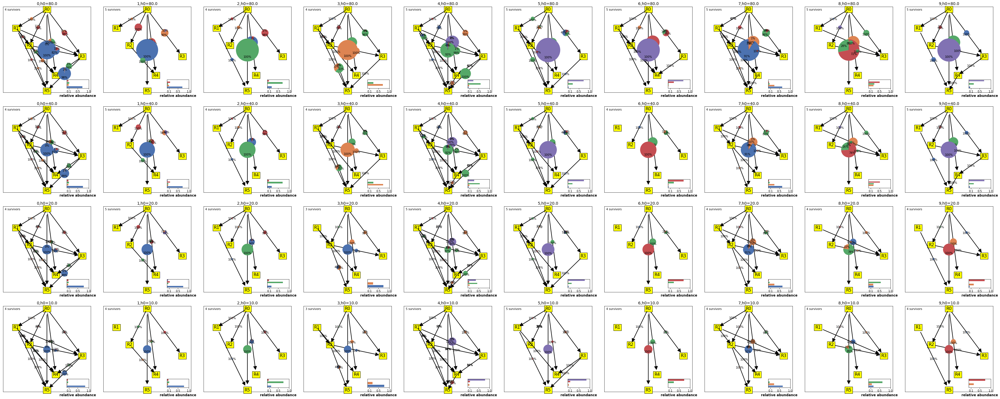

In [152]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_1.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Enzyme_piechart_nspecies(analysis_df, area_scale_factor=300)


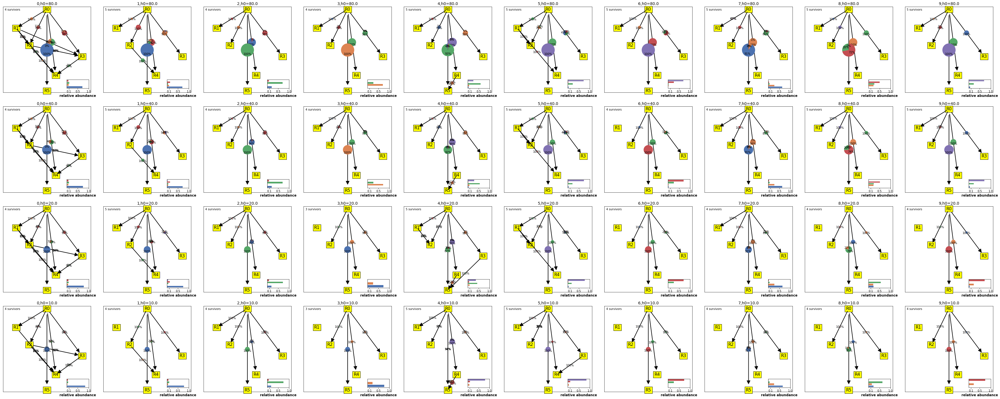

In [71]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_1.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=30)

when rho_rev=Kp=1 (not just thermodynamic inhibition)


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:214: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 


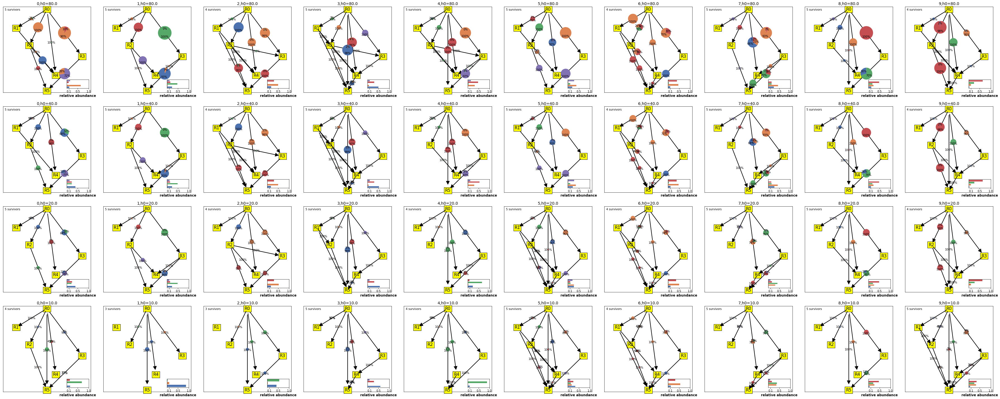

In [53]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_2.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)

print ('when rho_rev=Kp=1 (not just thermodynamic inhibition)')
plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=30)


### for others

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:193: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 


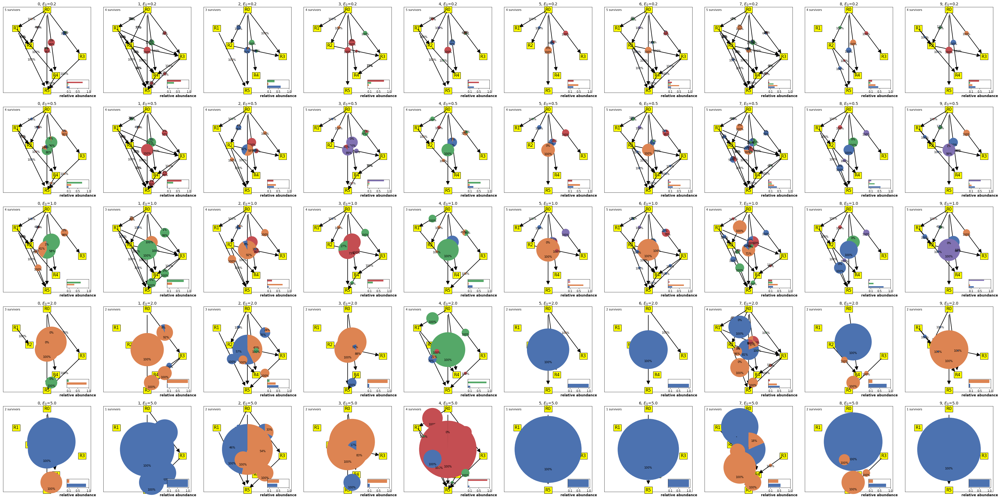

In [37]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_e1.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Enzyme_piechart_nspecies_otherparams(analysis_df, area_scale_factor=300,
                                                 param_varied=r'$E_0$')

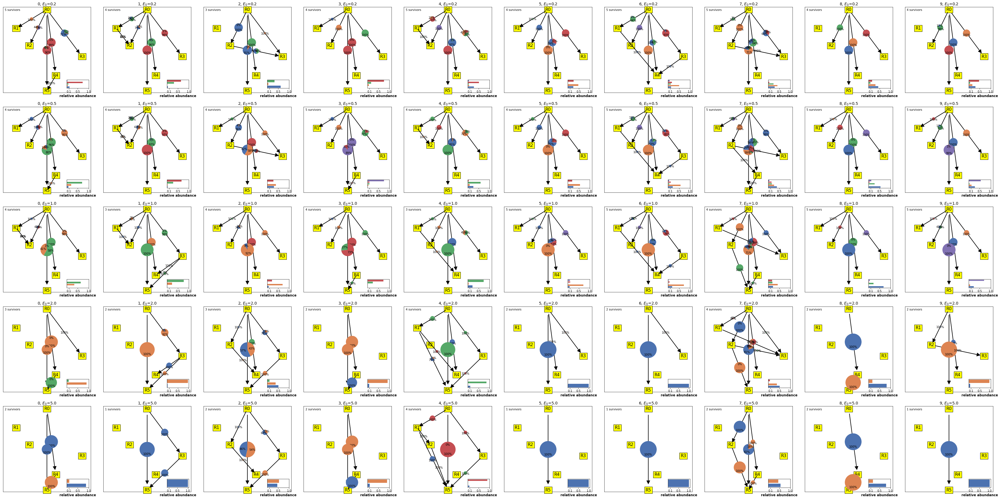

In [47]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_e1.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, area_scale_factor=30,
                                                 param_varied=r'$E_0$')

## plot statistics of outcomes

In [62]:
def plot_outcome_statistics(analysis_df,variable_scanned, xlabel_name, legend_label) :
    n_resources=analysis_df['n_resources']
    n_reactions=analysis_df['n_reactions']
    substrates=analysis_df['reaction_substrates']
    products=analysis_df['reaction_products']
    number_of_pools=analysis_df['number_of_pools']
    exp_conditions_list = analysis_df['exp_conditions_list']

    color_list=create_color_list(scheme_name='sns_deep')
    n_exp_conditions=len(exp_conditions_list)

    functional_distance_dict={'functional_distance':[],
                             variable_scanned:[]}
    fig= plt.figure(figsize=(5,5))
    ax1=fig.add_subplot()
    for expt_id, expt_condition in enumerate(exp_conditions_list):
        expt_df = analysis_df['expt'+str(expt_id)] 
        functional_distance_arr=expt_df['functional_distance_arr']

        functional_distance_dict['functional_distance'].extend(functional_distance_arr)
        functional_distance_dict[variable_scanned].extend(expt_df[variable_scanned]*
            np.ones(len(functional_distance_arr)))
    #     ax1.scatter(np.ones(len(functional_distance_arr))*expt_id, functional_distance_arr)
    ax1 = sns.violinplot(x=variable_scanned, y="functional_distance", 
                         data=functional_distance_dict, ax=ax1, cut=0)
    ax1.set_xlabel(xlabel_name)
    ax1.set_ylabel('functional distance')
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()  

    fig= plt.figure(figsize=(15,5))
    ax1=fig.add_subplot(1,3,1)
    ax2=fig.add_subplot(1,3,2)
    ax3=fig.add_subplot(1,3,3)
    for expt_id, expt_condition in enumerate(exp_conditions_list):
        expt_df = analysis_df['expt'+str(expt_id)]
        reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
        nonzero_flux_counter=expt_df['nonzero_flux_counter']
        flux_in_community_list=expt_df['flux_in_community_list']
        avg_community_flux=np.mean(flux_in_community_list,axis=0)
        avg_nmlzed_community_flux=avg_community_flux/np.sum(avg_community_flux)

    #     rel_community_flux=np.array(flux_in_community_list
    #                                )/np.sum(flux_in_community_list,axis=1)[:,None]
    #     avg_rel_community_flux=np.mean(rel_community_flux,axis=0)

        ax1.plot(np.arange(n_reactions),nonzero_flux_counter*1./number_of_pools,'--o', 
                 label=legend_label+'= {:.1f}'.format(expt_df[variable_scanned]) )
        ax2.plot(np.arange(n_reactions),avg_nmlzed_community_flux,'--o', 
                 label=legend_label+'= {:.1f}'.format(expt_df[variable_scanned]) )
        
        ax3.plot(np.arange(n_reactions),avg_nmlzed_community_flux,'--o', 
                 label=legend_label+'= {:.1f}'.format(expt_df[variable_scanned]) )

    #     ax2.plot(np.arange(n_reactions),avg_rel_community_flux,'*', label=r'$h_0=$'+
    #              '{:.0f}'.format(expt_df[variable_scanned]) )
    reaction_labels = ['R'+str(reaction_substrates[i])+r'$\to$R'+str(reaction_products[i])
                               for i in range(n_reactions)]    

    for ax in [ax1,ax2,ax3]:
        ax.set_xticks(np.arange(n_reactions))   
        ax.set_xticklabels(reaction_labels,rotation=90)
        ax.legend(loc='best')
        ax.set_xlabel('reaction with +ve flux')

    ax1.set_ylabel('reaction-presence fraction')
    ax2.set_ylabel('avg normalized flux')
    ax3.set_ylabel('avg normalized flux')
    ax3.set_yscale('log')
    ax3.set_ylim(1e-3,1.)
    # ax2.set_yscale('log')
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()  


# max heat dissipation--network when fATP varies
prediction works if we are in the right regime. Can we predict fluxes in the network as well?

In [4]:
# def get_max_dissipative_rxn_paths(df_master, exp_label='expt0', pool_label='pool0'):
#     substrates_rxn=df_master[pool_label][exp_label]['params']['substrates']
#     products_rxn=df_master[pool_label][exp_label]['params']['products']
#     Energies=df_master[pool_label][exp_label]['params']['Energies']
#     DG_list=df_master[pool_label][exp_label]['params']['DG']
#     assert all(Energies[i] >= Energies[i+1] for i in range(len(Energies)-1)), 'energies are in decreasing order'
#     n_reactions=len(substrates_rxn)
#     product_arr=np.array(list(set(products_rxn)))
#     n_res=np.max(product_arr)+1

#     product_arr=(np.arange(n_res-1)+1).astype(int)
#     def get_rxn_idx(sub, prod, substrates_rxn, products_rxn):
#         a= np.where(substrates_rxn==sub)[0]
#         b= np.where(products_rxn==prod)[0]
#         return int(np.intersect1d(a,b))
#     min_DG_list=[] ## with the min DG of the different paths
#     min_DG_path_list=[] ## with the reaction ids of the min DG paths
#     DGvals_on_paths=[]
#     for i, final_product in enumerate(product_arr):
#         rxn_idx=get_rxn_idx(0, final_product, substrates_rxn, products_rxn)
#         min_DG=DG_list[rxn_idx]
#         min_DG_path=[rxn_idx]
#         DGvals_on_paths.append([min_DG])
#         for j, intermediate in enumerate(product_arr[:i]):
#             rxn_idx=get_rxn_idx(intermediate, final_product, substrates_rxn, products_rxn)

#             DG=DG_list[rxn_idx]+min_DG_list[j]
#             DGvals_on_paths[i].append(DG)
#             if DG<min_DG:
# #                 print (intermediate,final_product)
# #                 print (DG,min_DG)
#                 min_DG_path=min_DG_path_list[j] +[rxn_idx]
#                 min_DG=DG
# #                 print (min_DG_path)
#         min_DG_list.append(min_DG) ## with the min DG of the different paths
#         min_DG_path_list.append(min_DG_path)    
#     return min_DG_path_list, min_DG_list, DGvals_on_paths

# def calculate_Rss_and_fluxes_theory(min_DG_path_list, min_DG_list, df_master,
#                                     n_resources=6,Prediction_Order=1,
#                                    exp_label='expt0', pool_label='pool0'):
#     if 'R_supply' in sim_data_df['pool0']['expt0']['params']:
#         h0=df_master[pool_label][exp_label]['params']['R_supply'][0] ##supply of R0
#     else:
#         h0=df_master[pool_label][exp_label]['params']['Rsupply'][0]
#     substrates_rxn=df_master[pool_label][exp_label]['params']['substrates']
#     products_rxn=df_master[pool_label][exp_label]['params']['products']
#     delta=df_master[pool_label][exp_label]['params']['m'] ## dilution rate
#     n_reactions=len(substrates_rxn)
    
#     ### we calculate theory based on pool 0 values...
#     surv_idx=np.where(df_master[pool_label][exp_label]['SS_values'][0]>0)[0]
#     ## when we tried to say overall E budget is assigned to each reaction.
# #     mean_E_budget=np.mean(np.sum(df_master[pool_label][exp_label]['params']['Enzyme_alloc'][surv_idx],axis=1))
# #     nu=np.mean(df_master[pool_label][exp_label]['params']['Kcat'])*mean_E_budget
#     E_in_each_rxn=np.sum(sim_data_df[pool_label][exp_label]['params']['Enzyme_alloc'][surv_idx],axis=0)
#     nu=np.mean(df_master[pool_label][exp_label]['params']['Kcat'])*E_in_each_rxn
#     Y_rxn=df_master[pool_label][exp_label]['params']['Energy_yield']*df_master[pool_label][exp_label]['params']['yield']
#     delta=df_master[pool_label][exp_label]['params']['m']    
# #     print (pool_label, exp_label, delta)
    
#     a_i_rxn=1.- delta/(nu*Y_rxn)
#     ####testing without delta correction
# #     a_i_rxn=np.ones_like(delta/(nu*Y_rxn))
#     a_i_rxn[nu==0]=1e-4
#     a_i_over_gamma_i=np.zeros(n_resources-1)
    
#     for i in range(1,n_resources): ## path to resource i
#         a_i=np.prod(a_i_rxn[min_DG_path_list[i-1]])
#         a_i_over_gamma_i[i-1]=a_i* np.exp(-min_DG_list[i-1])
# #     print ('relative difference=',1-a_i_over_gamma_i/One_over_gamma)
#     R_ss=np.zeros(n_resources)
#     R_ss_0thOrder=np.zeros(n_resources)
#     R_ss[0]= h0/(1+np.sum(a_i_over_gamma_i))
#     R_ss_0thOrder[0]=h0/(1+np.sum(np.exp(-np.asarray(min_DG_list))))
# #     R_ss[0]= h0/(1+np.sum(np.exp(-np.asarray(min_DG_list))))
#     for i in range(1,n_resources):
#         R_ss[i]=R_ss[0]* a_i_over_gamma_i[i-1]
#         R_ss_0thOrder[i]=R_ss_0thOrder[0]* np.exp(-min_DG_list[i-1])
#     #     print('relative difference Rss=',1-R_ss/R_ss_0thOrder)
#     if Prediction_Order==0: ## we want to use the 0th order prediction
#         R_ss=R_ss_0thOrder

#     all_rxns_in_min_DG_path= list(np.concatenate(min_DG_path_list).flat)## flatten all paths
#     unq_rxns_in_min_DG_path=np.array(list(set(all_rxns_in_min_DG_path))).astype(int)   
#     subs_on_paths=substrates_rxn[unq_rxns_in_min_DG_path]
#     prods_on_paths=products_rxn[unq_rxns_in_min_DG_path]
    
#     Flux_in_rxns=np.zeros(n_reactions)
#     Flux_into_resource=np.zeros(n_resources)
#     '''
#     loop from bottom resource to top resoruce so that we can use 
#     the flux calculated downstream for current flux calculation
#     '''
#     for i in range (n_resources-1,0,-1): 
#         flux_into_i=delta*R_ss[i]       
#         if np.any(subs_on_paths==i) : ##outflow must be added for flux balance
#             rxn_pathIDs=np.where(subs_on_paths==i)[0]          
#             prods=prods_on_paths[rxn_pathIDs]
# #             print (prods, 'shared substrate', i )
#             if np.any(prods<i):
#                 print (i,'error, prods have to be lesser', prods)
#             flux_into_i=flux_into_i+np.sum(Flux_into_resource[prods])  

#         if np.any(prods_on_paths==i) :
#             rxn_pathID=np.where(prods_on_paths==i)[0]
#             assert(len(rxn_pathID)==1),'only one inflow reaction allowed'
#             Flux_in_rxns[unq_rxns_in_min_DG_path[rxn_pathID]]=flux_into_i          
#         else:
#             print (i, 'was not a product in any reaction???')           
#         Flux_into_resource[i]=flux_into_i   

#     return R_ss,  Flux_in_rxns, Flux_into_resource


# def plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, df_master,
#                         n_resources=6,exp_label='expt0', pool_label='pool0', title=None):

#     flux_in_sim0=analysis_df[exp_label]['flux_in_community_list'][0]   
#     print ('exp: ', exp_label, 'delta= ', df_master[pool_label][exp_label]['params']['m'] )
    
#     R_ss_0th,  Flux_in_rxns_0th, Flux_into_resource_0th=calculate_Rss_and_fluxes_theory(min_DG_path_list, min_DG_list, df_master,
#                                     n_resources=n_resources,Prediction_Order=0,
#                                     exp_label=exp_label, pool_label=pool_label)
#     error_0th=Flux_in_rxns_0th-flux_in_sim0
#     print ('rms of pred - obs, 0th order = ', np.sqrt(np.mean(np.square(error_0th)))     )  
#     R_ss,  Flux_in_rxns, Flux_into_resource=calculate_Rss_and_fluxes_theory(min_DG_path_list, min_DG_list, df_master,
#                                 n_resources=n_resources,Prediction_Order=1,
#                                 exp_label=exp_label, pool_label=pool_label)
#     error=Flux_in_rxns-flux_in_sim0
#     print ('rms of pred - obs, 1st order = ', np.sqrt(np.mean(np.square(error)))     )
# #     print ('predicted: ', Flux_in_rxns)
# #     print ('observed: ', flux_in_sim0)

#     fig = plt.figure(figsize=(5, 5))
#     ax1=fig.add_subplot()
#     ax1.plot(flux_in_sim0,Flux_in_rxns_0th, 'bo', label= '0th order')
#     ax1.plot(flux_in_sim0,Flux_in_rxns, 'go', label= '1st order')
#     ax1.legend(loc='best')
#     ax1.set_xlabel('observed fluxes')
#     ax1.set_ylabel('predicted fluxes')
#     ax1.plot( [ax1.get_xlim()[0], ax1.get_xlim()[1]], [ax1.get_xlim()[0],ax1.get_xlim()[1] ], 'k--'  )
#     if title is not None:
#         ax1.set_title(title)
#     fig.patch.set_facecolor('white')
#     plt.tight_layout()
#     plt.show()  
    
# def plot_func_distance_btw_pools(analysis_df, min_DG_path_list, min_DG_list, df_master,
#                                 n_resources=6, pool_label='pool0', title=None, xlabel='param'):   
#     avg_pwise_dist=[]
#     avg_dist_to_theory=[]
#     for idx, val in enumerate(analysis_df['exp_conditions_list']):
#         exp_label='expt'+ str(idx)        
#         pwise_dists=distance.pdist(analysis_df[exp_label]['flux_in_community_list'], 
#                                    metric='jensenshannon')
#         avg_pwise_dist.append(np.mean(pwise_dists))
        
#         R_ss,  Flux_in_rxns, Flux_into_resource=calculate_Rss_and_fluxes_theory(min_DG_path_list, min_DG_list, df_master,
#                             n_resources=n_resources,Prediction_Order=1,
#                             exp_label=exp_label, pool_label=pool_label)     
#         dist_to_theory=[]
#         for pool_id in range(analysis_df['number_of_pools']):
#             dist_to_theory.append(distance.jensenshannon (
#                 Flux_in_rxns, analysis_df[exp_label]['flux_in_community_list'][pool_id])  )          
#         avg_dist_to_theory.append(np.mean(dist_to_theory))


#     fig = plt.figure(figsize=(5, 5))
#     ax1=fig.add_subplot()
#     ax1.plot(analysis_df['exp_conditions_list'], avg_pwise_dist, 'bo', label= 'dist b/w pools')
#     ax1.plot(analysis_df['exp_conditions_list'],avg_dist_to_theory, 'go', label= 'dist from theory')
#     ax1.legend(loc='best')
#     ax1.set_yscale('log')
#     ax1.set_xscale('log')
#     ax1.set_xlabel(xlabel)
#     ax1.set_ylabel('distance (jensen-shannon divergence)')
#     if title is not None:
#         ax1.set_title(title)
#     fig.patch.set_facecolor('white')
#     plt.tight_layout()
#     plt.show() 



    
# def plot_nwk_predicted_by_maxDissip(min_DG_path_list, min_DG_list, df_master,
#                                     n_resources=6,
#                                    exp_label='expt0', pool_label='pool0'):
    
#     substrates=df_master[pool_label][exp_label]['params']['substrates']
#     products=df_master[pool_label][exp_label]['params']['products']
    
#     fig = plt.figure(figsize=(4, 4))
#     ax1=fig.add_subplot()
#     if n_resources==4:    
#         resources_dict={0:[0.5, .95],1:[0.1, .7],
#                        2:[0.95, .39],
#                        3:[0.23, .05]}
#     elif n_resources==5:    
#         resources_dict={0:[0.5, .95],1:[0.1, .72],
#                        2:[0.8, .5],
#                        3:[0.3, .27], 4:[.7,0.05]} 
#     elif n_resources==6:
#         resources_dict={0:[0.5, .97],1:[0.15, .75],
#                        2:[0.3, .55],
#                        3:[0.9, .42], 4:[0.6, .2],
#                        5:[0.5, .02]}
#     else:
#         print('this nresources has not been positioned yet',n_resources)
#         sys.exit(1)

#     for ax in [ax1]:
#         for key,val in resources_dict.items(): 
#             ax.text(val[0],val[1],'R'+str(key), color='black',
#                      bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
#         ax.set_xticks([])  
#         ax.set_yticks([])  
#     #### add inset axis and pie chart to each reaction.
#     ax_subplot=ax1
#     all_rxns_in_min_DG_path= list(np.concatenate(min_DG_path_list).flat)## flatten all paths
#     unq_rxns_in_min_DG_path=list(set(all_rxns_in_min_DG_path))
#     for reaction in np.ravel(unq_rxns_in_min_DG_path):
#         ax_subplot.annotate('',xy=(resources_dict[products[reaction]]),
#                              xytext=(resources_dict[substrates[reaction]]),
#                              arrowprops=dict(facecolor='black', shrink=0.075,width=1))

#     fig.patch.set_facecolor('white')
#     plt.tight_layout()
#     plt.show()   

prods_on_paths [4]
prods_on_paths [3]
prods_on_paths [2]
[4] shared substrate 2
prods_on_paths [1]
[1 2 3] shared substrate 1
prods_on_paths [0]


In [31]:
substrates_rxn[all_rxns_in_min_DG_path]

array([0, 0, 0, 2, 0, 2, 0, 2, 4])

In [30]:
substrates_rxn=df_master['pool0']['expt0']['params']['substrates']
products_rxn=df_master['pool0']['expt0']['params']['products']

## sim 
delta G cannot be too large than substrate gets depleted

In [58]:
#
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_heatdissipation2.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 300
N_pool = np.ones(n_sp)
# R_expts_list=[np.array([40.,0.,0 ,0.]),np.array([20.,0.,0 ,0.]),
#              np.array([10.,0.,0 ,0.]),np.array([5.,0.,0 ,0.])]
# R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.]),np.array([40.,0.,0., 0., 0. ,0.]),
#              np.array([20.,0.,0., 0., 0. ,0.]),np.array([10.,0.,0., 0., 0. ,0.])]

R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.])]
exp_conditions_list=R_expts_list



params_pool = {'m': .1,'rho_rev':0.1,
               'reaction_network_type': 'all'}

# params_pool.update({'Energies':np.array([15,12,9,6,3,0.])})
params_pool.update({'Energies':np.array([5,4,3,2,1,0.])})
n_res=6
n_reactions=int(n_res*(n_res-1)/2)
fATP_list=np.random.rand(n_reactions)

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-4:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 100:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


In [ ]:
def mean_x(mu_lognormal, sig_lognormal):
    return np.exp(mu_lognormal + np.square(sig_lognormal)/2)
def var_x(mu_lognormal, sig_lognormal):
    return np.exp(2*mu_lognormal + np.square(sig_lognormal)) *(
        np.exp(np.square(sig_lognormal)-1)) 

from scipy.optimize import fsolve


def equations(p):
    mu_lognormal,sig_lognormal= p
    return ( mean_x(mu_lognormal, sig_lognormal), var_x(mu_lognormal, sig_lognormal))

x, y =  fsolve(equations, (1, 1))


### chem parameters vary between pools (KS, KP, Kcat)
- KS KP variation seems to matter a little more than Kcat.. probably cos KS and KP sort of measure the effective concentration units in the enzymatic term.

- for small dilution rate, steady state threshold needs to be made smaller as well.

#### 4 species

In [5]:
#
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '4sp_randChem1.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 300
N_pool = np.ones(n_sp)
# R_expts_list=[np.array([40.,0.,0 ,0.]),np.array([20.,0.,0 ,0.]),
#              np.array([10.,0.,0 ,0.]),np.array([5.,0.,0 ,0.])]
# R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.]),np.array([40.,0.,0., 0., 0. ,0.]),
#              np.array([20.,0.,0., 0., 0. ,0.]),np.array([10.,0.,0., 0., 0. ,0.])]

R_expts_list=[np.array([80.,0.,0., 0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list



params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

# params_pool.update({'Energies':np.array([15,12,9,6,3,0.])})
params_pool.update({'Energies':np.array([3,2,1,0.])})
n_res=4
n_reactions=int(n_res*(n_res-1)/2)
fATP_list=np.random.rand(n_reactions)

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


#### 5 species

In [13]:
#
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '5sp_randChem1.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 300
N_pool = np.ones(n_sp)
# R_expts_list=[np.array([40.,0.,0 ,0.]),np.array([20.,0.,0 ,0.]),
#              np.array([10.,0.,0 ,0.]),np.array([5.,0.,0 ,0.])]
# R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.]),np.array([40.,0.,0., 0., 0. ,0.]),
#              np.array([20.,0.,0., 0., 0. ,0.]),np.array([10.,0.,0., 0., 0. ,0.])]

R_expts_list=[np.array([80.,0.,0., 0., 0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list



params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

# params_pool.update({'Energies':np.array([15,12,9,6,3,0.])})
params_pool.update({'Energies':np.array([4,3,2,1,0.])})
n_res=5
n_reactions=int(n_res*(n_res-1)/2)
fATP_list=np.random.rand(n_reactions)

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


#### 6 species

In [96]:
#
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_heatdissipation_3.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 10
# Create and initialize pool
n_sp = 300
N_pool = np.ones(n_sp)
# R_expts_list=[np.array([40.,0.,0 ,0.]),np.array([20.,0.,0 ,0.]),
#              np.array([10.,0.,0 ,0.]),np.array([5.,0.,0 ,0.])]
# R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.]),np.array([40.,0.,0., 0., 0. ,0.]),
#              np.array([20.,0.,0., 0., 0. ,0.]),np.array([10.,0.,0., 0., 0. ,0.])]

R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list



params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

# params_pool.update({'Energies':np.array([15,12,9,6,3,0.])})
params_pool.update({'Energies':np.array([5,4,3,2,1,0.])})
# params_pool.update({'RT':2.5})
n_res=6
n_reactions=int(n_res*(n_res-1)/2)
# fATP_list=np.random.rand(n_reactions) ###
fATP_list=np.random.uniform(.15, .85,n_reactions) ## between .15 and.85 to be reasonable
assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.01, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4
pool  5
pool  6
pool  7
pool  8
pool  9


In [94]:
np.random.uniform(.15, .75,5)

array([12.65524853, 26.26982757, 55.87624289, 70.38004889, 74.37374251])

In [92]:
np.random.rand(10)*0.8b

array([0.3428389 , 0.53842666, 0.39744516, 0.90385157, 0.91771827,
       0.10959336, 0.77411869, 0.77603299, 0.91916732, 0.70529828])

## plot sim and theory prediction

##### below dilution was not small enough, and so flux predictions dont match, but network preds sort of do.

m=delta=0.1, while Ks, kcat=1, Kp=10. 
in the next set of sims, m=0.01, and predictions match much better.

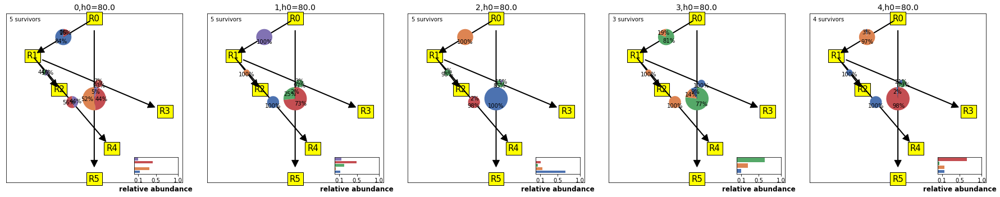

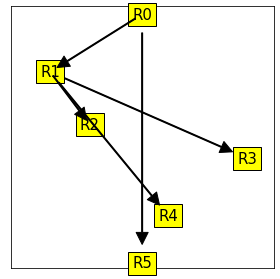

[2 3 4] shared substrate 1


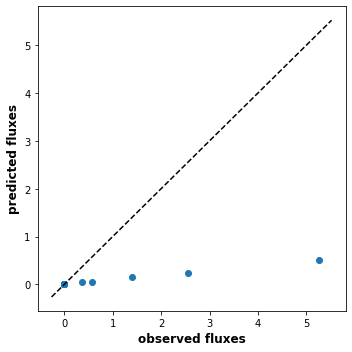

In [86]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_heatdissipation.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=4,
                                     pool_ids=np.arange(5).astype(int))

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, df_master,
                                    n_resources=6)

In [87]:
sim_data_df['pool0']['expt0']['params']['m'] 

0.1

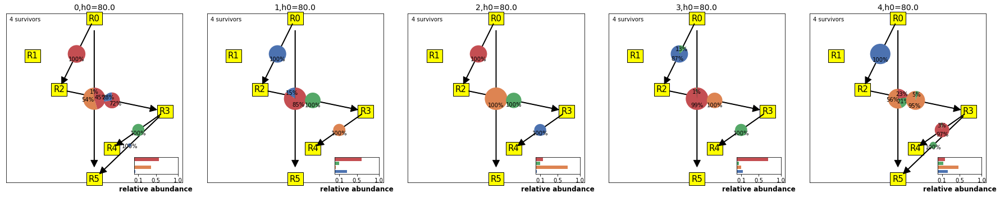

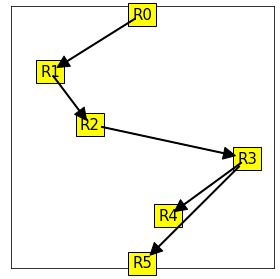

[4 5] shared substrate 3
[3] shared substrate 2
[2] shared substrate 1


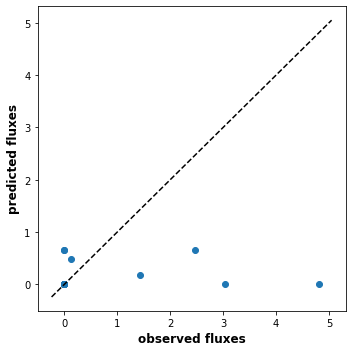

In [80]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_heatdissipation2.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=4,
                                     pool_ids=np.arange(5).astype(int))

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, df_master,
                                    n_resources=6)

# subs_on_paths=[]
# prods_on_paths=[]
# for path in min_DG_path_list:
#     p_list=[]
#     s_list=[]
#     for rxn in path:
#         p_list.append(products_rxn[rxn])
#         s_list.append(substrates_rxn[rxn])
# #     print (p_list)
#     subs_on_paths.append(s_list)
#     prods_on_paths.append(p_list)
# print (subs_on_paths)
# print (prods_on_paths)

In [82]:
sim_data_df['pool0']['expt0']['SS_values'][1] 

array([1.51966088e+00, 1.84873630e-13, 5.72139022e+00, 9.08040342e+00,
       1.43172576e+01, 4.93612879e+01])

In [84]:
sim_data_df['pool0']['expt0']['params']

{'m': 0.1,
 'rho_rev': array([0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1,
        0.1, 0.1]),
 'reaction_network_type': 'all',
 'Energies': array([5., 4., 3., 2., 1., 0.]),
 'assumptions': {'nu_constraint': 'uniform_lognormal',
  'growth_type': 'thermodynamic_inhibition',
  'ATP_allocation': 'fATP_list',
  'fATP_list': array([0.02092187, 0.26340996, 0.8675294 , 0.47619322, 0.28060799,
         0.3776448 , 0.43919665, 0.79011445, 0.7920664 , 0.4041674 ,
         0.58811398, 0.88452357, 0.1347547 , 0.04409935, 0.80434762]),
  'supply': 'external'},
 'stoichiometry_provided': False,
 'E_ATP': 1,
 'Enzyme_cost_factor': 0.1,
 'energy_dist': 'user_defined',
 'DEnergy': array([-1., -2., -3., -4., -5., -1., -2., -3., -4., -1., -2., -3., -1.,
        -2., -1.]),
 'DG': array([-0.97907813, -1.47318008, -0.39741179, -2.09522713, -3.59696006,
        -0.6223552 , -1.1216067 , -0.62965665, -0.83173438, -0.5958326 ,
        -0.82377205, -0.34642928, -0.8652453 , -1.91180129, -0.

### chem parameters vary between pools (KS, KP, Kcat)

#### 5 species

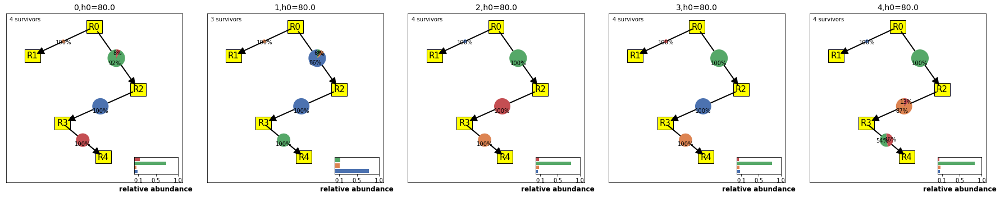

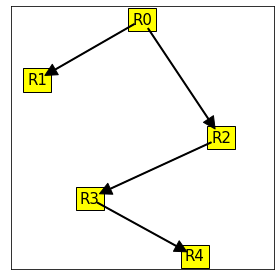

[4] shared substrate 3
[3] shared substrate 2


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: divide by zero encountered in true_divide


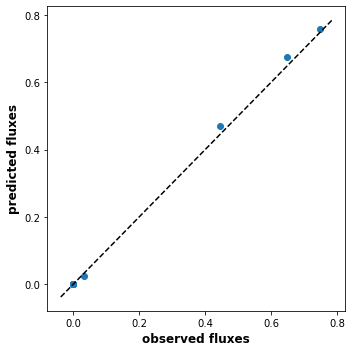

In [77]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='5sp_randChem1.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=5)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=5)



#### 6 species

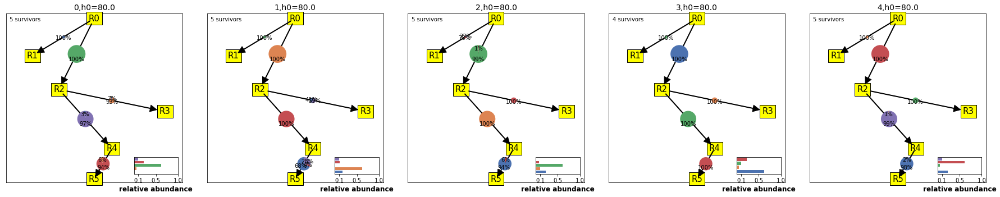

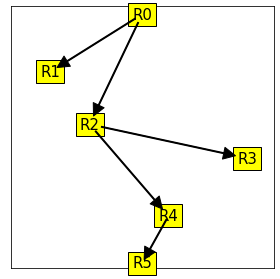

(15,) (15,) [9.35638039e-01 9.89574774e-01 1.00000000e-04 1.00000000e-04
 1.00000000e-04 1.00000000e-04 1.00000000e-04 1.00000000e-04
 1.00000000e-04 9.87057152e-01 9.68938890e-01 1.00000000e-04
 1.00000000e-04 1.00000000e-04 9.90556015e-01]
[5] shared substrate 4
[3 4] shared substrate 2


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: divide by zero encountered in true_divide


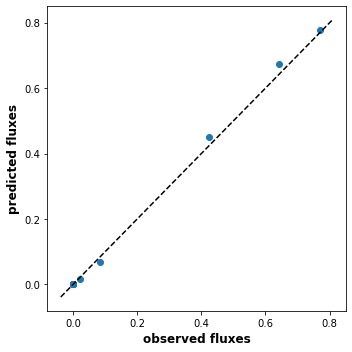

In [74]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_heatdissipation_randChems.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)

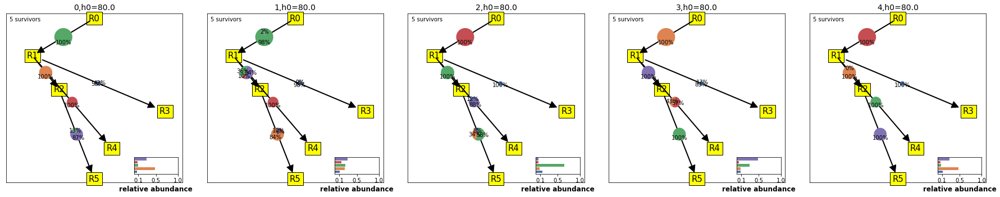

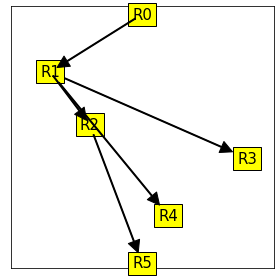

(15,) (15,) [8.69290673e-01 1.00000000e-04 1.00000000e-04 1.00000000e-04
 1.00000000e-04 9.93915455e-01 9.97215500e-01 9.75875227e-01
 1.00000000e-04 8.97793584e-01 9.89000477e-01 9.88900451e-01
 1.00000000e-04 1.00000000e-04 1.00000000e-04]
[5] shared substrate 2
[2 3 4] shared substrate 1


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: divide by zero encountered in true_divide


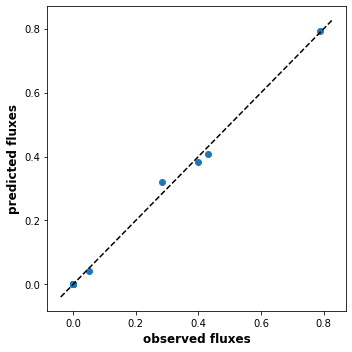

In [73]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_heatdissipation_randChems2.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)




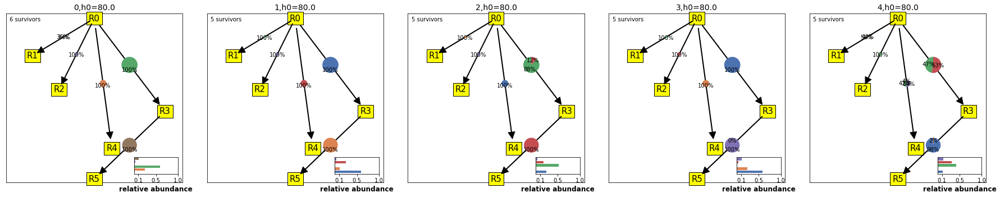

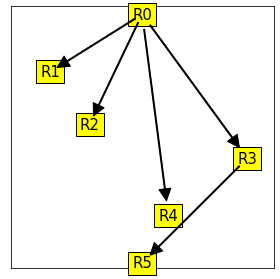

[5] shared substrate 3


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:56: RuntimeWarning: divide by zero encountered in true_divide


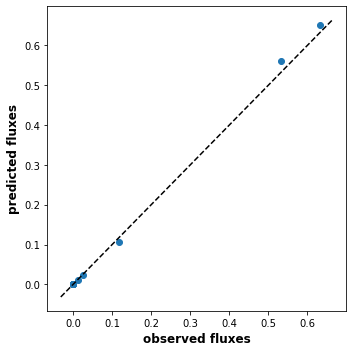

In [7]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_heatdissipation_1.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)




#### exploring breaking of maxx dissip

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:222: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 


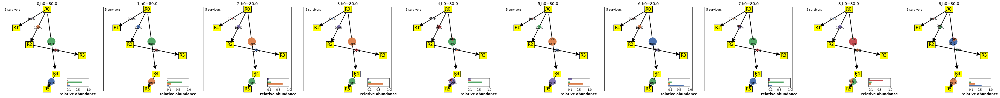

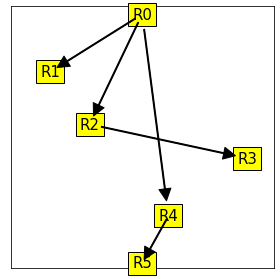

[5] shared substrate 4
[3] shared substrate 2


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: divide by zero encountered in true_divide


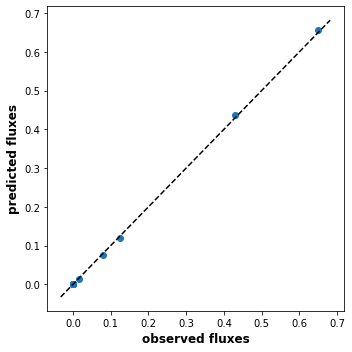

In [97]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_heatdissipation_3.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(10).astype(int))

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)

#### example of max dissip not working.
RT was 2 for just this one.

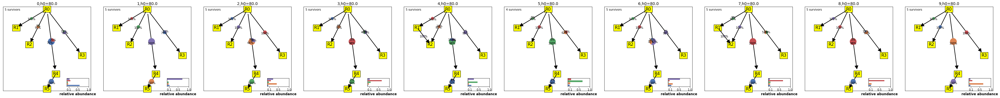

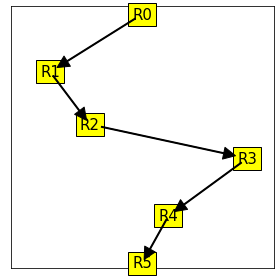

[5] shared substrate 4
[4] shared substrate 3
[3] shared substrate 2
[2] shared substrate 1


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:59: RuntimeWarning: divide by zero encountered in true_divide


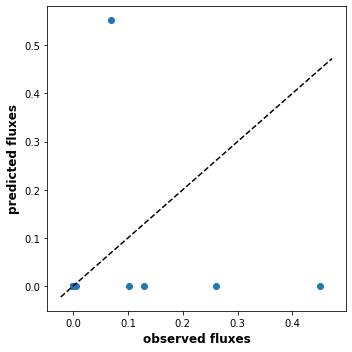

In [84]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_heatdissipation_2.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(10).astype(int))

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)




In [70]:
np.exp(-4.66)

0.009466462401710323

In [85]:
sim_data_df['pool0']['expt0']['params']['DG']

array([-0.87923857, -1.649236  , -2.44665822, -3.32426003, -1.75775521,
       -0.916342  , -1.04930609, -2.20368761, -2.38416156, -0.83118544,
       -1.66858809, -0.85777446, -0.89563323, -0.85208559, -0.85939675])

In [86]:
sim_data_df['pool0']['expt0']['params']['products'][5]

2

In [87]:
sim_data_df['pool0']['expt0']['params']['DG'][5]

-0.916342004123856

In [91]:
sim_data_df['pool0']['expt0']['params']['N_ATP']

array([0.12076143, 0.350764  , 0.55334178, 0.67573997, 3.24224479,
       0.083658  , 0.95069391, 0.79631239, 1.61583844, 0.16881456,
       0.33141191, 2.14222554, 0.10436677, 1.14791441, 0.14060325])

In [44]:
np.random.uniform(.15, .85,15)

array([0.68730415, 0.17320986, 0.41040171, 0.19615637, 0.33648042,
       0.24646699, 0.16331297, 0.3298413 , 0.61473464, 0.31088368,
       0.46497682, 0.80308221, 0.25018526, 0.49567051, 0.49742547])

In [90]:
sim_data_df['pool0']['expt0']['params']['N_ATP'][5]

0.08365799587614398

In [89]:
sim_data_df['pool0']['expt0']['params'].keys()

dict_keys(['m', 'reaction_network_type', 'Energies', 'RT', 'K_P', 'K_S', 'Kcat', 'assumptions', 'stoichiometry_provided', 'E_ATP', 'Enzyme_cost_factor', 'energy_dist', 'DEnergy', 'DG', 'N_ATP', 'Energy_yield', 'Enzyme_costs', 'n_reactions', 'substrates', 'products', 'Sub_to_res', 'Pro_to_res', 'g', 'tau', 'rho', 'yield', 'popn_cutoff', 'R_supply', 'Enzyme_alloc', 'rho_rev', 'Rsupply'])

##### So one example of max dissipation failing was when the DG to resource 5 was either -4 or -4.6, which has a very small difference
predicted R0-R1-R5 with DG of -4.66 but saw R0-R2-R3-R4-R5 with DG of -4 in many runs..

This could be because the 1st reaction R0-R1 did not produce enough R1 to sustain R1-R5!

R1-R5 heat dissipated was -3.91422649732746 and so energy assimilated was only .09!! which was too small.

In [82]:
DGvals_onpaths_list

[[-0.7516084847477635],
 [-1.772569571259979, -1.1494933873584767],
 [-0.8460617053184558, -1.6867526821012402, -2.5922995165529015],
 [-0.756440881335045,
  -0.7870113698502836,
  -1.8219223651995555,
  -2.8410940622587635],
 [-1.8615896813097041,
  -4.665834982075223,
  -2.434793700703861,
  -4.013393260853496,
  -2.9236642412010245]]

In [72]:
sim_data_df['pool0']['expt0']['params']['DG']

array([-0.75160848, -1.77256957, -0.84606171, -0.75644088, -1.86158968,
       -0.3978849 , -0.9351442 , -0.03540289, -3.9142265 , -0.81972995,
       -0.04935279, -0.66222413, -0.24879455, -1.42109374, -0.08257018])

In [74]:
sim_data_df['pool0']['expt0']['params']['substrates']

array([0, 0, 0, 0, 0, 1, 1, 1, 1, 2, 2, 2, 3, 3, 4])

In [75]:
sim_data_df['pool0']['expt0']['params']['products']

array([1, 2, 3, 4, 5, 2, 3, 4, 5, 3, 4, 5, 4, 5, 5])

In [79]:
sim_data_df['pool0']['expt0']['params']['substrates'][8], sim_data_df['pool0']['expt0']['params']['products'][8]

(1, 5)

In [78]:
sim_data_df['pool0']['expt0']['params']['DG'][8]

-3.91422649732746

In [17]:
np.mean(np.sum(sim_data_df['pool0']['expt0']['params']['Enzyme_alloc'],axis=1))

2.710887299081712

In [44]:
sim_data_df['pool0']['expt0']['params']['RT']

1.0

## functional redundancy/ evenness

In [8]:
def per_reaction_props_df(analysis_df, data_df): ##returns for single exptal condition runs
    exp_conditions_list = analysis_df['exp_conditions_list']
    reaction_substrates = analysis_df['reaction_substrates']
    reaction_products = analysis_df['reaction_products']
    n_resources = analysis_df['n_resources']
    n_reactions = analysis_df['n_reactions']
    n_pools = data_df['number_of_pools']
    pool_ids=np.arange(n_pools).astype(int)#[1,4]  
    color_list=create_color_list(scheme_name='sns_deep')
    reaction_labels = ['R'+str(reaction_substrates[i])+r'$\to$R'+str(reaction_products[i])
                       for i in range(len(reaction_substrates))]

    Energy_yield = data_df['pool0']['expt0']['params']['Energy_yield']
    DEnergy=data_df['pool0']['expt0']['params']['DEnergy']
    assert np.array_equal(data_df['pool0']['expt0']['params']['Energy_yield'],
                          data_df['pool1']['expt0']['params']['Energy_yield'])

    df_plot = pd.DataFrame([],columns=['expt_id','reaction_id','reaction label', 'enzyme abundance in reaction', 'normalized enzyme abundance in reaction',
                     'exp_condition', 'substrate','product','energy_yield',
                     'energy_gap','pool_id','Number of species',
                    'degree of specialization','flux_in_reaction',
                    'effective Nspecies by flux','effective Nspecies by enzyme'
                            ])  

    for expt_id, expt_condition in enumerate(exp_conditions_list):
        
        expt_df = analysis_df['expt'+str(expt_id)]
        reactions_in_final_survivors_list = expt_df['reactions_in_final_survivors_list']
        abundance_list = expt_df['abundance_of_survivors']
        Enz_and_N_weighted_reactions_in_survivors_list = expt_df[
            'enzyme_and_abundance_weighted_reactions_in_survivors']
#         Enz_budget_allocated_to_reactions_in_survivors_list=expt_df['enzyme_budget_allocated_to_reactions_in_survivors_list']
        fluxes_by_survivors_list=expt_df['fluxes_by_survivors_list']
        
        for pool_ctr, pool_id in enumerate(pool_ids):
            reactions_in_survivors = np.array(reactions_in_final_survivors_list[pool_id])
            fluxes_by_survivors= np.array(fluxes_by_survivors_list[pool_id])
            abundance_survivors = abundance_list[pool_id]
            Enz_and_N_weighted_reactions = np.array(
                Enz_and_N_weighted_reactions_in_survivors_list[pool_id])
#             Enz_budget_allocated_to_reactions=np.array(
#                     Enz_budget_allocated_to_reactions_in_survivors_list[pool_id])
            total_enzyme=np.sum(Enz_and_N_weighted_reactions)
            for reaction in range(n_reactions):
                enz_in_reaction=Enz_and_N_weighted_reactions[:,reaction]
                fluxes_in_reaction=fluxes_by_survivors[:,reaction]
                if len(np.nonzero(enz_in_reaction)[0])>=1:
                    total_enz_in_reaction=np.sum(enz_in_reaction) 
                    f_enz=enz_in_reaction[np.nonzero(enz_in_reaction)[0]]/total_enz_in_reaction
                    eff_num_species_enz = 1./np.sum(np.square(f_enz))                                         
                else:
                    eff_num_species_enz=0.
                if len(np.nonzero(fluxes_in_reaction)[0])>=1: 
                    total_flux_in_reaction=np.sum(fluxes_in_reaction)
                    f_flux=fluxes_in_reaction[np.nonzero(fluxes_in_reaction)[0]]/total_flux_in_reaction
                    eff_num_species_flux = 1./np.sum(np.square(f_flux))     
                else:
                    eff_num_species_flux=0.
                '''
                effective number of species in REALIZED reactions will be the same by both methods
                '''
                    
                    
#                 max_degree_of_specialization=np.max(Enz_budget_allocated_to_reactions[:,reaction])
                max_degree_of_specialization=-1 ### need to implement a new way of calculating degree of specialization,

                df_plot = df_plot.append({
                    'expt_id':expt_id,'reaction_id':reaction,'pool_id':pool_id,
                                    'reaction label':reaction_labels[reaction],
                                    'substrate':reaction_substrates[reaction],'product':reaction_products[reaction],
                            'energy_yield':float(Energy_yield[reaction]),'energy_gap':DEnergy[reaction],
                            'enzyme abundance in reaction': total_enz_in_reaction,
                            'normalized enzyme abundance in reaction': total_enz_in_reaction/total_enzyme,
                            'Number of species': 1.*len(np.nonzero(enz_in_reaction)[0]),
                            'effective Nspecies by flux':eff_num_species_flux,
                            'effective Nspecies by enzyme':eff_num_species_enz,
                            'flux_in_reaction':np.sum(fluxes_in_reaction),
                            'exp_condition':  expt_df['exp_condition'],
                            'degree of specialization':max_degree_of_specialization}, ignore_index=True)#'Rsupply': np.array2string(expt_condition[0], separator=',')
        print ('expt_id', expt_id)      
    return df_plot


def box_plot_of_eff_Num_species(df_sub):  
    fig= plt.figure(figsize=(8,4))
    ax1 = fig.add_subplot(1,2,1)
    ax2 = fig.add_subplot(1,2,2)
    # order =sorted_reaction_labels,
    ax1 = sns.boxplot(x='reaction label', y='effective Nspecies by flux',           
                data=df_sub, ax=ax1, palette="deep",fliersize=2)
    ax2 = sns.boxplot(x='reaction label', y='effective Nspecies by enzyme',  
                data=df_sub, ax=ax2, palette="deep",fliersize=2)
    # order =sorted_reaction_labels,
    for ax in [ax1,ax2]:# [ax1, ax2, ax3]:  # make bigger font
    #         ax.set_ylabel('eff. num of species')
        ax.yaxis.label.set_size(11)
        ax.yaxis.label.set_weight('bold')
        ax.xaxis.label.set_size(11)
        ax.xaxis.label.set_weight('bold')
        ax.set_ylim(-0.2,6)
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show()
    

expt_id 0


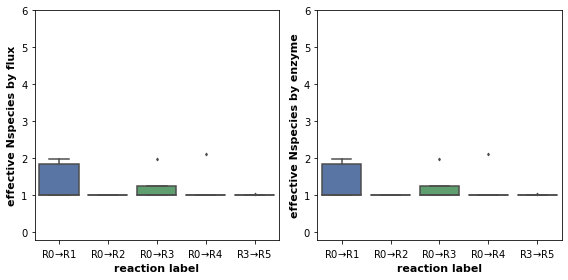

In [61]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_heatdissipation_1.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)

df_plot_per_reaction=per_reaction_props_df(analysis_df, sim_data_df)
min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
flat_list = list(itertools.chain(*min_DG_path_list))
predicted_reactions=list(set(flat_list))
realized_rxn_ids=df_plot_per_reaction[df_plot_per_reaction['flux_in_reaction']!=0]['reaction_id'].values
for r in realized_rxn_ids:
    if r not in predicted_reactions:print ("max dissipation prediction doesnt agree", r, predicted_reactions)
        

df_sub=df_plot_per_reaction[df_plot_per_reaction['flux_in_reaction']!=0]
box_plot_of_eff_Num_species(df_sub)   

# Varying dilution/growth rate

varying $\delta / g_{max}$ to see how max heat dissipation and functional redundancy slowly breaks.

Testing other distance metrics

most distance metrics show the nonmonotonic  behavior, with decrease after ~0.2. 
Euclidean metric does not show this only because the overall magnitude of the flux also increases with delta and so the distance increases. This is not a good reason to get a monotonic plot.  So looks like JSD remains our best bet.

In [32]:

def plot_func_distance_metric(analysis_df, min_DG_path_list, min_DG_list, df_master,
                              dist_metric='jensenshannon',
                            n_resources=6, pool_label='pool0', title=None, xlabel='param'):   

    avg_pwise_dist=[]
    avg_dist_to_theory=[]
    stderr_pwise_dist=[]
    stderr_dist_to_theory=[]
    
    min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
    for idx, val in enumerate(analysis_df['exp_conditions_list']):
        exp_label='expt'+ str(idx)        
        pwise_dists=distance.pdist(analysis_df[exp_label]['flux_in_community_list'], 
                                   metric=dist_metric)
        avg_pwise_dist.append(np.mean(pwise_dists))
        stderr_pwise_dist.append(np.std(pwise_dists)/len(pwise_dists))
        R_ss,  Flux_in_rxns, Flux_into_resource=calculate_Rss_and_fluxes_theory(min_DG_path_list, min_DG_list, df_master,
                            n_resources=6,Prediction_Order=1,
                            exp_label=exp_label)     
        dist_to_theory=[]
        for pool_id in range(analysis_df['number_of_pools']):
    #         dist_to_theory.append(distance.braycurtis (
    #             Flux_in_rxns, analysis_df[exp_label]['flux_in_community_list'][pool_id])  )   

            dist_to_theory.append(distance.cdist (
                Flux_in_rxns[np.newaxis,:], 
                analysis_df[exp_label]['flux_in_community_list'][pool_id][np.newaxis,:],
                                 metric=dist_metric)   )


        avg_dist_to_theory.append(np.mean(dist_to_theory))
        stderr_dist_to_theory.append(np.std(dist_to_theory)/len(dist_to_theory))




    fig = plt.figure(figsize=(8, 4))
    ax1=fig.add_subplot(1,2,1)
    ax2=fig.add_subplot(1,2,2)
    ax1.plot(analysis_df['exp_conditions_list'], avg_pwise_dist, 'bo', label= 'dist b/w pools')
    ax1.plot(analysis_df['exp_conditions_list'],avg_dist_to_theory, 'go', label= 'dist from theory')
    ax1.legend(loc='best')
    # ax1.errorbar(analysis_df['exp_conditions_list'], avg_pwise_dist, yerr=stderr_pwise_dist)
    ax1.set_yscale('log')
    ax1.set_xscale('log')
    
    ax2.plot(analysis_df['exp_conditions_list'], 1.-np.array(avg_pwise_dist), 'bo', label= 'dist b/w pools')
    ax2.plot(analysis_df['exp_conditions_list'],1.-np.array(avg_dist_to_theory), 'go', label= 'dist from theory')
    ax2.set_xscale('log')
    ax1.set_xlabel(xlabel)
    ax1.set_ylabel('distance')
    ax2.set_xlabel(xlabel)
    ax2.set_ylabel('convergence to theory')

    if title is not None:
        ax1.set_title(title)
    
    fig.patch.set_facecolor('white')
    plt.tight_layout()
    plt.show() 

### file 1

In [3]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/cluster/S6_dilution_1/'
sim_file_name='sim_dilution.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)

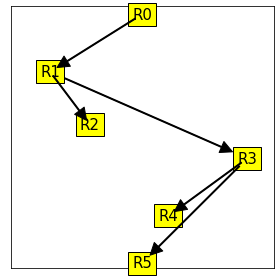

In [6]:

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)


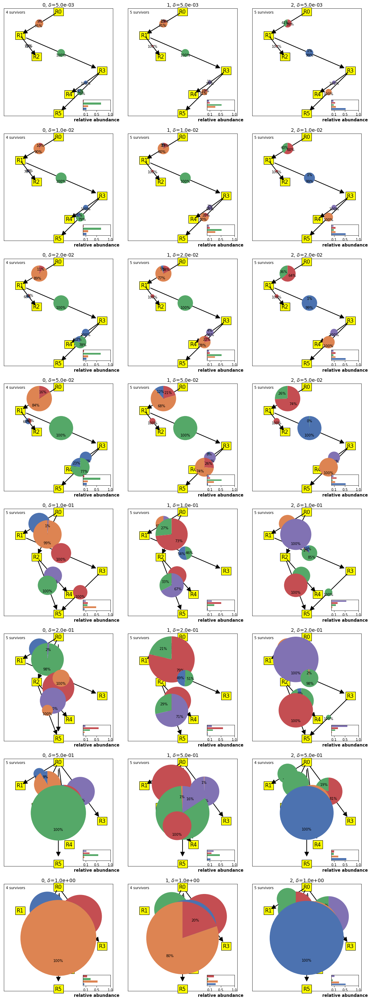

In [19]:
plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(3).astype(int), param_varied=r'$\delta$')

exp:  expt0 delta=  0.005
rms of pred - obs, 0th order =  0.0009450371822063692
rms of pred - obs, 1st order =  0.000699756975168384


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


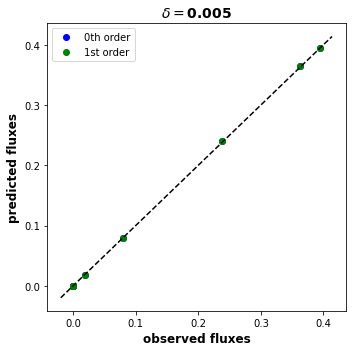

exp:  expt1 delta=  0.01
rms of pred - obs, 0th order =  0.003714330637072183
rms of pred - obs, 1st order =  0.0027249395980425742


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


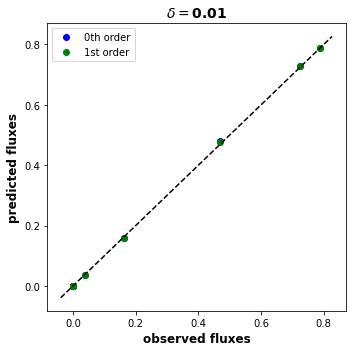

exp:  expt2 delta=  0.02
rms of pred - obs, 0th order =  0.014386381535511698
rms of pred - obs, 1st order =  0.010362759131984148


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


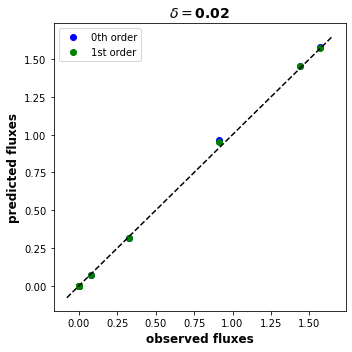

exp:  expt3 delta=  0.05
rms of pred - obs, 0th order =  0.08298327214057107
rms of pred - obs, 1st order =  0.056599969581866756


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


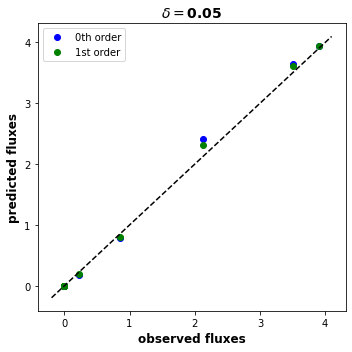

exp:  expt4 delta=  0.1
rms of pred - obs, 0th order =  2.5441950525276407
rms of pred - obs, 1st order =  2.4747673005454778


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


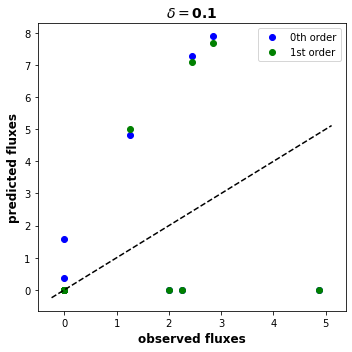

exp:  expt5 delta=  0.2
rms of pred - obs, 0th order =  5.99678817902983
rms of pred - obs, 1st order =  4.476565334508782


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


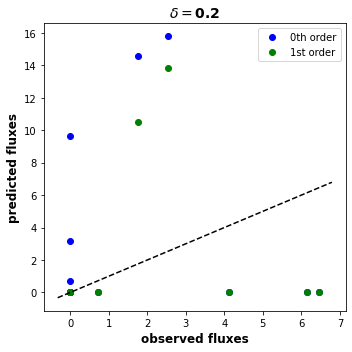

exp:  expt6 delta=  0.5
rms of pred - obs, 0th order =  16.164160160612365
rms of pred - obs, 1st order =  13.685647933597524


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


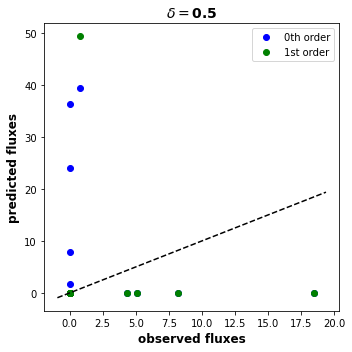

exp:  expt7 delta=  1.0
rms of pred - obs, 0th order =  32.48227973756316
rms of pred - obs, 1st order =  10.690769148900056


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


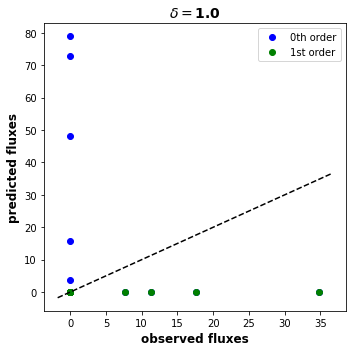

In [50]:

for expt_id, expt_val in enumerate(analysis_df['exp_conditions_list']): 
    plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                        n_resources=6,exp_label='expt'+str(expt_id), title=r'$\delta=$'+str(expt_val))


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


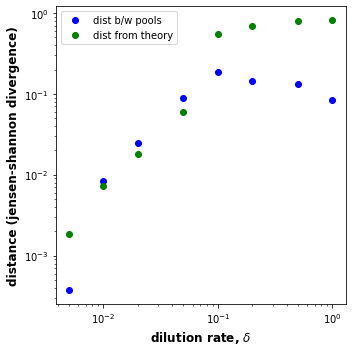

In [49]:
plot_func_distance_btw_pools(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                n_resources=6, title=None, xlabel=r'dilution rate, $\delta$')

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


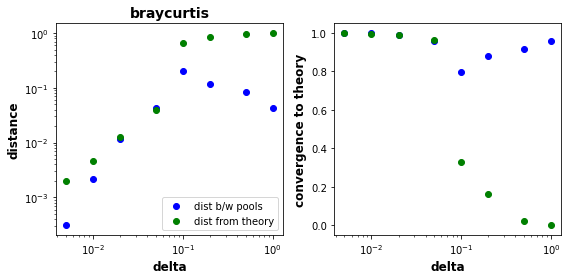

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


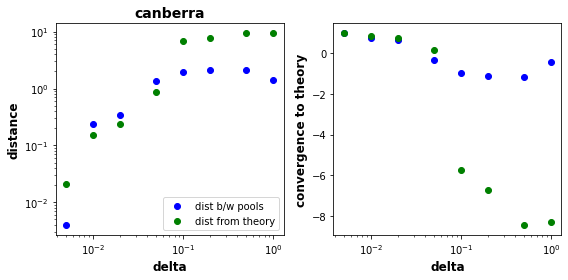

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


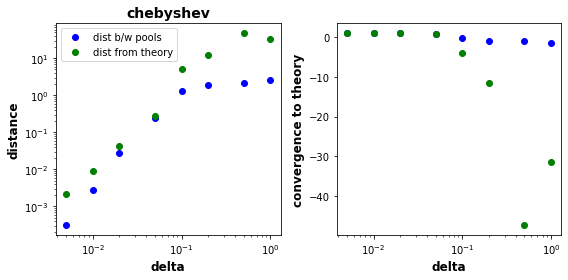

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


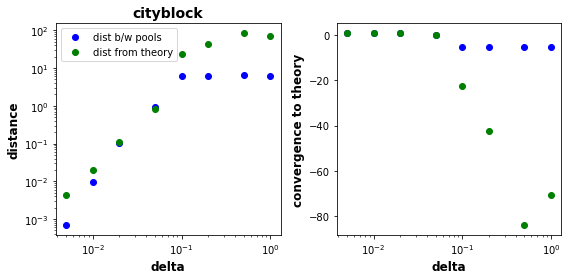

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


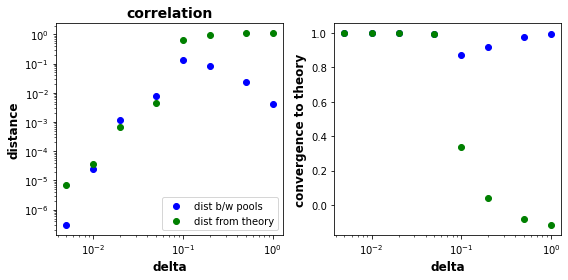

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


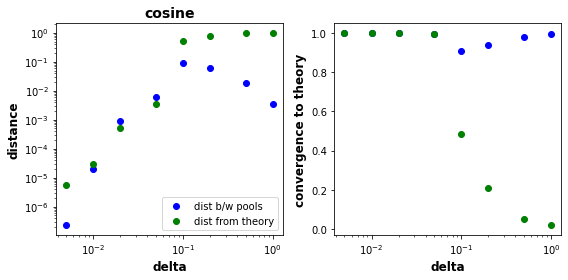

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


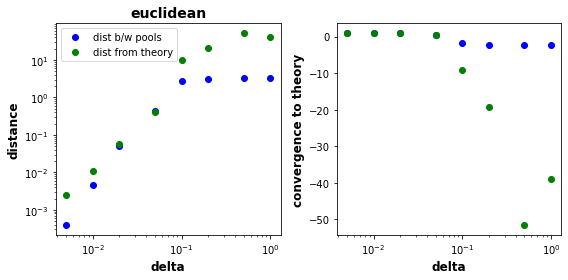

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


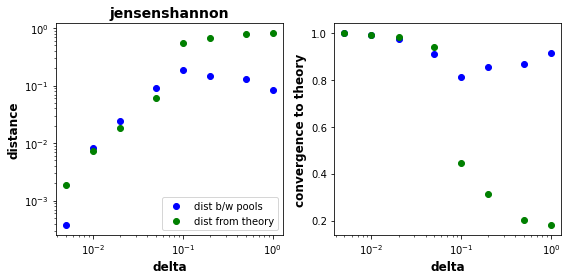

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


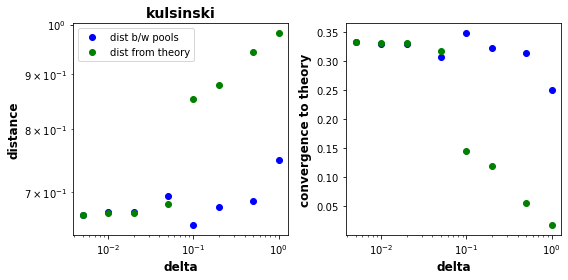

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


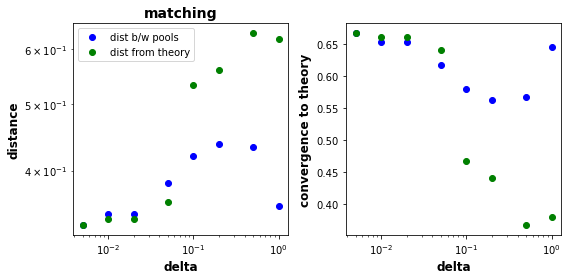

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


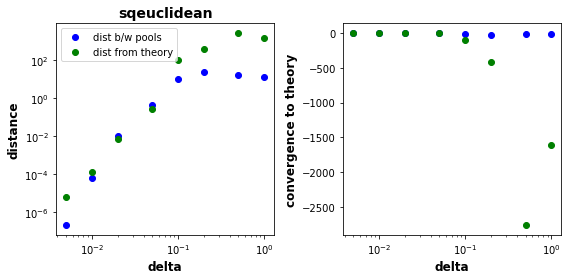

In [37]:
for metric in ['braycurtis', 'canberra', 'chebyshev', 'cityblock', 'correlation', 'cosine', 'euclidean',  'jensenshannon', 'kulsinski', 'matching',  'sqeuclidean']:

    plot_func_distance_metric(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                  dist_metric=metric,
                                n_resources=6, pool_label='pool0', title=metric, xlabel='delta')

### file2

In [3]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/cluster/S6_dilution_2/'
sim_file_name='sim_dilution.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)

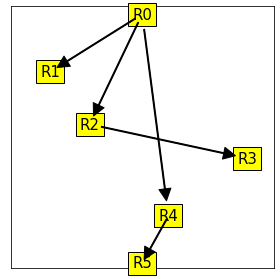

In [6]:

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)


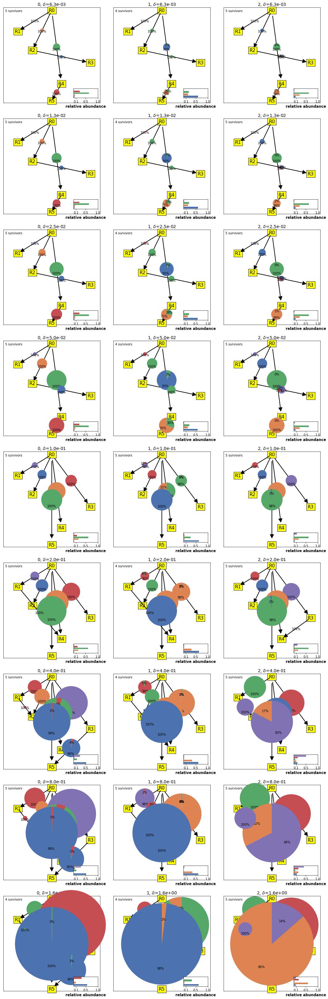

In [13]:
plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(3).astype(int), param_varied=r'$\delta$')

exp:  expt0 delta=  0.00625
rms of pred - obs, 0th order =  0.0008866400901217322
rms of pred - obs, 1st order =  0.0009545013713422783


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


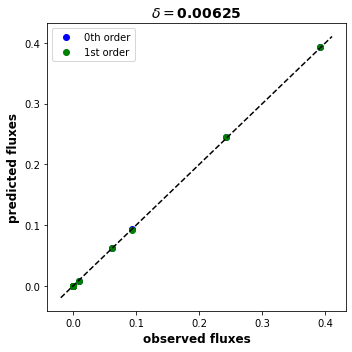

exp:  expt1 delta=  0.0125
rms of pred - obs, 0th order =  0.0034286764818325234
rms of pred - obs, 1st order =  0.0036912071397855115


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


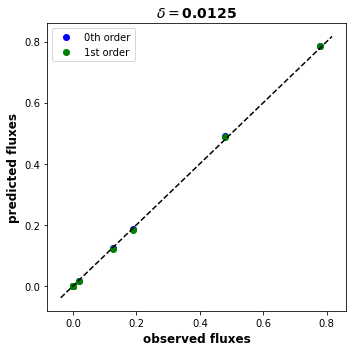

exp:  expt2 delta=  0.025
rms of pred - obs, 0th order =  0.012885885891881024
rms of pred - obs, 1st order =  0.013861199562655174


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


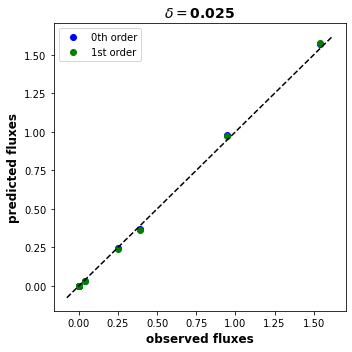

exp:  expt3 delta=  0.05
rms of pred - obs, 0th order =  0.04638419393483097
rms of pred - obs, 1st order =  0.04968883798816633


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


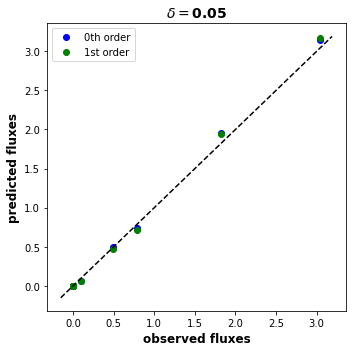

exp:  expt4 delta=  0.1
rms of pred - obs, 0th order =  1.7164969266824415
rms of pred - obs, 1st order =  1.3336770918991725


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


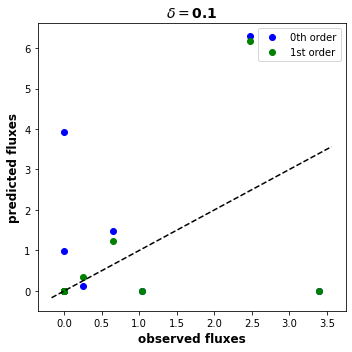

exp:  expt5 delta=  0.2
rms of pred - obs, 0th order =  3.5193333832935196
rms of pred - obs, 1st order =  2.7894651766949754


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


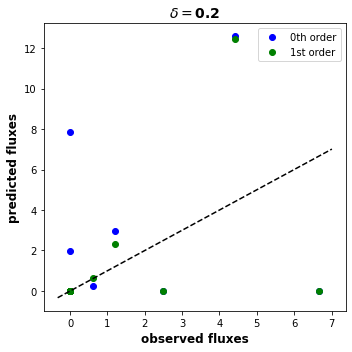

exp:  expt6 delta=  0.4
rms of pred - obs, 0th order =  7.239337835236231
rms of pred - obs, 1st order =  5.960953773278583


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


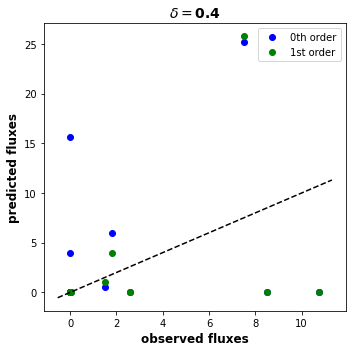

exp:  expt7 delta=  0.8
rms of pred - obs, 0th order =  15.132496300129358
rms of pred - obs, 1st order =  13.380492166727525


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


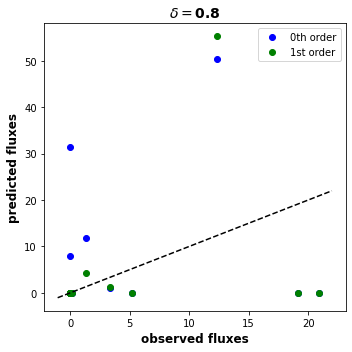

exp:  expt8 delta=  1.6
rms of pred - obs, 0th order =  31.790678990977
rms of pred - obs, 1st order =  31.25095445430267


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


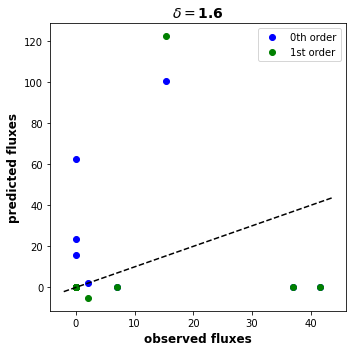

In [10]:

for expt_id, expt_val in enumerate(analysis_df['exp_conditions_list']): 
    plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                        n_resources=6,exp_label='expt'+str(expt_id), title=r'$\delta=$'+str(expt_val))


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


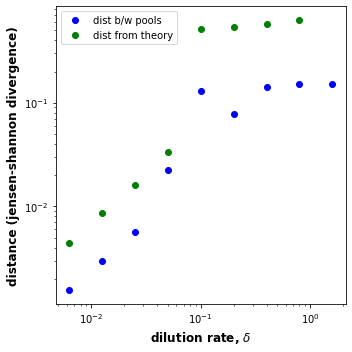

In [14]:
plot_func_distance_btw_pools(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                n_resources=6, title=None, xlabel=r'dilution rate, $\delta$')

In [11]:
### comparing observed Rss.

print(sim_data_df['pool0']['expt0']['SS_values'][1])
print(sim_data_df['pool0']['expt1']['SS_values'][1])
print(sim_data_df['pool0']['expt2']['SS_values'][1])
print(sim_data_df['pool0']['expt3']['SS_values'][1])
print(sim_data_df['pool0']['expt4']['SS_values'][1])
print(sim_data_df['pool0']['expt5']['SS_values'][1])
print(sim_data_df['pool0']['expt6']['SS_values'][1])

[ 1.20600629  2.49012282  3.67911748  9.16920295 15.93081699 47.52473348]
[ 1.27858047  2.57349562  3.77975134  9.35741575 16.1079386  46.90281821]
[ 1.42986129  2.73974749  3.97692781  9.71591912 16.41591209 45.7216322 ]
[ 1.93772263  3.23814365  4.5416844  10.67164439 17.03537973 42.5754252 ]
[ 2.93561881  3.99113559  6.18782472 11.78134133 19.96594425 35.13813529]
[ 4.24543589  3.86710916  8.10055892  8.83656797 20.57050049 34.37982757]
[ 6.09207581  1.59472902  8.7489278  10.24109192 16.39982973 36.92334572]


In [14]:
#### comparing N_ss observed
temp=sim_data_df['pool0']['expt0']['SS_values'][0]
print(np.nonzero(temp),temp[np.nonzero(temp)])
temp=sim_data_df['pool0']['expt1']['SS_values'][0]
print(np.nonzero(temp),temp[np.nonzero(temp)])
temp=sim_data_df['pool0']['expt2']['SS_values'][0]
print(np.nonzero(temp),temp[np.nonzero(temp)])
temp=sim_data_df['pool0']['expt3']['SS_values'][0]
print(np.nonzero(temp),temp[np.nonzero(temp)])

temp=sim_data_df['pool0']['expt4']['SS_values'][0]
print(np.nonzero(temp),temp[np.nonzero(temp)])
temp=sim_data_df['pool0']['expt5']['SS_values'][0]
print(np.nonzero(temp),temp[np.nonzero(temp)])
temp=sim_data_df['pool0']['expt6']['SS_values'][0]
print(np.nonzero(temp),temp[np.nonzero(temp)])
temp=sim_data_df['pool0']['expt7']['SS_values'][0]
print(np.nonzero(temp),temp[np.nonzero(temp)])


(array([  5,  69, 399, 471]),) [11.79529165 17.84379995 61.6320848   2.38753192]
(array([  5,  69, 399, 471]),) [11.87336602 17.68713599 61.26865845  2.57579002]
(array([  5,  69, 399, 471]),) [11.99961703 17.36450585 60.56502248  2.9625271 ]
(array([  5,  69, 399, 471]),) [12.19529776 16.3593043  58.58845884  4.15524842]
(array([ 69, 192, 196, 399, 549]),) [ 7.0563018  55.12669351 18.43420806 20.68796017 11.68545833]
(array([ 69, 157, 192, 367, 549]),) [ 3.16065886  9.03828127 36.36370182 82.01149685 12.03928627]
(array([176, 192, 367, 379, 493]),) [ 2.22910896  9.14015667 98.59104256 43.6521545  22.98090393]
(array([192, 367, 379, 493]),) [ 8.86372625 93.079335   47.88056896 25.52867418]


### file3

In [3]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/cluster/S6_dilution_3/'
sim_file_name='sim_dilution.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)

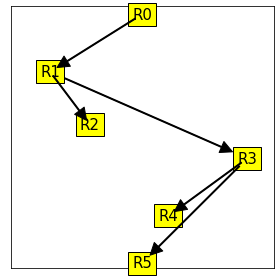

In [7]:

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)


exp:  expt0 delta=  0.00625
rms of pred - obs, 0th order =  0.0009620015511668674
rms of pred - obs, 1st order =  0.000822430274075927


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


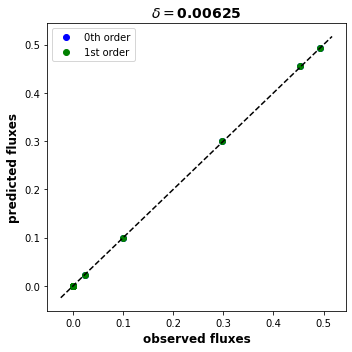

exp:  expt1 delta=  0.0125
rms of pred - obs, 0th order =  0.0038485752916311267
rms of pred - obs, 1st order =  0.0032883356756082905


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


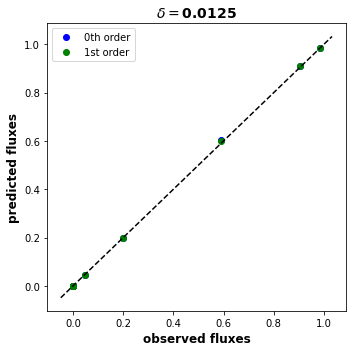

exp:  expt2 delta=  0.025
rms of pred - obs, 0th order =  0.015529020851920589
rms of pred - obs, 1st order =  0.013286413433369953


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


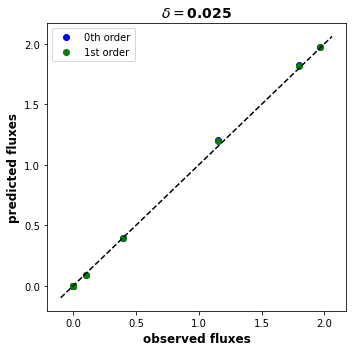

exp:  expt3 delta=  0.05
rms of pred - obs, 0th order =  0.10776765371689273
rms of pred - obs, 1st order =  0.10393609592136635


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


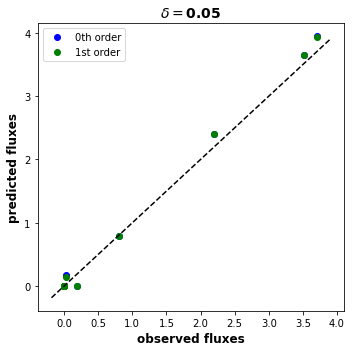

exp:  expt4 delta=  0.1
rms of pred - obs, 0th order =  3.1632992593595644
rms of pred - obs, 1st order =  2.743863196072006


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


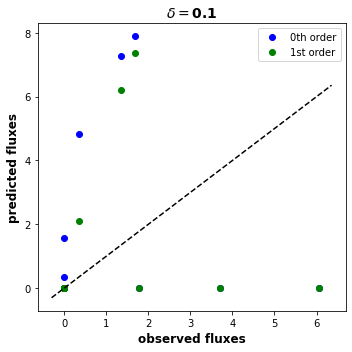

exp:  expt5 delta=  0.2
rms of pred - obs, 0th order =  7.514988959777615
rms of pred - obs, 1st order =  5.07230845452484


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


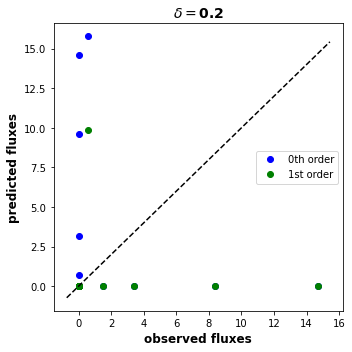

exp:  expt6 delta=  0.4
rms of pred - obs, 0th order =  12.81658696898178
rms of pred - obs, 1st order =  9.682168358094067


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


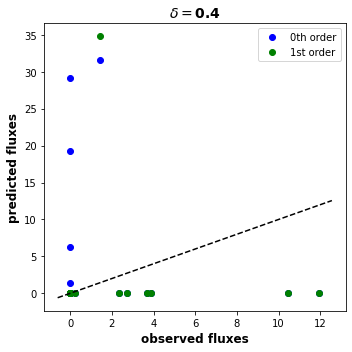

exp:  expt7 delta=  0.8
rms of pred - obs, 0th order =  26.00140354412509
rms of pred - obs, 1st order =  8.599835871325212


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


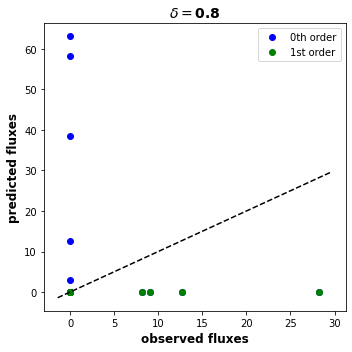

exp:  expt8 delta=  1.6
rms of pred - obs, 0th order =  51.62754664758653
rms of pred - obs, 1st order =  16.029358560026257


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


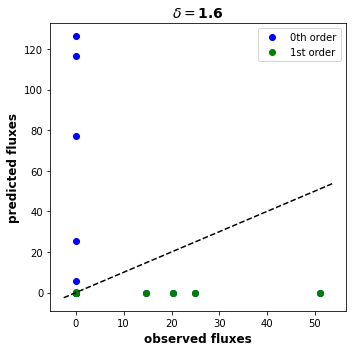

In [8]:

for expt_id, expt_val in enumerate(analysis_df['exp_conditions_list']): 
    plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                        n_resources=6,exp_label='expt'+str(expt_id), title=r'$\delta=$'+str(expt_val))


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:88: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 


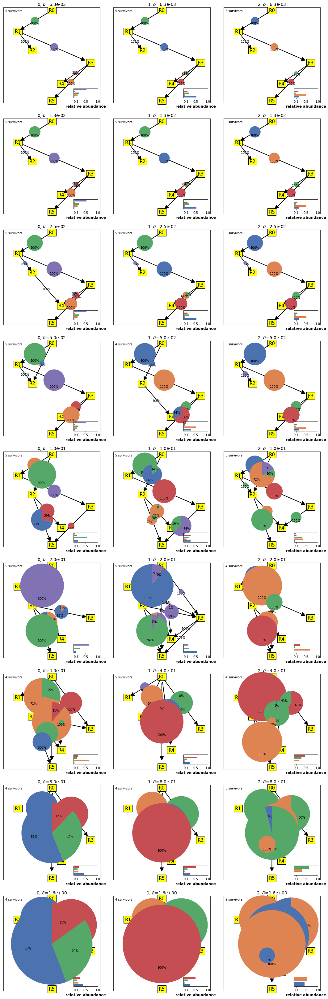

In [9]:
plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(3).astype(int), param_varied=r'$\delta$')

##### debugging

In [102]:
exp_label='expt0'
assumptions_init=sim_data_df['pool0'][exp_label]['params']['assumptions']
params_init=sim_data_df['pool0'][exp_label]['params']
N_init=sim_data_df['pool0'][exp_label]['SS_values'][0]
R_init=sim_data_df['pool0'][exp_label]['SS_values'][1]
def dNdt(N, R, params):
    return MakeConsumerDynamics(assumptions_init)(N, R, params)
def dRdt(N, R, params):
    return MakeResourceDynamics(assumptions_init)(N, R, params)
def calc_fluxes(N,R,params):
    return Make_flux_calculator(assumptions_init)(N,R,params)

world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

np.max(np.abs(compute_dlogNdt(N_init, R_init, world_i.params, dNdt)))

3.3517681286704404e-08

In [95]:
sim_data_df['pool0'][exp_label]['params']['tau']

100.0

In [84]:
dRdt(N_init, R_init, world_i.params)

array([-3.57240471e-09,  1.03989500e-09, -2.67952489e-08, -4.86863173e-08,
        7.62736691e-05, -7.61956834e-05])

In [86]:
def fluxcalc(N, R, params):
    return MakeResourceDynamics(assumptions_init,return_fluxes=True)(N, R, params)
fluxcalc(N_init, R_init, world_i.params)

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0., -0., ...,  0., -0.,  0.],
       ...,
       [ 0.,  0., -0., ...,  0., -0.,  0.],
       [ 0.,  0., -0., ...,  0.,  0.,  0.],
       [ 0.,  0., -0., ...,  0.,  0.,  0.]])

In [88]:
np.sum(fluxcalc(N_init, R_init, world_i.params),axis=0)

array([0.01932244, 0.17431864, 0.        , 0.58821978, 0.00294996,
       0.        , 0.        , 0.        , 0.        , 0.11351786,
       0.        , 0.        , 0.        , 0.        , 0.35031187])

In [82]:

fluxes_SS=calc_fluxes(N_init, R_init, world_i.params)              

In [83]:
np.sum(fluxes_SS,axis=0)

array([0.01932244, 0.17431864, 0.        , 0.58821978, 0.00294996,
       0.        , 0.        , 0.        , 0.        , 0.11351786,
       0.        , 0.        , 0.        , 0.        , 0.35031187])

In [90]:
world_i.params['m']

0.05

In [89]:
world_i.params['tau']

100.0

In [48]:
params=world_i.params
R=R_init
N=N_init
params['Kcat']*(R[params['substrates']]/params['K_S'])*(1.-np.exp(params['DG']/params['RT']) *R[params['products']]/R[params['substrates']]
                         )/(1.+R[params['substrates']]/params['K_S']+params['rho_rev']*R[params['products']])

/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """


array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan])

# Redundancy different pool sizes

Sims were run on the cluster.

expt_id 0
200
max dissipation prediction doesnt agree 10 [0, 5, 6, 12, 13]
R 2 -> R 4
max dissipation prediction doesnt agree 10 [0, 5, 6, 12, 13]
R 2 -> R 4
max dissipation prediction doesnt agree 10 [0, 5, 6, 12, 13]
R 2 -> R 4
expt_id 0
400
max dissipation prediction doesnt agree 10 [0, 5, 6, 12, 13]
R 2 -> R 4
expt_id 0
800
expt_id 0
1600
expt_id 0
3200


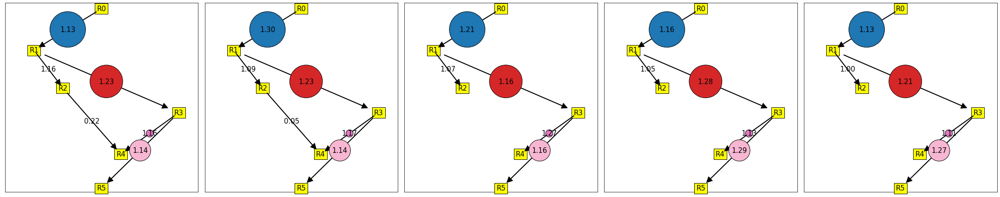

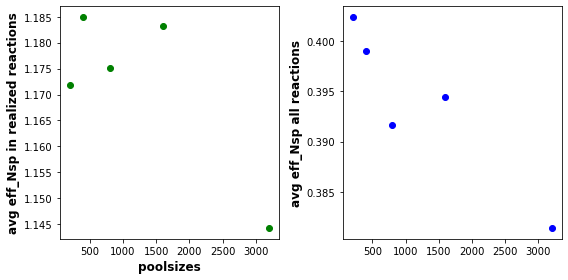

In [44]:
pool_size_list=[200,400, 800, 1600, 3200]
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/cluster/S6_2_poolsize/'

avg_eff_Nsp_all_rxns=[]
avg_eff_Nsp_realized_rxns=[]
n_poolsizes=len(pool_size_list)
fig= plt.figure(figsize=(6*n_poolsizes,6))
for idx, pool_size in enumerate(pool_size_list):
    ax1 = fig.add_subplot(1,n_poolsizes,idx+1)
    sim_file_name='sim_S6_2_Nsp'+str(pool_size)+'.dat'
    create_analysis_df(data_folder,sim_file_name)
    analysis_file_name = 'analysis_'+sim_file_name
    with open(data_folder+analysis_file_name, 'rb') as f:
        analysis_df = pickle.load(f)
    with open(data_folder+sim_file_name, 'rb') as f:
        sim_data_df = pickle.load(f)
    assert pool_size == len(sim_data_df['pool0']['expt0']['params']['Enzyme_alloc']),'param was not passed correctly!'
    df_plot_per_reaction=per_reaction_props_df(analysis_df, sim_data_df)
    min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
    flat_list = list(itertools.chain(*min_DG_path_list))
    predicted_reactions=list(set(flat_list))
    realized_rxn_ids=df_plot_per_reaction[df_plot_per_reaction['flux_in_reaction']!=0]['reaction_id'].values
    print(pool_size)
    for r in realized_rxn_ids:
        if r not in predicted_reactions:
            print ("max dissipation prediction doesnt agree", r, predicted_reactions)
            print ('R',sim_data_df['pool0']['expt0']['params']['substrates'][r],'->','R',sim_data_df['pool0']['expt0']['params']['products'][r]) 
    
    ###################################
    n_resources=analysis_df['n_resources']
    n_reactions=analysis_df['n_reactions']
    substrates=analysis_df['reaction_substrates']
    products=analysis_df['reaction_products']
    exp_conditions_list = analysis_df['exp_conditions_list']
    
    avg_eff_Nsp_all_rxns.append(np.mean(
        df_plot_per_reaction['effective Nspecies by flux'].values))
    
    avg_eff_Nsp_realized_rxns.append(np.mean(
        df_plot_per_reaction[df_plot_per_reaction['flux_in_reaction']>0
                            ]['effective Nspecies by flux'].values))
    
    if n_resources==4:    
            resources_dict={0:[0.5, .95],1:[0.1, .7],
                           2:[0.95, .39],
                           3:[0.23, .05]}
    elif n_resources==5:    
        resources_dict={0:[0.5, .92],1:[0.15, .75],
                       2:[0.75, .55],
                       3:[0.32, .35], 4:[.55,0.15]}  
    elif n_resources==6:
        resources_dict={0:[0.5, .97],1:[0.15, .75],
                       2:[0.3, .55],
                       3:[0.9, .42], 4:[0.6, .2],
                       5:[0.5, .02]}
    else:
        print('this nresources has not been positioned yet',n_resources)
        sys.exit(1)
    
#     color_list=get_color_list(n_resources,rxn_idxs=np.where(fluxes_in_community0>0)[0])
    color_list=list(sns.color_palette(palette='tab20',n_colors=n_reactions))
    for ax in [ax1]:
        for key,val in resources_dict.items(): 
            ax.text(val[0],val[1],'R'+str(key), color='black',
                     bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
            ax.set_xticks([])  
            ax.set_yticks([])  
            
        for reaction in range(n_reactions):    
            eff_Nsp=np.mean(df_plot_per_reaction[df_plot_per_reaction['reaction_id']==reaction
                                                ]['effective Nspecies by flux'].values)
            avg_flux=np.mean(df_plot_per_reaction[df_plot_per_reaction['reaction_id']==reaction
                                                ]['flux_in_reaction'].values)
            
            
            pie_radius=avg_flux*2
            if avg_flux>0:
                h,w=0.15,0.15
                x,y=(np.array(resources_dict[products[reaction]])+         
                     np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2 
                ax_inset=ax.inset_axes([x,y, h,w])
                ax.annotate('',xy=(resources_dict[products[reaction]]),
                                    xytext=(resources_dict[substrates[reaction]]),
                                    arrowprops=dict(facecolor='black', shrink=0.075,width=1))            
                ax_inset.pie([1.],
                         colors=color_list[reaction:],
                    radius=pie_radius,wedgeprops = {'linewidth': 1,'edgecolor':'k'})
                
                ax_inset.text(0,0,'{:.2f}'.format(eff_Nsp), ha='center', va='center',zorder=10, fontsize=15)
plt.tight_layout()



fig2= plt.figure(figsize=(8,4))
ax2_1 = fig2.add_subplot(1,2,1)
ax2_2 = fig2.add_subplot(1,2,2)
# ax2_2 = ax2_1.twinx()
ax2_1.plot(pool_size_list, avg_eff_Nsp_realized_rxns,'go', label='realized reactions')
ax2_2.plot(pool_size_list, avg_eff_Nsp_all_rxns,'bo', label='all reactions')

# ax2.legend(loc='best')
ax2_1.set_xlabel('poolsizes')
ax2_1.set_ylabel('avg eff_Nsp in realized reactions')
ax2_2.set_ylabel('avg eff_Nsp all reactions')
plt.tight_layout()
plt.show()



expt_id 0
200
expt_id 0
400
expt_id 0
3200


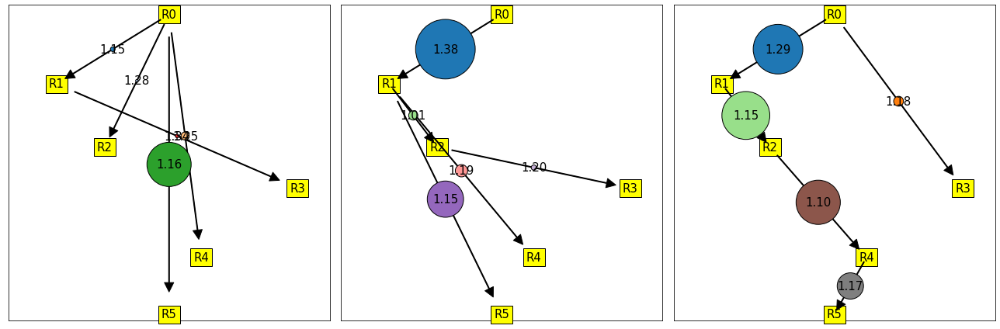

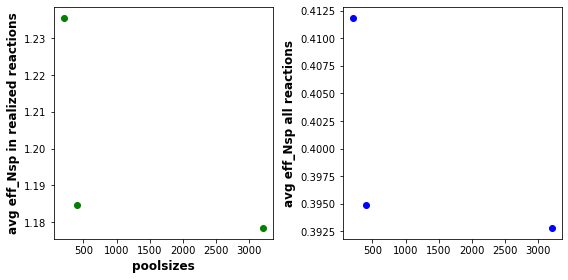

In [46]:
pool_size_list=[200,400, 3200]
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/cluster/S6_1_poolsize/'

avg_eff_Nsp_all_rxns=[]
avg_eff_Nsp_realized_rxns=[]
n_poolsizes=len(pool_size_list)
fig= plt.figure(figsize=(6*n_poolsizes,6))
for idx, pool_size in enumerate(pool_size_list):
    ax1 = fig.add_subplot(1,n_poolsizes,idx+1)
    sim_file_name='sim_S6_1_Nsp'+str(pool_size)+'.dat'
    create_analysis_df(data_folder,sim_file_name)
    analysis_file_name = 'analysis_'+sim_file_name
    with open(data_folder+analysis_file_name, 'rb') as f:
        analysis_df = pickle.load(f)
    with open(data_folder+sim_file_name, 'rb') as f:
        sim_data_df = pickle.load(f)
    assert pool_size == len(sim_data_df['pool0']['expt0']['params']['Enzyme_alloc']),'param was not passed correctly!'
    df_plot_per_reaction=per_reaction_props_df(analysis_df, sim_data_df)
    min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
    flat_list = list(itertools.chain(*min_DG_path_list))
    predicted_reactions=list(set(flat_list))
    realized_rxn_ids=df_plot_per_reaction[df_plot_per_reaction['flux_in_reaction']!=0]['reaction_id'].values
    print(pool_size)
    for r in realized_rxn_ids:
        if r not in predicted_reactions:
            print ("max dissipation prediction doesnt agree", r, predicted_reactions)
            print ('R',sim_data_df['pool0']['expt0']['params']['substrates'][r],'->','R',sim_data_df['pool0']['expt0']['params']['products'][r]) 
    
    ###################################
    n_resources=analysis_df['n_resources']
    n_reactions=analysis_df['n_reactions']
    substrates=analysis_df['reaction_substrates']
    products=analysis_df['reaction_products']
    exp_conditions_list = analysis_df['exp_conditions_list']
    
    avg_eff_Nsp_all_rxns.append(np.mean(
        df_plot_per_reaction['effective Nspecies by flux'].values))
    
    avg_eff_Nsp_realized_rxns.append(np.mean(
        df_plot_per_reaction[df_plot_per_reaction['flux_in_reaction']>0
                            ]['effective Nspecies by flux'].values))
    
    if n_resources==4:    
            resources_dict={0:[0.5, .95],1:[0.1, .7],
                           2:[0.95, .39],
                           3:[0.23, .05]}
    elif n_resources==5:    
        resources_dict={0:[0.5, .92],1:[0.15, .75],
                       2:[0.75, .55],
                       3:[0.32, .35], 4:[.55,0.15]}  
    elif n_resources==6:
        resources_dict={0:[0.5, .97],1:[0.15, .75],
                       2:[0.3, .55],
                       3:[0.9, .42], 4:[0.6, .2],
                       5:[0.5, .02]}
    else:
        print('this nresources has not been positioned yet',n_resources)
        sys.exit(1)
    
#     color_list=get_color_list(n_resources,rxn_idxs=np.where(fluxes_in_community0>0)[0])
    color_list=list(sns.color_palette(palette='tab20',n_colors=n_reactions))
    for ax in [ax1]:
        for key,val in resources_dict.items(): 
            ax.text(val[0],val[1],'R'+str(key), color='black',
                     bbox=dict(facecolor='yellow', edgecolor='k'),fontsize=15,ha='center',va='center')
            ax.set_xticks([])  
            ax.set_yticks([])  
            
        for reaction in range(n_reactions):    
            eff_Nsp=np.mean(df_plot_per_reaction[df_plot_per_reaction['reaction_id']==reaction
                                                ]['effective Nspecies by flux'].values)
            avg_flux=np.mean(df_plot_per_reaction[df_plot_per_reaction['reaction_id']==reaction
                                                ]['flux_in_reaction'].values)
            
            
            pie_radius=avg_flux*2
            if avg_flux>0:
                h,w=0.15,0.15
                x,y=(np.array(resources_dict[products[reaction]])+         
                     np.array(resources_dict[substrates[reaction]])-np.array([h,w]))/2 
                ax_inset=ax.inset_axes([x,y, h,w])
                ax.annotate('',xy=(resources_dict[products[reaction]]),
                                    xytext=(resources_dict[substrates[reaction]]),
                                    arrowprops=dict(facecolor='black', shrink=0.075,width=1))            
                ax_inset.pie([1.],
                         colors=color_list[reaction:],
                    radius=pie_radius,wedgeprops = {'linewidth': 1,'edgecolor':'k'})
                
                ax_inset.text(0,0,'{:.2f}'.format(eff_Nsp), ha='center', va='center',zorder=10, fontsize=15)
plt.tight_layout()



fig2= plt.figure(figsize=(8,4))
ax2_1 = fig2.add_subplot(1,2,1)
ax2_2 = fig2.add_subplot(1,2,2)
# ax2_2 = ax2_1.twinx()
ax2_1.plot(pool_size_list, avg_eff_Nsp_realized_rxns,'go', label='realized reactions')
ax2_2.plot(pool_size_list, avg_eff_Nsp_all_rxns,'bo', label='all reactions')

# ax2.legend(loc='best')
ax2_1.set_xlabel('poolsizes')
ax2_1.set_ylabel('avg eff_Nsp in realized reactions')
ax2_2.set_ylabel('avg eff_Nsp all reactions')
plt.tight_layout()
plt.show()



In [29]:
expt_df.keys()

dict_keys(['reactions_in_final_community_list', 'reactions_in_final_survivors_list', 'exp_condition', 'n_survivors_list', 'reaction_substrates', 'reaction_products', 'idx_of_survivors', 'abundance_of_survivors', 'enzyme_and_abundance_weighted_reactions_in_survivors', 'enzyme_budget_allocated_to_reactions_in_survivors_list', 'fluxes_by_survivors_list', 'flux_in_community_list', 'sim_params', 'functional_distance_arr', 'nonzero_flux_counter'])

In [30]:
expt_df['exp_condition']

array([80.,  0.,  0.,  0.,  0.,  0.])

0.7222619278517732 1.071209713604738
expt_id 0.0 80.0


In [21]:
analysis_df['expt0'].keys()

dict_keys(['reactions_in_final_community_list', 'reactions_in_final_survivors_list', 'exp_condition', 'n_survivors_list', 'reaction_substrates', 'reaction_products', 'idx_of_survivors', 'abundance_of_survivors', 'enzyme_and_abundance_weighted_reactions_in_survivors', 'enzyme_budget_allocated_to_reactions_in_survivors_list', 'fluxes_by_survivors_list', 'flux_in_community_list', 'sim_params', 'functional_distance_arr', 'nonzero_flux_counter'])

In [24]:
np.shape(analysis_df['expt0']['fluxes_by_survivors_list'][0])

(6, 15)

# Large DG network

## testing.

### 4 resources

In [19]:
#
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '4sp_fATP28.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 300
N_pool = np.ones(n_sp)

R_expts_list=[np.array([80.,0.,0., 0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([30,16,10,0]),'E_ATP':21 })
n_res=4
n_reactions=int(n_res*(n_res-1)/2)
# nATP_list=np.array([, 1., 4./3, 1./3, 2./3, 1./3])
# fATP_list=np.random.uniform(.7, 0.9,n_reactions)
fATP_list=np.random.uniform(.2, 0.8,n_reactions)

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


##### 4 species When fATP is between 70 and 90 % of the total energy available, max dissipation works

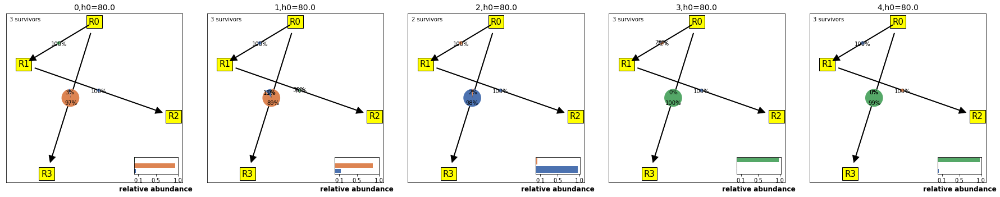

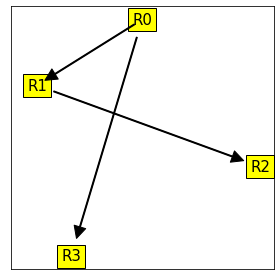

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.00612944070060598
rms of pred - obs, 1st order =  0.006193178782207728


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


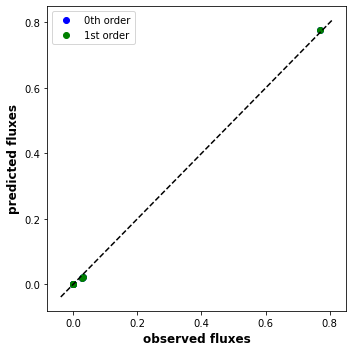

In [18]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='4sp_fATP79.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=4)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=4)



##### When fATP is between 20 and 80 % of the  energy in large Delta G case, max dissipation stops working as some reactions become irreversible effectively

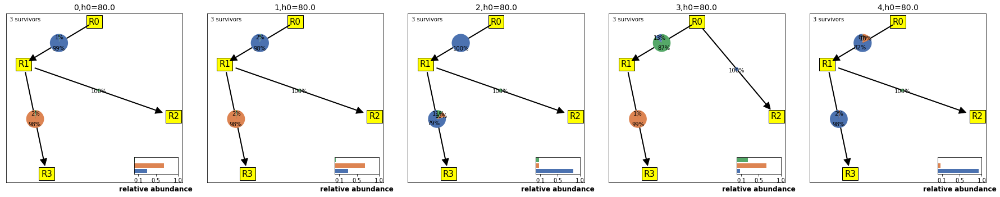

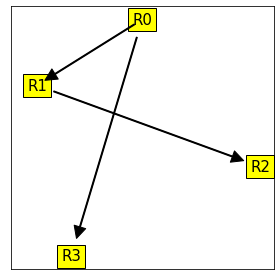

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.558846719616448
rms of pred - obs, 1st order =  0.43642155264751264


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


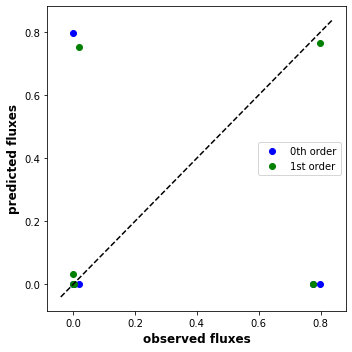

In [20]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='4sp_fATP28.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=4)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=4)



### 6 species

###### Testing

In [15]:
#
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_fATP48.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)

R_expts_list=[np.array([80.,0.,0., 0.,0.,0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([20,16,12,8,4,0]),'E_ATP':1 })
n_res=6
n_reactions=int(n_res*(n_res-1)/2)
# nATP_list=np.array([, 1., 4./3, 1./3, 2./3, 1./3])
# fATP_list=np.random.uniform(.7, 0.9,n_reactions)
fATP_list=np.random.uniform(.4, 0.8,n_reactions)

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.01, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0


KeyboardInterrupt: 

In [2]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_fATP48.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))
plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int),
                                     rel_flux_cutoff=1e-5)

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)



NameError: name 'plot_rxn_nwk_Fluxes_piechart_nspecies' is not defined

## Varying energy scale plot
the notebook analyze_1irr_world_sims.ipynb makes better plots of the results from these simulations.
It plots the functional and network divergence as we vary energy scale.


In [33]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_varyE.dat'

    
number_of_pools = 4
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)

R_exp=np.array([80.,0.,0., 0., 0. ,0.])


Escale_list=np.array([1.,2.,3.,4.,5.,6.,7.,8.])
exp_conditions_list=Escale_list


params_pool = {'m': .01,'reaction_network_type': 'all'}
# params_pool.update({'Energies':np.array([9,6,3,0.])})
base_Energy_array=np.array([5.,4.,3.,2.,1.,0.])

params_pool.update({'Energies':base_Energy_array})

n_res=6
n_reactions=int(n_res*(n_res-1)/2)

mean_KP=1.
mean_KS=1.
mean_kcat=1.



assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

rng = np.random.default_rng(1)
fATP_list=rng.uniform(.4, 0.8,15)
assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list})


df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.01, size=n_reactions)})
    
    N_init, R_init, params_dummy, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_dummy)

                
        params_init.update({'Energies':base_Energy_array*exp_condition})
        params_init=create_reaction_network(len(R_init), params_init)        
#         print (exp_condition, params_init['DG'])
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_dummy})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'Escale': exp_condition,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
create_analysis_df(data_folder,file_name)

[1. 2. 3. 4. 5. 6. 7. 8.]
pool  0
pool  1
pool  2
pool  3


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:88: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 


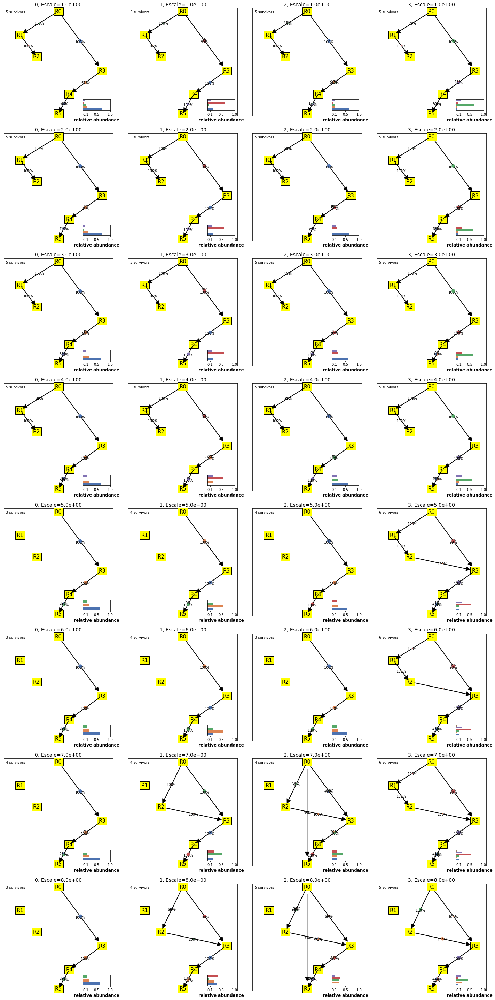

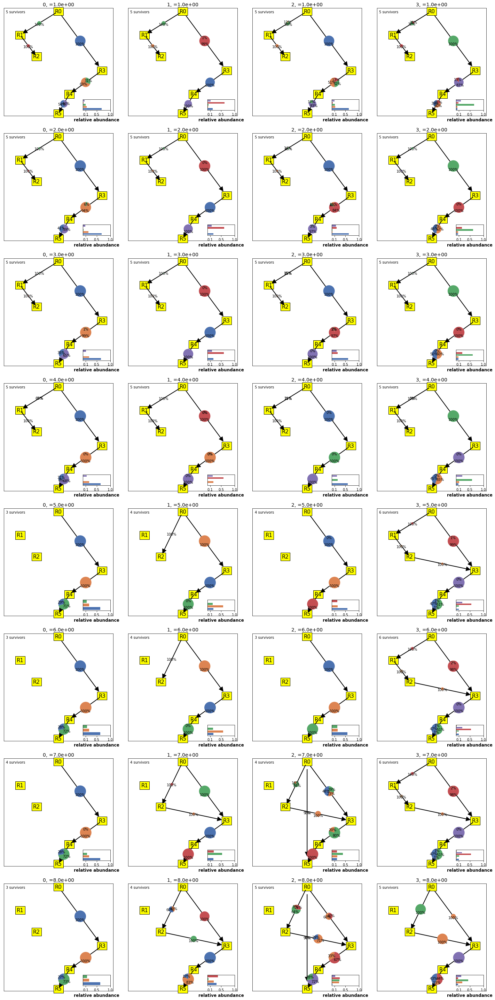

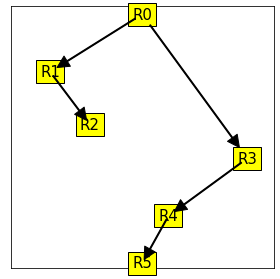

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.0019137319962275869
rms of pred - obs, 1st order =  0.0017561317782682944


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:552: RuntimeWarning: divide by zero encountered in true_divide


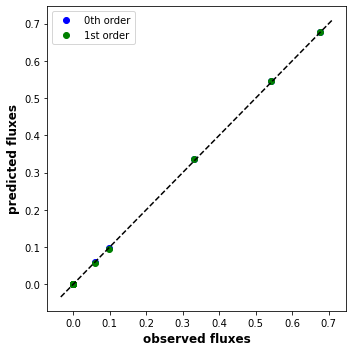

In [34]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_varyE.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, area_scale_factor=10,
                                     pool_ids=np.arange(4).astype(int), param_varied='Escale')
plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(4).astype(int),
                                     rel_flux_cutoff=1e-5)

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)

## vary Energy of 1 reaction
EATP is chosen using the quant residual strategy

each pool has the same energetics. 
EATP and dG of a single reaction is varied in a continuous manner

### try 1 when energies were sort of large.

In [20]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)

rxn_changed_idx=7
file_name = '6sp_vary_E1rxn'+str(rxn_changed_idx)+'.dat'    
number_of_pools = 5
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)

R_exp=np.array([80.,0.,0., 0., 0. ,0.])
params_pool = {'m': .01,'reaction_network_type': 'all'}
params_pool.update({'Energies':np.array([100,80,60,40,20,0])})

EATP_rxn_list=[10,20,30,40,45,50,53,56] ## for rxn 7
exp_conditions_list=EATP_rxn_list

n_res=6
n_reactions=int(n_res*(n_res-1)/2)

mean_KP=1.
mean_KS=1.
mean_kcat=1.

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition',
                 'ATP_allocation':'quant_residue_rand'}

# rng = np.random.default_rng(3)
# fATP_list=rng.uniform(.7, 0.9,15)
# assumptions_init.update({'ATP_allocation':'fATP_list',
#                         'fATP_list':fATP_list})

### using initialize parameters to create the reaction energetics to use in the world
_, _, params_with_energies, _ = initialize_parameters(
                [N_pool, R_exp], params_pool, assumptions_init)
nATP_list=params_with_energies['N_ATP']
## redefine assumptions init with the energies received
assumptions_init={'nu_constraint':'uniform_lognormal',
                  'growth_type': 'thermodynamic_inhibition',
                  'ATP_allocation':'nATP_list',
                  'nATP_list':nATP_list}
df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
print (params_with_energies['DEnergy'])
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.01, size=n_reactions)})
    
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)
        assumptions_exp=deepcopy(assumptions_pool)
        
        ### changing the nATP in the reaction of interest.
        DG_pool= params_pool_filled['DG']
        DE_pool= params_pool_filled['DEnergy']
        nATP_exp= params_pool_filled['N_ATP']
        assert params_pool_filled['E_ATP']==1,'otherwise need to scale'

        nATP_exp[rxn_changed_idx]=exp_condition
        assert -DE_pool[rxn_changed_idx] >exp_condition,'energy gap needs to be large enought to allow for reversibility' 
        assumptions_exp.update({'ATP_allocation':'nATP_list',
                                'nATP_list':nATP_exp})
        params_init.update({'assumptions':assumptions_exp})
        params_init=create_reaction_network(len(R_init), params_init)   

#         print ('pool ',pool_id, 'expt', expt_id,'  val ', exp_condition )
#         print(params_init['assumptions'])
#         print (params_init['DG'])
        
#         print (exp_condition, params_init['DG'])
        N_init, R_init=[N_pool,R_exp]
        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_dummy})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'E1rxn': exp_condition,
                            'rxn_changed_idx':rxn_changed_idx,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
create_analysis_df(data_folder,file_name)

[10, 20, 30, 40, 45, 50, 53, 56]
[ -20  -40  -60  -80 -100  -20  -40  -60  -80  -20  -40  -60  -20  -40
  -20]
pool  0
pool  1
pool  2
pool  3
pool  4


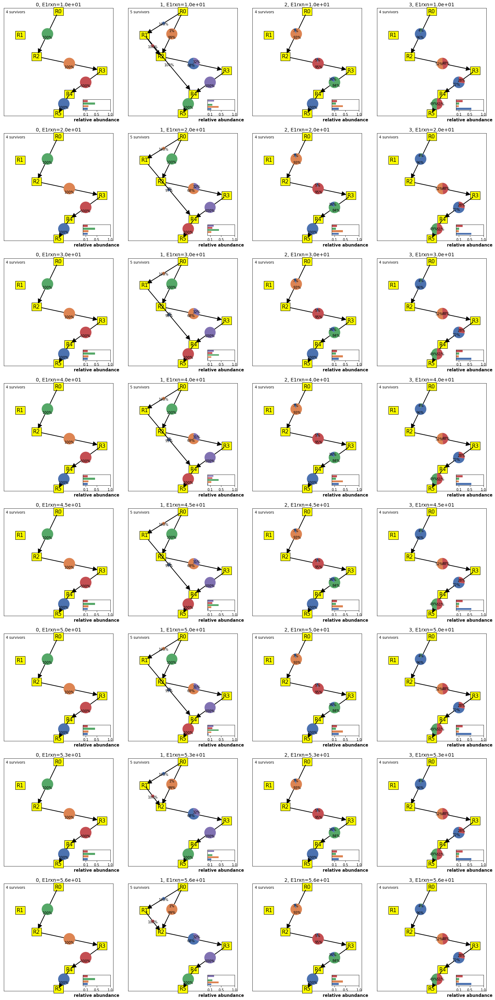

In [22]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
rxn_changed_idx=7
sim_file_name = '6sp_vary_E1rxn'+str(rxn_changed_idx)+'.dat'    
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)

plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(4).astype(int), param_varied='E1rxn',
                                    rel_flux_cutoff=1e-4)

# min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
# plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
# plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
#                                     n_resources=6)

In [18]:
analysis_file_name

'analysis_6sp_vary_E1rxn_test4.dat'

In [16]:
analysis_df.keys()

dict_keys(['exp_conditions_list', 'expt0', 'expt1', 'expt2', 'expt3', 'reaction_substrates', 'reaction_products', 'n_resources', 'n_reactions', 'number_of_pools'])

In [17]:
analysis_df['exp_conditions_list']

[80, 90, 95, 98]

## exact quantization had equal Delta G in all paths.

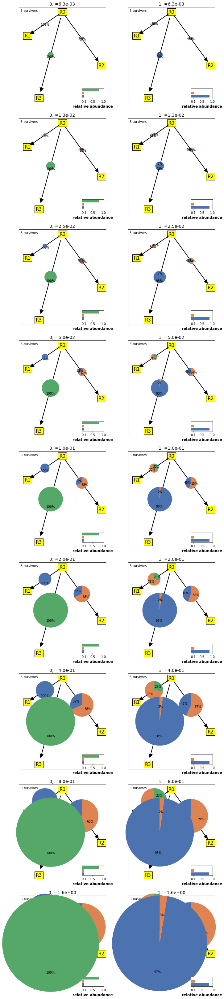

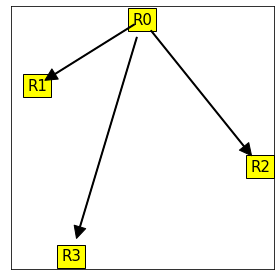

exp:  expt0 delta=  0.00625
rms of pred - obs, 0th order =  2.0580959959821286e-05
rms of pred - obs, 1st order =  2.380956787149429e-05


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


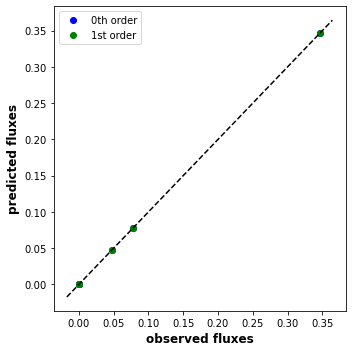

In [9]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/temp_test/'
sim_file_name='sim_dilution.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies_otherparams(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(2).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=4)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=4)



In [10]:
DGvals_onpaths_list

[[-0.5], [-1.0, -1.0], [-2.5, -2.5, -2.5]]

# Large dG with one irreversible reaction

## 4 species
the first irreversible reaction "short-circuits" the paths to any higher energy resource.

So if R0-R1 is irreversible, max dissipation is unaffected.
If R0-R2 is irreversible, then R0-R1 reaction will not survive. (Gets short circuited). 
Any path through R1 to R2 and R3 will anyway not have been selected due to maximum dissipation principle.

If R0-R3 is irreversible, then R0-R1 and R0-R2 both do not survive.

In the true delta=0 limit, these side-reactions will survive, but this will have to be extremely slow dilution rates below what we consider for those reactions to sustain sufficient flux to keep a species alive.


### R0-R1 is irreversible

In [ ]:
#simulate:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '4sp_OneIrr_r0r1.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 300
N_pool = np.ones(n_sp)

R_expts_list=[np.array([80.,0.,0., 0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([30,16,10,0]),'E_ATP':21})
n_res=4
n_reactions=int(n_res*(n_res-1)/2)
# nATP_list=np.array([, 1., 4./3, 1./3, 2./3, 1./3])
dEATP_list=np.array([ 7 , 19,  28, 5.5, 14, 8])

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

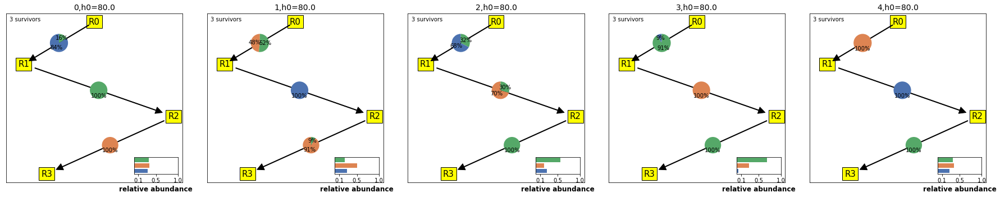

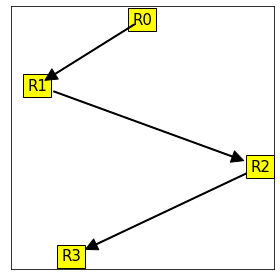

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.00023453611451119637
rms of pred - obs, 1st order =  0.00019697056606742344


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


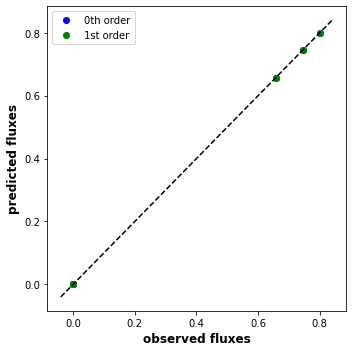

In [9]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='4sp_OneIrr_r0r1.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=4)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=4)



### R0-R2 is irreversible

In [11]:
#simulate
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '4sp_OneIrr_r0r2.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 300
N_pool = np.ones(n_sp)

R_expts_list=[np.array([80.,0.,0., 0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([30,16,10,0]),'E_ATP':21})
n_res=4
n_reactions=int(n_res*(n_res-1)/2)
# dEATP_list=np.array([ 7 , 19,  28, 5.5, 14, 8])
dEATP_list=np.array([ 12 , 7,  28, 5.5, 14, 8])

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


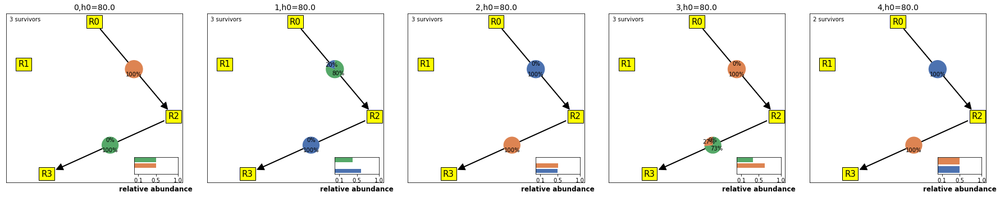

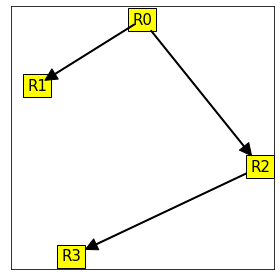

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.0003132088275920852
rms of pred - obs, 1st order =  0.00030786121717771503


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


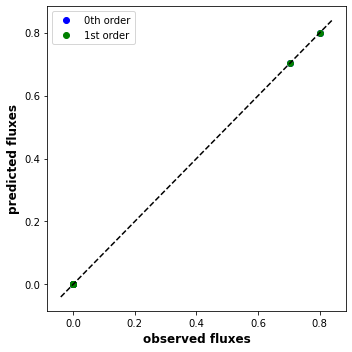

In [12]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='4sp_OneIrr_r0r2.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=4)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=4)



##### verify extinction

In [11]:
#simulate
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '4sp_OneIrr_r0r2_longer.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 300
N_pool = np.ones(n_sp)

R_expts_list=[np.array([80.,0.,0., 0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([30,16,10,0]),'E_ATP':21})
n_res=4
n_reactions=int(n_res*(n_res-1)/2)
# dEATP_list=np.array([ 7 , 19,  28, 5.5, 14, 8])
dEATP_list=np.array([ 12 , 7,  28, 5.5, 14, 8])

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-7:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


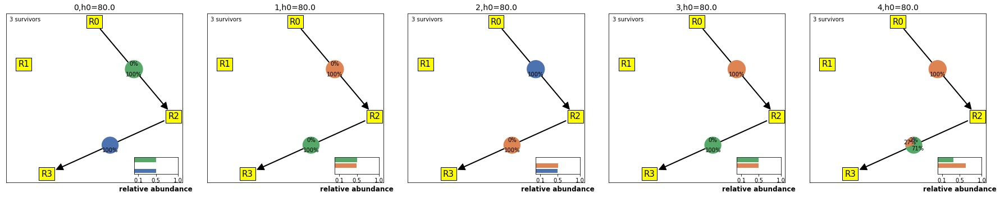

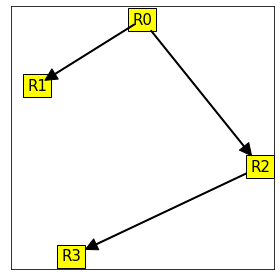

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.000315352113801405
rms of pred - obs, 1st order =  0.0003053421605513292


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:545: RuntimeWarning: divide by zero encountered in true_divide


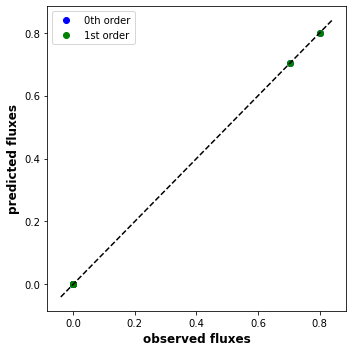

In [14]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='4sp_OneIrr_r0r2_longer.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=4)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=4)



### R0-R3 is irreversible.

In [13]:
#simulate
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '4sp_OneIrr_r0r3.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 300
N_pool = np.ones(n_sp)

R_expts_list=[np.array([80.,0.,0., 0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([30,16,10,0]),'E_ATP':21})
n_res=4
n_reactions=int(n_res*(n_res-1)/2)
# dEATP_list=np.array([ 7 , 19,  28, 5.5, 14, 8])
# dEATP_list=np.array([ 12 , 7,  28, 5.5, 14, 8])
dEATP_list=np.array([ 12 , 19,  7, 5.5, 14, 8])

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


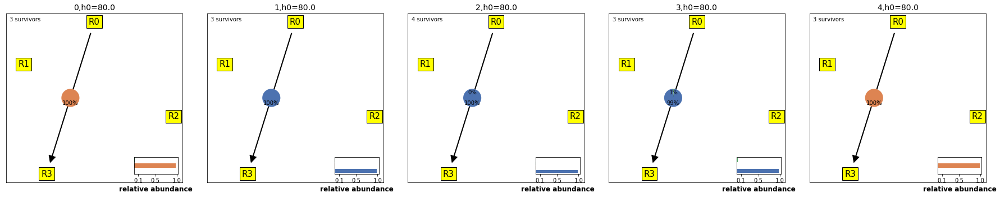

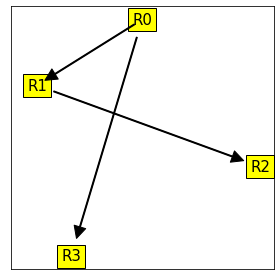

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.0052064850787968886
rms of pred - obs, 1st order =  0.0052064850798284575


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


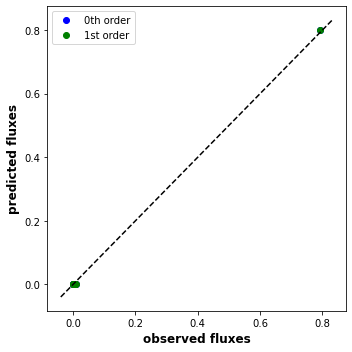

In [14]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='4sp_OneIrr_r0r3.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=4)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=4)



## 6 species 

### all reversible

In [12]:
#simulate:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
# file_name = '6sp_OneIrr_r0r1.dat'
file_name = '6sp_ZeroIrr.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)
n_res=6
R_expts_list=[np.array([80.,0.,0., 0.,0.,0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([37,30,23,16,9,0]),'E_ATP':21})

n_reactions=int(n_res*(n_res-1)/2)

dEATP_list=np.array([ 6.1 , 12.5,  19.3 , 25.7, 34.8, 6.2, 12, 19.9, 27.5, 6.1, 12.2, 20.7, 
                     6.3, 13.5, 7.1])

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=0.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


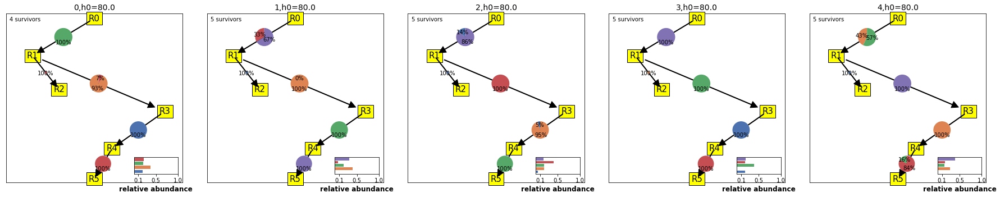

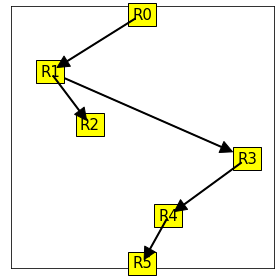

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.00024845027011171836
rms of pred - obs, 1st order =  0.00022216455625635555


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:545: RuntimeWarning: divide by zero encountered in true_divide


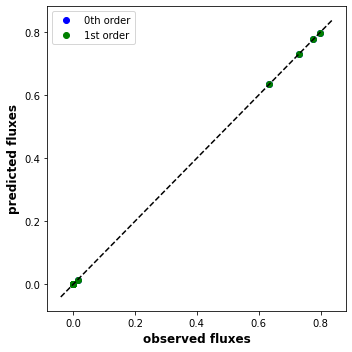

In [13]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_ZeroIrr.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)



### R0-R2 is irreversible

In [15]:
#simulate:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_OneIrr_r0r2.dat'

if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)
n_res=6
R_expts_list=[np.array([80.,0.,0., 0.,0.,0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([37,30,23,16,9,0]),'E_ATP':21})

n_reactions=int(n_res*(n_res-1)/2)

dEATP_list=np.array([ 6.1 , 6,  19.3 , 25.7, 34.8, 6.2, 12, 19.9, 27.5, 6.1, 12.2, 20.7, 
                     6.3, 13.5, 7.1])

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=0.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


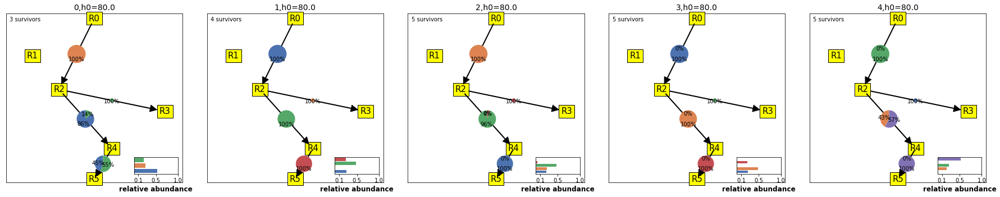

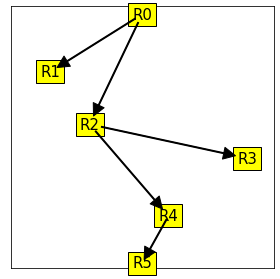

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.0001500389421629254
rms of pred - obs, 1st order =  0.00020333930405858205


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:545: RuntimeWarning: divide by zero encountered in true_divide


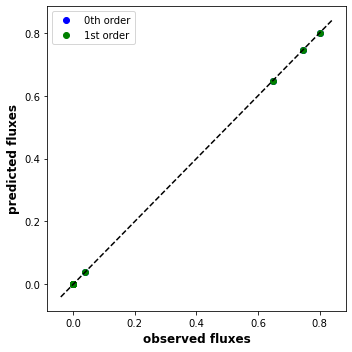

In [16]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_OneIrr_r0r2.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)



In [18]:
analysis_df.keys()

dict_keys(['exp_conditions_list', 'expt0', 'reaction_substrates', 'reaction_products', 'n_resources', 'n_reactions', 'number_of_pools'])

### R0-R4 is irreversible

In [17]:
#simulate:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_OneIrr_r0r4.dat'

if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)
n_res=6
R_expts_list=[np.array([80.,0.,0., 0.,0.,0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([37,30,23,16,9,0]),'E_ATP':21})

n_reactions=int(n_res*(n_res-1)/2)

dEATP_list=np.array([ 6.1 , 12.5,  19.3 , 6, 34.8, 6.2, 12, 19.9, 27.5, 6.1, 12.2, 20.7, 
                     6.3, 13.5, 7.1])

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=0.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


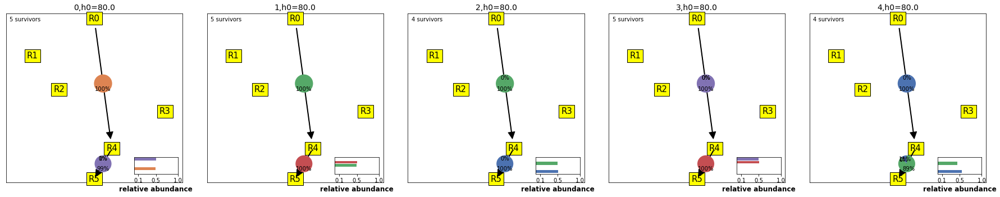

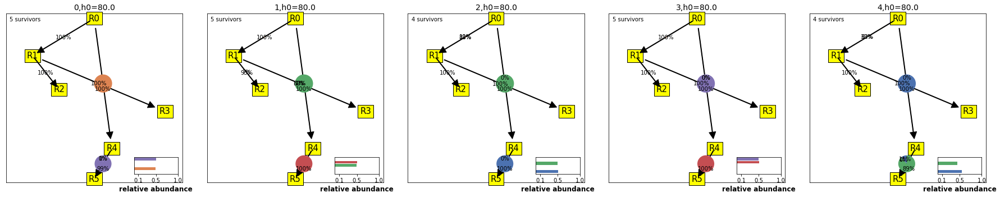

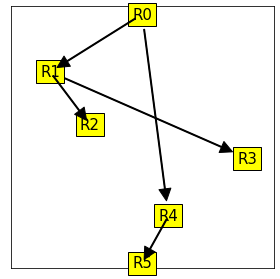

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.0006930122990694466
rms of pred - obs, 1st order =  0.0006902622036151076


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:552: RuntimeWarning: divide by zero encountered in true_divide


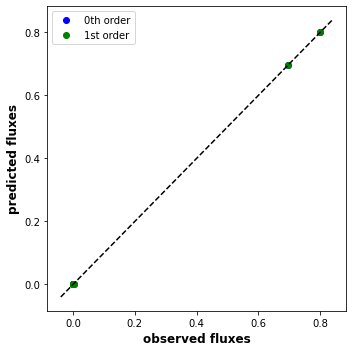

In [6]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_OneIrr_r0r4.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))
plot ('with revised cutoff')
plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int),
                                     rel_flux_cutoff=1e-4)

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)



### R2-R4 is irreversible

In [19]:
#simulate:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_OneIrr_r2r4.dat'

if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)
n_res=6
R_expts_list=[np.array([80.,0.,0., 0.,0.,0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([37,30,23,16,9,0]),'E_ATP':21})

n_reactions=int(n_res*(n_res-1)/2)

dEATP_list=np.array([ 6.1 , 12.5,  19.3 , 25.7, 34.8, 6.2, 12, 19.9, 27.5, 6.1, 6, 20.7, 
                     6.3, 13.5, 7.1])

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=0.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


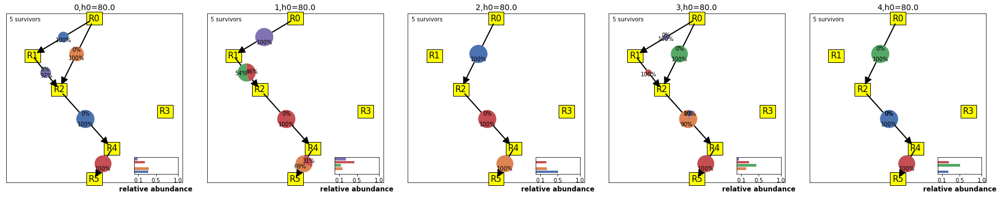

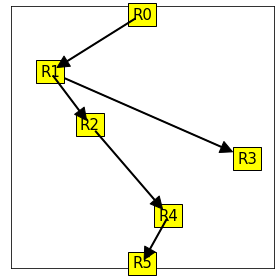

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.2348072652241852
rms of pred - obs, 1st order =  0.23480745438969283


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:545: RuntimeWarning: divide by zero encountered in true_divide


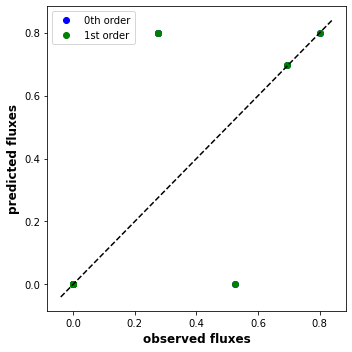

In [20]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_OneIrr_r2r4.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)



In [21]:
DGvals_onpaths_list

[[-0.9000000000000004],
 [-1.5, -1.7000000000000002],
 [-1.6999999999999993, -2.9000000000000004, -2.6000000000000005],
 [-2.3000000000000043, -2.0000000000000018, -9.7, -3.6000000000000005],
 [-2.200000000000003,
  -3.4000000000000004,
  -4.000000000000001,
  -5.399999999999999,
  -11.6]]

In [24]:
world_i.params['popn_cutoff']

0.001

the two paths to R2 were quite similar in EATP and dG_dissipation so sometimes they sort of coexisted..

##### run with stricter steady-state condition

In [32]:
#simulate:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_OneIrr_r2r4.dat'

if not (data_folder): print('define folder.')
    
number_of_pools = 8
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)
n_res=6
R_expts_list=[np.array([80.,0.,0., 0.,0.,0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([37,30,23,16,9,0]),'E_ATP':21})

n_reactions=int(n_res*(n_res-1)/2)

dEATP_list=np.array([ 6.1 , 12.5,  19.3 , 25.7, 34.8, 6.2, 12, 19.9, 27.5, 6.1, 6, 20.7, 
                     6.3, 13.5, 7.1])

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=0.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 3e-7:  ##changed from 1e-5 just for this run## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4
pool  5
pool  6
pool  7


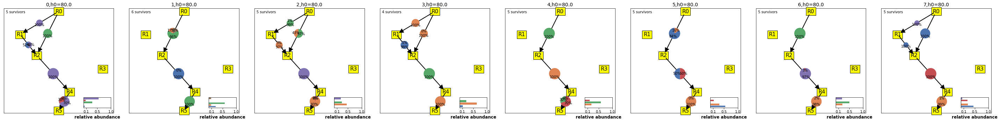

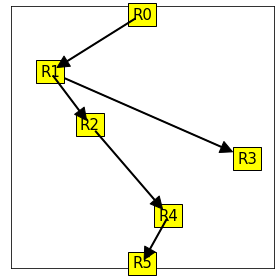

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.22990058157491594
rms of pred - obs, 1st order =  0.22990053690825876


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:545: RuntimeWarning: divide by zero encountered in true_divide


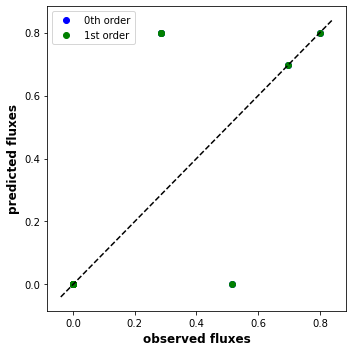

In [35]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_OneIrr_r2r4.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(8).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)



#### made R0-R1-R2 and R0-2 paths more different to see which has the advantage

In [29]:
#simulate:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_OneIrr_r2r4_path_to_r2.dat'

if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)
n_res=6
R_expts_list=[np.array([80.,0.,0., 0.,0.,0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([37,30,23,16,9,0]),'E_ATP':21})

n_reactions=int(n_res*(n_res-1)/2)

# dEATP_list=np.array([ 6.1 , 12.5,  19.3 , 25.7, 34.8, 6.2, 12, 19.9, 27.5, 6.1, 6, 20.7, 
#                      6.3, 13.5, 7.1])
dEATP_list=np.array([ 6.1 , 13,  19.3 , 25.7, 34.8, 6.1, 12, 19.9, 27.5, 6.1, 6, 20.7, 
                     6.3, 13.5, 7.1])
assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=0.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


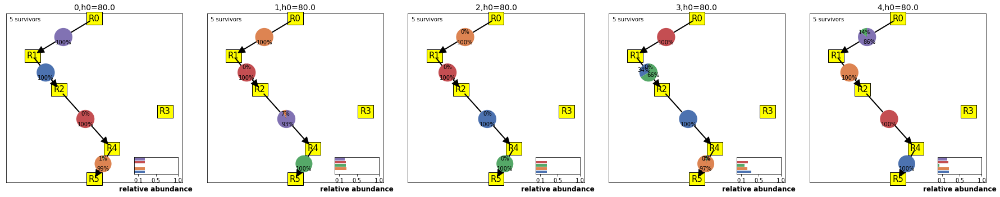

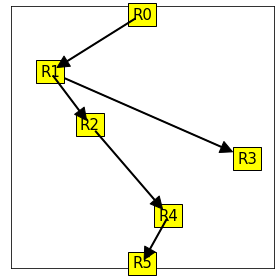

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.00021915158338898163
rms of pred - obs, 1st order =  0.00021419130613982662


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:545: RuntimeWarning: divide by zero encountered in true_divide


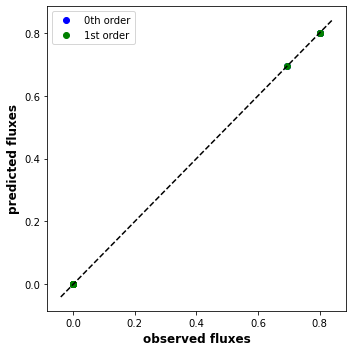

In [30]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_OneIrr_r2r4_path_to_r2.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)



In [31]:
DGvals_onpaths_list

[[-0.9000000000000004],
 [-1.0, -1.8000000000000007],
 [-1.6999999999999993, -2.9000000000000004, -2.700000000000001],
 [-2.3000000000000043, -2.0000000000000018, -9.8, -3.6000000000000005],
 [-2.200000000000003,
  -3.4000000000000004,
  -4.100000000000001,
  -5.399999999999999,
  -11.700000000000001]]

##### alt2

alternative way to change the dG on paths to R2

In [36]:
#simulate:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_OneIrr_r2r4_path_to_r2_2.dat'

if not (data_folder): print('define folder.')
    
number_of_pools = 5
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)
n_res=6
R_expts_list=[np.array([80.,0.,0., 0.,0.,0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([37,30,23,16,9,0]),'E_ATP':21})

n_reactions=int(n_res*(n_res-1)/2)

# dEATP_list=np.array([ 6.1 , 12.5,  19.3 , 25.7, 34.8, 6.2, 12, 19.9, 27.5, 6.1, 6, 20.7, 
#                      6.3, 13.5, 7.1])
dEATP_list=np.array([ 6. , 12.5,  19.3 , 25.7, 34.8, 5.5, 12, 19.9, 27.5, 6.1, 6, 20.7, 
                     6.3, 13.5, 7.1])
assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition'}

assumptions_init.update({'ATP_allocation':'dEATP_list',
                        'dEATP_list':dEATP_list})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=0.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.1, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2
pool  3
pool  4


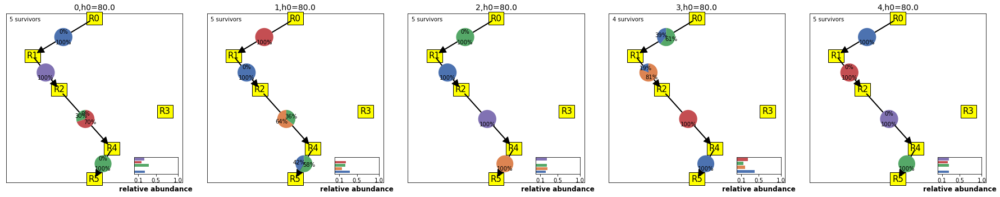

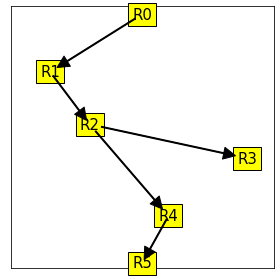

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.0001401228139712391
rms of pred - obs, 1st order =  0.00012866008431503277


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:545: RuntimeWarning: divide by zero encountered in true_divide


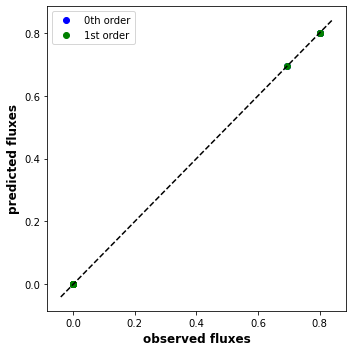

In [37]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_OneIrr_r2r4_path_to_r2_2.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(5).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)



# no resource dilution anabolism model
- b_i needs to small enough that the resources don't get depleted below Ks, which would allow substrate competition to start dominating.

- need to check for steady-state in resource concentrations as well to ensure steady-state isn't reached because network is just getting jammed.

In [96]:
#
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_anabolism_noRdilution2.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 3
# Create and initialize pool
n_sp = 600 #300
N_pool = np.ones(n_sp)
# R_expts_list=[np.array([40.,0.,0 ,0.]),np.array([20.,0.,0 ,0.]),
#              np.array([10.,0.,0 ,0.]),np.array([5.,0.,0 ,0.])]
# R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.]),np.array([40.,0.,0., 0., 0. ,0.]),
#              np.array([20.,0.,0., 0., 0. ,0.]),np.array([10.,0.,0., 0., 0. ,0.])]

R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

n_res=len(R_exp)

params_pool = {'m': .01,'reaction_network_type': 'all', 'tau':10.}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

# params_pool.update({'Energies':np.array([15,12,9,6,3,0.])})
params_pool.update({'Energies':np.array([5,4,3,2,1,0.])})
# params_pool.update({'b_i':np.ones(n_res)*.005}) 
params_pool.update({'b_i':np.ones(n_res)*.001*np.random.lognormal(0,.01,n_res)}) 

## b needs to be small so that substrate depletion is not the method of competition.

n_res=6
n_reactions=int(n_res*(n_res-1)/2)
fATP_list=np.random.uniform(.15, .85,n_reactions) ## between .15 and.85 to be reasonable

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'anabolism_noRdilution'}

assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list,
                        'supply': 'external_noRdilution'})




df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=0.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.01, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            check_SS2 = np.max(np.abs(dRdt(Ncurrent, Rcurrent, world_i.params)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5 and check_SS2 < 1e-3:# was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2


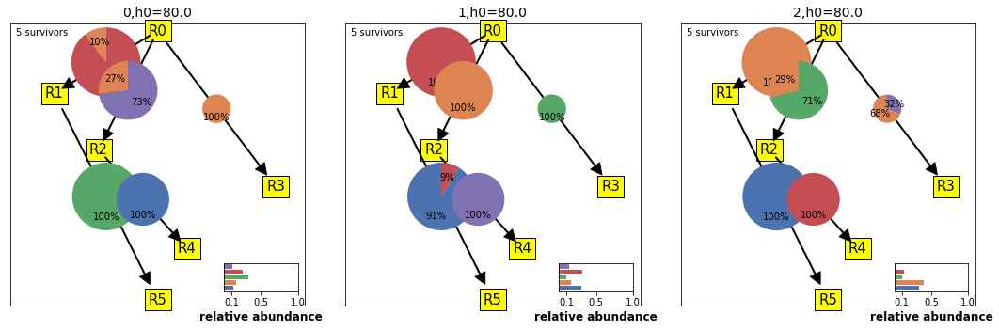

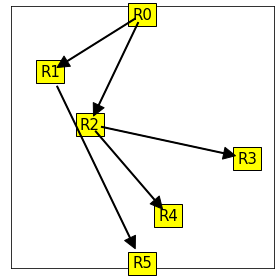

In [97]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_anabolism_noRdilution.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(3).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
# plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
#                                     n_resources=6)

## testing implementation

In [81]:
#
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = '6sp_test.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 3
# Create and initialize pool
n_sp = 600 #300
N_pool = np.ones(n_sp)
# R_expts_list=[np.array([40.,0.,0 ,0.]),np.array([20.,0.,0 ,0.]),
#              np.array([10.,0.,0 ,0.]),np.array([5.,0.,0 ,0.])]
# R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.]),np.array([40.,0.,0., 0., 0. ,0.]),
#              np.array([20.,0.,0., 0., 0. ,0.]),np.array([10.,0.,0., 0., 0. ,0.])]

R_expts_list=[np.array([80.,0.,0., 0., 0. ,0.])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list

n_res=len(R_exp)

params_pool = {'m': .02,'reaction_network_type': 'all', 'tau':10.}

mean_KP=1.#1.
mean_KS=1.#1.
mean_kcat=1.#1.

# params_pool.update({'Energies':np.array([15,12,9,6,3,0.])})
params_pool.update({'Energies':np.array([5,4,3,2,1,0.])})
# params_pool.update({'b_i':np.ones(n_res)*.005}) 
params_pool.update({'b_i':np.ones(n_res)*.001*np.random.lognormal(0,.01,n_res)}) 

# params_pool.update({'b_i':np.ones(n_res)*0}) 
## b needs to be small so that substrate depletion is not the method of competition.

n_res=6
n_reactions=int(n_res*(n_res-1)/2)
fATP_list=np.random.uniform(.15, .85,n_reactions) ## between .15 and.85 to be reasonable

assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'anabolism_noRdilution'}

assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list,
                        'supply': 'external_noRdilution'})

df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}
print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=0.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.01, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)          
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]

        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            check_SS2 = np.max(np.abs(dRdt(Ncurrent, Rcurrent, world_i.params)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5 and check_SS2 < 1e-3:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2


In [82]:
Rcurrent

array([ 0.33064262,  0.60492205,  1.22666909,  2.67215211,  4.59660404,
       12.0659871 ])

In [75]:
Rcurrent

array([ 0.83693875,  0.98997322,  2.69311606,  5.37206496,  8.20879622,
       18.1884852 ])

In [69]:
Ncurrent[Ncurrent > world_i.params['popn_cutoff']]

array([2118.48135882, 1591.10647685, 1487.42517662,  170.51551465,
       3922.58756488])

In [61]:
Rcurrent

array([0.03782312, 0.04603092, 0.06842626, 0.14911768, 0.24241332,
       0.53521492])

In [53]:
Ncurrent[Ncurrent > world_i.params['popn_cutoff']]

array([ 4.42523137,  7.84624206, 81.52538575,  0.42721481, 11.28506936])

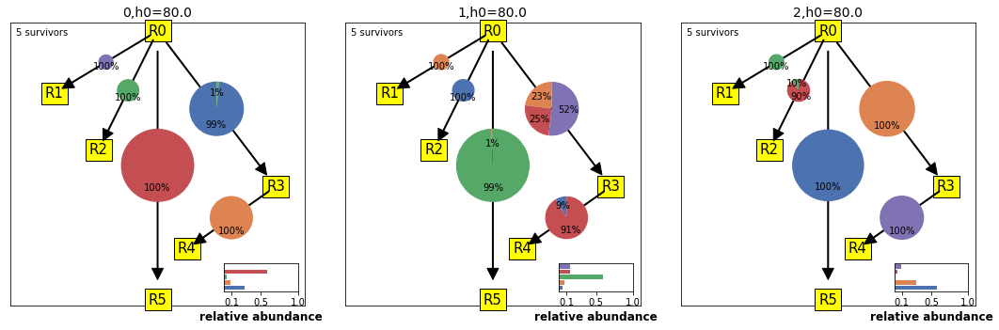

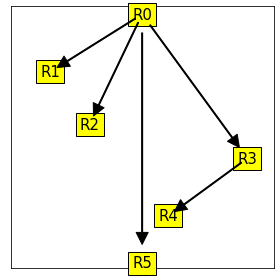

exp:  expt0 delta=  0.02
rms of pred - obs, 0th order =  1.14589631376381
rms of pred - obs, 1st order =  1.1457830067919754


/Users/ashish/anaconda3/envs/thermo/lib/python3.7/site-packages/ipykernel_launcher.py:62: RuntimeWarning: divide by zero encountered in true_divide


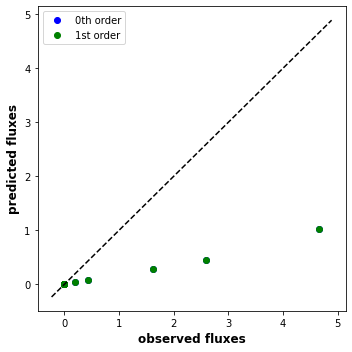

In [83]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='6sp_test.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(3).astype(int))


min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)

# Dynamic yield model
simplified implementation of the dynamic yield from Heijnen assuming a constant value for dissipation per mol of biomass
Biomass yield is no longer proportional to ATP production. atp production just is relevant for free energy dissipation used in kinetic equation.

In [42]:
#
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
if not os.path.isdir(data_folder):os.mkdir(data_folder)
file_name = 'dynamicY1.dat'
if not (data_folder): print('define folder.')
    
number_of_pools = 3
# Create and initialize pool
n_sp = 600
N_pool = np.ones(n_sp)

R_expts_list=[np.array([80.,0.,0., 0.,0.,0. ])]
R_exp=R_expts_list[0]
exp_conditions_list=R_expts_list


assumptions_init={'nu_constraint':'uniform_lognormal',
                        'growth_type': 'thermodynamic_inhibition_dynamicYield'}
params_pool.update({'Diss_per_Biomass': 1.})

params_pool = {'m': .01,'reaction_network_type': 'all'}

mean_KP=1.
mean_KS=1.
mean_kcat=1.

params_pool.update({'Energies':np.array([5,4,3,2,1,0]),'E_ATP':1 })
n_res=6
n_reactions=int(n_res*(n_res-1)/2)

rng = np.random.default_rng(53) ## random seed to add more pools id required
fATP_list=rng.uniform(.4, 0.8,n_reactions)
assumptions_init.update({'ATP_allocation':'fATP_list',
                        'fATP_list':fATP_list})
df_master = {'number_of_pools': number_of_pools, 'number_of_experiments': len(
    exp_conditions_list), 'exp_conditions_list': exp_conditions_list}

print(exp_conditions_list)
for pool_id in range(number_of_pools):
    print ('pool ',pool_id) 
    propagation_time_step = 10
    pool_df = {}
    
    params_pool_i=deepcopy(params_pool)
    params_pool_i.update({'K_P': np.random.lognormal(mean=np.log(mean_KP), 
                                                     sigma=.01, size=n_reactions),
                         'K_S': np.random.lognormal(mean=np.log(mean_KS), 
                                                     sigma=0.01, size=n_reactions),
                         'Kcat': np.random.lognormal(mean=np.log(mean_kcat), 
                                                     sigma=0.01, size=n_reactions)})
    N_init, R_init, params_pool_filled, assumptions_pool = initialize_parameters(
                [N_pool, R_exp], params_pool_i, assumptions_init)
       
    for expt_id, exp_condition in enumerate(exp_conditions_list):
#         print (assumptions_pool)
        params_init=deepcopy(params_pool_filled)

                
        R_exp=exp_condition
        params_init.update({'Rsupply':R_exp})
        N_init, R_init=[N_pool,R_exp]


        def dNdt(N, R, params):
            return MakeConsumerDynamics(assumptions_init)(N, R, params)
        def dRdt(N, R, params):
            return MakeResourceDynamics(assumptions_init)(N, R, params)
        world_i=Species_with_Reactions([N_init, R_init], [dNdt, dRdt], params_init)

        if expt_id == 0:
#             pool_df.update({'params': params_pool_filled})
            pool_df.update({'N_init': N_init})
#         df_exp_condition = {'R_supply': R_exp,'assumptions':assumptions_pool}
        df_exp_condition = {'R_supply': exp_condition,
                            'assumptions':assumptions_pool,
                           'params':params_init}
        
        

        # simulate expt till steady state.
        reached_SteadyState = False
        currentTime = 0
        Ncurrent = N_init
        Rcurrent = R_init
        ctr = 0

        while (reached_SteadyState == False):
            Ncurrent, Rcurrent = IntegrateDynamics(world_i,world_i.params, T0=currentTime,
                                                   T=currentTime + propagation_time_step,
                                                   ns=30, return_all=False)
            currentTime = currentTime + propagation_time_step
            if Ncurrent is None:
                print ('breaking')
                sys.exit(1)
                break
            Ncurrent[Ncurrent < world_i.params['popn_cutoff']] = 0.0
            check_SS = np.max(np.abs(compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)))
            world_i.update_state(Ncurrent,Rcurrent)
            if check_SS < 1e-5:## was 1e-3 till 3-4-21
                reached_SteadyState = True
                if len(np.nonzero(Ncurrent)[0])>len(Rcurrent):
                    print ('competitive exclusion issue', Ncurrent[np.nonzero(Ncurrent)],Rcurrent)
                    print (compute_dlogNdt(Ncurrent, Rcurrent, world_i.params, dNdt)[np.nonzero(Ncurrent)])
                    sys.exit(1)
            elif ctr > 500:
                print('too long.',exp_condition)
                print(Ncurrent)
                print(check_SS)
                sys.exit(1.)
            ctr += 1
        SS_df = {'SS_values': [Ncurrent, Rcurrent, currentTime]}
        df_exp_condition.update({'SS_values': [Ncurrent, Rcurrent, currentTime]})
#         pool_df.update({'expt'+str(expt_id): SS_df})
        pool_df.update({'expt'+str(expt_id): df_exp_condition})
    df_master.update({'pool'+str(pool_id): pool_df})

with open(data_folder+file_name, 'wb') as f:
    pickle.dump(df_master, f, protocol=2)
    
    
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
create_analysis_df(data_folder,file_name)

[array([80.,  0.,  0.,  0.,  0.,  0.])]
pool  0
pool  1
pool  2


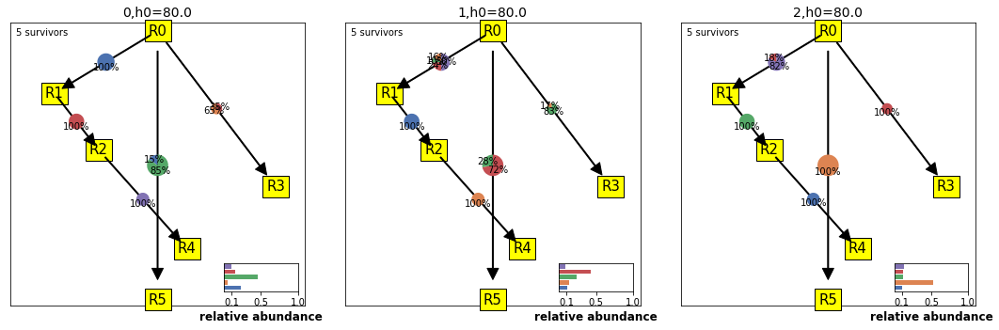

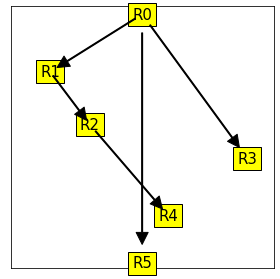

exp:  expt0 delta=  0.01
rms of pred - obs, 0th order =  0.006146949849105308
rms of pred - obs, 1st order =  0.0053746010324103545


/Users/ashish/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:552: RuntimeWarning: divide by zero encountered in true_divide


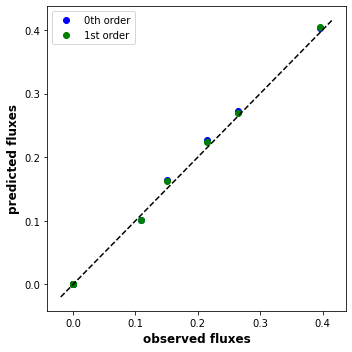

In [44]:
data_folder='/Users/ashish/Downloads/simple_metabolic_CR_model_simdata/multispecies_sims/'
sim_file_name='dynamicY1.dat'
analysis_file_name = 'analysis_'+sim_file_name

with open(data_folder+analysis_file_name, 'rb') as f:
    analysis_df = pickle.load(f)
with open(data_folder+sim_file_name, 'rb') as f:
    sim_data_df = pickle.load(f)


# plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
#                                      pool_ids=np.arange(5).astype(int))
plot_rxn_nwk_Fluxes_piechart_nspecies(analysis_df, area_scale_factor=1,
                                     pool_ids=np.arange(3).astype(int),
                                     rel_flux_cutoff=1e-4)

min_DG_path_list,min_DG_list, DGvals_onpaths_list=get_max_dissipative_rxn_paths(sim_data_df)
plot_nwk_predicted_by_maxDissip(min_DG_path_list,min_DG_list,sim_data_df,n_resources=6)
plot_flux_prediction(analysis_df, min_DG_path_list, min_DG_list, sim_data_df,
                                    n_resources=6)

